**Imports do Projeto**

In [2]:
import pandas as pd
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

**Anos análisado**

In [3]:
anos = ['2019', '2020', '2021', '2022', '2023']


**Gera uma tabela consolidada a partir dos arquivos CSV na pasta especificada.**

***
    A função realiza as seguintes etapas:
    1. Lê todos os arquivos CSV na pasta fornecida.
    2. Extrai o total de casos notificados e as informações de ano e região de cada arquivo.
    3. Mapeia as siglas das regiões para seus nomes e códigos correspondentes.
    4. Cria um DataFrame consolidado com os dados extraídos.
    5. Salva o DataFrame consolidado em um arquivo CSV chamado 'tabela_consolidada.csv'.

    Parâmetros:
    pasta_csv (str): O caminho da pasta que contém os arquivos CSV.
***

In [4]:
def gerar_tabela_consolidada(pasta_csv):
   
    mapa_regioes = {
        'AR': {'cidade': 'Angra dos Reis', 'COD_CIDADE': 32},
        'RJ': {'cidade': 'Rio de Janeiro', 'COD_CIDADE': 33},
        'CG': {'cidade': 'Campos de Goytacazes', 'COD_CIDADE': 34},
        'VA': {'cidade': 'Valença', 'COD_CIDADE': 35}
    }

    consolidados = []

    for arquivo in os.listdir(pasta_csv):
        if arquivo.endswith(".csv"):
            caminho_arquivo = os.path.join(pasta_csv, arquivo)
            
            try:
                df = pd.read_csv(caminho_arquivo, encoding='latin1')
            except UnicodeDecodeError:
                df = pd.read_csv(caminho_arquivo, encoding='utf-8')
            
            total = df['Casos notificados'].iloc[-1]
            
            nome, _ = os.path.splitext(arquivo)
            partes = nome.split('_')
            ano = partes[0][-4:]
            sigla_regiao = partes[1]
            
            regiao_info = mapa_regioes.get(sigla_regiao)
            if regiao_info:
                cidade = regiao_info['cidade']
                cod_cidade = regiao_info['COD_CIDADE']
                
                consolidados.append({
                    'Nome do Arquivo': arquivo,
                    'Total': total,
                    'Ano': ano,
                    'Região': cidade,
                    'COD_CIDADE': cod_cidade
                })

    df_consolidado = pd.DataFrame(consolidados)

    df_consolidado.to_csv('tabela_consolidada.csv', index=False)

    print("Tabela consolidada salva como 'tabela_consolidada.csv'.")


In [5]:
gerar_tabela_consolidada('casos_dengue_rj')

Tabela consolidada salva como 'tabela_consolidada.csv'.


**Atualiza a tabela de saúde com os totais de casos de dengue da tabela consolidada.**
***
    Parâmetros:
    anos (list): Lista de anos a serem considerados para atualização.
***

In [6]:
def atualizar_tabela_saude(anos):
  
    df_consolidado = pd.read_csv('tabela_consolidada.csv')
    df_saude = pd.read_csv('2019-2023-casos de dengue.csv')
    df_saude.columns = df_saude.columns.str.strip()
    df_saude.columns = df_saude.columns.astype(str)

    for ano in anos:
        if ano in df_saude.columns:
            df_saude[ano] = pd.to_numeric(df_saude[ano], errors='coerce')

    for _, row in df_consolidado.iterrows():
        ano = str(row['Ano'])
        total = row['Total']
        cod_cidade = row['COD_CIDADE']
        
        print(f"Processando COD_CIDADE: {cod_cidade}, Ano: {ano}, Total: {total}")

        if cod_cidade in df_saude['COD_CIDADE'].values:
            if ano in df_saude.columns:
                current_value = df_saude.loc[df_saude['COD_CIDADE'] == cod_cidade, ano].values[0]
                if pd.isna(current_value):
                    current_value = 0
                
                new_value = current_value + total
                df_saude.loc[df_saude['COD_CIDADE'] == cod_cidade, ano] = new_value
                
                print(f"Atualizando {ano} para COD_CIDADE {cod_cidade}: novo valor é {new_value}")
            else:
                print(f"Ano '{ano}' não encontrado nas colunas da tabela de saúde.")
        else:
            print(f"COD_CIDADE '{cod_cidade}' não encontrado na tabela de saúde.")

    df_saude.to_csv('tabela_saude_atualizada.csv', index=False)

    print("Tabela de saúde atualizada salva como 'tabela_saude_atualizada.csv'.")


In [7]:
atualizar_tabela_saude(anos)

Processando COD_CIDADE: 32, Ano: 2019, Total: 1764
Atualizando 2019 para COD_CIDADE 32: novo valor é 1764
Processando COD_CIDADE: 34, Ano: 2019, Total: 177
Atualizando 2019 para COD_CIDADE 34: novo valor é 177
Processando COD_CIDADE: 33, Ano: 2019, Total: 22046
Atualizando 2019 para COD_CIDADE 33: novo valor é 22046
Processando COD_CIDADE: 35, Ano: 2019, Total: 190
Atualizando 2019 para COD_CIDADE 35: novo valor é 190
Processando COD_CIDADE: 32, Ano: 2020, Total: 187
Atualizando 2020 para COD_CIDADE 32: novo valor é 187
Processando COD_CIDADE: 34, Ano: 2020, Total: 18
Atualizando 2020 para COD_CIDADE 34: novo valor é 18
Processando COD_CIDADE: 33, Ano: 2020, Total: 1536
Atualizando 2020 para COD_CIDADE 33: novo valor é 1536
Processando COD_CIDADE: 35, Ano: 2020, Total: 104
Atualizando 2020 para COD_CIDADE 35: novo valor é 104
Processando COD_CIDADE: 32, Ano: 2021, Total: 104
Atualizando 2021 para COD_CIDADE 32: novo valor é 104
Processando COD_CIDADE: 34, Ano: 2021, Total: 94
Atualizan

**Este código tem como objetivo limpar e ajustar os dados de população de um arquivo CSV. Primeiro, ele remove quaisquer símbolos ou letras que possam estar misturados nos números da população. Depois, transforma esses valores em números e descarta os dados inválidos. Em seguida, o código encontra o valor mais baixo e o mais alto da população e ajusta todos os números para uma escala de 0 a 1, para facilitar comparações. No final, ele salva esses novos valores em um novo arquivo e mostra o resultado.**
**Lê um arquivo CSV com dados de população, normaliza a coluna 'População Total' e salva os dados normalizados em um novo arquivo CSV.**

***
    Parâmetros:
    - input_file (str): O caminho do arquivo CSV de entrada (padrão: 'habitantes-cidades.csv').
    - output_file (str): O caminho do arquivo CSV de saída (padrão: 'habitantes_normalizados.csv').
***

In [8]:
def normalizar_populacao(input_file='habitantes-cidades.csv', output_file='habitantes_normalizados.csv'):
    
    df = pd.read_csv(input_file)
    df['População Total'] = df['População Total'].astype(str).str.replace(r'\D', '', regex=True)
    df['População Total'] = pd.to_numeric(df['População Total'], errors='coerce')
    df = df.dropna(subset=['População Total'])
    
    min_pop = df['População Total'].min()
    max_pop = df['População Total'].max()
    
    df['População Normalizada'] = (df['População Total'] - min_pop) / (max_pop - min_pop)

    df.to_csv(output_file, index=False)

    print(f"\nDados normalizados salvos em '{output_file}'.")
    print(df)

In [9]:
normalizar_populacao()


Dados normalizados salvos em 'habitantes_normalizados.csv'.
    COD_CIDADE       Região de Saúde  População Total Estado  \
0            1              Cruzeiro          3151400     DF   
1            2            Lago Norte          3582100     DF   
2            3              Lago Sul          2937700     DF   
3            4          Plano Piloto         20618300     DF   
4            5    Sudoeste Octogonal          5003300     DF   
5            6                Varjão           879300     DF   
6            7        Candangolândia          1601900     DF   
7            8            Estrutural          3068700     DF   
8            9                 Guará         10784700     DF   
9           10    Núcleo Bandeirante          2313400     DF   
10          11              Park Way          2034500     DF   
11          12        Riacho Fundo I          3529100     DF   
12          13       Riacho Fundo II          3710800     DF   
13          14                   SIA       

**Pegado somente as colunas necessárias**

In [10]:
# Colunas que queremos filtrar nos arquivos CSV
colunas_desejadas = [
    'Data', 
    'Hora UTC', 
    'PRECIPITAÇÃO TOTAL, HORÁRIO (mm)', 
    'TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)', 
    'TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)', 
    'UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)', 
    'UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'
]

def processar_csv(diretorio, arquivo, diretorio_novo):
    # Caminho completo do arquivo
    caminho_arquivo = os.path.join(diretorio, arquivo)
    # Lê o arquivo CSV
    df = pd.read_csv(caminho_arquivo)

    # Remove espaços em branco dos nomes das colunas
    df.columns = df.columns.str.strip()

    # Filtra apenas as colunas que existem no arquivo
    colunas_presentes = [coluna for coluna in colunas_desejadas if coluna in df.columns]
    df_filtrado = df[colunas_presentes]

    # Caminho completo para salvar o novo arquivo CSV
    novo_caminho = os.path.join(diretorio_novo, arquivo)
    df_filtrado.to_csv(novo_caminho, index=False)

    print(f'Arquivo {arquivo} processado. Novo arquivo salvo como {novo_caminho}.')

# Iterar sobre cada ano
for ano in anos:
    diretorio = ano
    diretorio_novo = f'{ano}-formatado'
    
    # Cria o diretório novo se não existir
    os.makedirs(diretorio_novo, exist_ok=True)

    # Lista todos os arquivos CSV no diretório atual
    arquivos_csv = [f for f in os.listdir(diretorio) if f.endswith('.csv')]

    # Processa cada arquivo no diretório
    for arquivo in arquivos_csv:
        processar_csv(diretorio, arquivo, diretorio_novo)


Arquivo 1-2019-BRAZLANDIA.csv processado. Novo arquivo salvo como 2019-formatado\1-2019-BRAZLANDIA.csv.
Arquivo 2-2019-AGUAS EMENDADAS.csv processado. Novo arquivo salvo como 2019-formatado\2-2019-AGUAS EMENDADAS.csv.
Arquivo 3-2019-BRASILIA.csv processado. Novo arquivo salvo como 2019-formatado\3-2019-BRASILIA.csv.
Arquivo 4-2019-GAMA.csv processado. Novo arquivo salvo como 2019-formatado\4-2019-GAMA.csv.
Arquivo 5-2019-PARANOA.csv processado. Novo arquivo salvo como 2019-formatado\5-2019-PARANOA.csv.
Arquivo 6-2019-CAMPOSDOSGOYTACAZES.csv processado. Novo arquivo salvo como 2019-formatado\6-2019-CAMPOSDOSGOYTACAZES.csv.
Arquivo 7-2019-ANGRADOSREIS.csv processado. Novo arquivo salvo como 2019-formatado\7-2019-ANGRADOSREIS.csv.
Arquivo 8-2019-RIODEJANEIRO.csv processado. Novo arquivo salvo como 2019-formatado\8-2019-RIODEJANEIRO.csv.
Arquivo 9-2019-VALENCA.csv processado. Novo arquivo salvo como 2019-formatado\9-2019-VALENCA.csv.
Arquivo 1-2020-BRAZLANDIA.csv processado. Novo arquivo s

**Criando a média, os estremos e a normalização: O código processa dados climáticos de arquivos CSV organizados por ano. Ele define funções para calcular médias e extremos, normalizar os dados usando Min-Max Scaling e criar arquivos CSV com os resultados. Para cada ano, lê os arquivos, acumula as informações, calcula as estatísticas e salva os dados em arquivos separados para médias, extremos e normalização, finalizando com uma mensagem de conclusão do processamento.**

In [11]:
# Lista de diretórios de anos formatados
diretorios_anos = ['2019-formatado', '2020-formatado', '2021-formatado', '2022-formatado', '2023-formatado']

# Função para calcular as médias e extremos de cada arquivo e adicionar COD_REG
def calcular_medias_e_extremos(arquivo, diretorio):
    df = pd.read_csv(os.path.join(diretorio, arquivo))

    # Limpa espaços em branco dos nomes das colunas
    df.columns = df.columns.str.strip()

    # Substitui vírgulas por pontos e converte colunas numéricas
    df.replace(',', '.', regex=True, inplace=True)
    df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'] = pd.to_numeric(df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'], errors='coerce')
    df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'] = pd.to_numeric(df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'], errors='coerce')
    df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'] = pd.to_numeric(df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'], errors='coerce')
    df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'] = pd.to_numeric(df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'], errors='coerce')
    df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'] = pd.to_numeric(df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'], errors='coerce')

    # Acumula os dados ignorando os valores vazios (NaN)
    todos_precipitacao = df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'].dropna().tolist()
    todos_temp_maxima = df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'].dropna().tolist()
    todos_temp_minima = df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'].dropna().tolist()
    todos_umidade_maxima = df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'].dropna().tolist()
    todos_umidade_minima = df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'].dropna().tolist()

    # Adiciona coluna COD_REG com o primeiro caractere do nome do arquivo
    df['COD_REG'] = arquivo[0]

    return df, todos_precipitacao, todos_temp_maxima, todos_temp_minima, todos_umidade_maxima, todos_umidade_minima

# Normaliza uma coluna usando Min-Max Scaling
def normalizar_max_min(coluna, minimo, maximo):
    if maximo == minimo:
        # Evita divisão por zero, atribui 0.5 se todos os valores forem constantes
        return coluna.apply(lambda x: 0.5)
    else:
        return (coluna - minimo) / (maximo - minimo)

# Função para processar todos os arquivos de um ano
def processar_ano_normalizado(diretorio):
    # Lista todos os arquivos CSV no diretório
    arquivos_csv = [f for f in os.listdir(diretorio) if f.endswith('.csv')]

    # Listas para acumular todos os dados
    medias_data = []
    extremos_data = []
    normalizacao_data = []

    # Processa cada arquivo CSV individualmente e acumula dados
    for arquivo in arquivos_csv:
        df, todos_precipitacao, todos_temp_maxima, todos_temp_minima, todos_umidade_maxima, todos_umidade_minima = calcular_medias_e_extremos(arquivo, diretorio)
        
        # Calcula os extremos
        extremos = {
            'COD_REG': arquivo[0],
            'Arquivo': arquivo,
            'Mínimo de Precipitação': min(todos_precipitacao) if todos_precipitacao else float('nan'),
            'Máximo de Precipitação': max(todos_precipitacao) if todos_precipitacao else float('nan'),
            'Mínimo de Temperatura Máxima': min(todos_temp_maxima) if todos_temp_maxima else float('nan'),
            'Máximo de Temperatura Máxima': max(todos_temp_maxima) if todos_temp_maxima else float('nan'),
            'Mínimo de Temperatura Mínima': min(todos_temp_minima) if todos_temp_minima else float('nan'),
            'Máximo de Temperatura Mínima': max(todos_temp_minima) if todos_temp_minima else float('nan'),
            'Mínimo de Umidade Relativa Máxima': min(todos_umidade_maxima) if todos_umidade_maxima else float('nan'),
            'Máximo de Umidade Relativa Máxima': max(todos_umidade_maxima) if todos_umidade_maxima else float('nan'),
            'Mínimo de Umidade Relativa Mínima': min(todos_umidade_minima) if todos_umidade_minima else float('nan'),
            'Máximo de Umidade Relativa Mínima': max(todos_umidade_minima) if todos_umidade_minima else float('nan'),
        }
        extremos_data.append(extremos)

        # Normaliza os dados
        df['PRECIPITAÇÃO NORMALIZADA'] = normalizar_max_min(df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'], extremos['Mínimo de Precipitação'], extremos['Máximo de Precipitação'])
        df['TEMP MAX NORMALIZADA'] = normalizar_max_min(df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'], extremos['Mínimo de Temperatura Máxima'], extremos['Máximo de Temperatura Máxima'])
        df['TEMP MIN NORMALIZADA'] = normalizar_max_min(df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'], extremos['Mínimo de Temperatura Mínima'], extremos['Máximo de Temperatura Mínima'])
        df['UMIDADE MAX NORMALIZADA'] = normalizar_max_min(df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'], extremos['Mínimo de Umidade Relativa Máxima'], extremos['Máximo de Umidade Relativa Máxima'])
        df['UMIDADE MIN NORMALIZADA'] = normalizar_max_min(df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'], extremos['Mínimo de Umidade Relativa Mínima'], extremos['Máximo de Umidade Relativa Mínima'])

        # Adiciona os dados das médias ao CSV
        medias_data.append({
            'COD_REG': arquivo[0],
            'Arquivo': arquivo,
            'Média de Precipitação': df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'].mean(),
            'Média de Temperatura Máxima': df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'].mean(),
            'Média de Temperatura Mínima': df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'].mean(),
            'Média de Umidade Relativa Máxima': df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'].mean(),
            'Média de Umidade Relativa Mínima': df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'].mean(),
        })

        # Adiciona os dados normalizados
        normalizacao_data.append({
            'COD_REG': arquivo[0],
            'Arquivo': arquivo,
            'PRECIPITAÇÃO NORMALIZADA': df['PRECIPITAÇÃO NORMALIZADA'].mean(),
            'TEMP MAX NORMALIZADA': df['TEMP MAX NORMALIZADA'].mean(),
            'TEMP MIN NORMALIZADA': df['TEMP MIN NORMALIZADA'].mean(),
            'UMIDADE MAX NORMALIZADA': df['UMIDADE MAX NORMALIZADA'].mean(),
            'UMIDADE MIN NORMALIZADA': df['UMIDADE MIN NORMALIZADA'].mean(),
        })

    return medias_data, extremos_data, normalizacao_data

# Função para criar o arquivo CSV consolidado
def criar_csv(csv_data, nome_arquivo):
    df_csv = pd.DataFrame(csv_data)
    df_csv.to_csv(nome_arquivo, index=False)

# Processa cada ano e gera os três arquivos
for diretorio in diretorios_anos:
    ano = diretorio.split('-')[0]
    medias_data, extremos_data, normalizacao_data = processar_ano_normalizado(diretorio)
    
    # Salva os dados de médias, extremos e normalização em arquivos CSV
    criar_csv(medias_data, f'medias_{ano}.csv')
    criar_csv(extremos_data, f'extremos_{ano}.csv')
    criar_csv(normalizacao_data, f'normalizacao_{ano}.csv')

print("Processamento concluído para todos os anos.")

Processamento concluído para todos os anos.


**Gera tabelas de saúde por ano a partir dos arquivos CSV de saúde e população normalizada.**
***
    A função realiza as seguintes etapas:
    1. Carrega os arquivos CSV de saúde e população normalizada.
    2. Mescla os dados utilizando a coluna COD_CIDADE.
    3. Para cada ano especificado, seleciona as colunas desejadas e renomeia a coluna de casos.
    4. Salva os DataFrames resultantes em arquivos CSV separados para cada ano.

    Parâmetros:
    arquivo_saude (str): O caminho do arquivo CSV com os dados de saúde.
    arquivo_populacao (str): O caminho do arquivo CSV com os dados de população normalizada.
    anos (list): Uma lista de anos (ex: [2019, 2020, 2021]) para os quais as tabelas serão geradas.
 ***


In [12]:
def gerar_tabelas_por_ano(arquivo_saude, arquivo_populacao, anos):
   
    saude_df = pd.read_csv(arquivo_saude)
    pop_df = pd.read_csv(arquivo_populacao)

    merged_df = pd.merge(saude_df, pop_df[['COD_CIDADE', 'População Normalizada']], on='COD_CIDADE')

    for ano in anos:
        ano_df = merged_df[['COD_CIDADE', 'COD_REG', 'Região de Saúde', ano, 'População Normalizada']]
        
        ano_df = ano_df.copy()
        ano_df.rename(columns={ano: 'Casos'}, inplace=True)
        
        ano_df.to_csv(f'tabela_saude_{ano}.csv', index=False)

    print("Arquivos CSV gerados com sucesso!")

In [13]:
gerar_tabelas_por_ano('tabela_saude_atualizada.csv', 'habitantes_normalizados.csv', anos)

Arquivos CSV gerados com sucesso!


**Gera tabelas de saúde com dados de normalização para cada ano fornecido.**
***
    Para cada ano na lista de anos, a função:
    1. Carrega os arquivos CSV de saúde e normalização correspondentes ao ano.
    2. Seleciona apenas as colunas relevantes da tabela de normalização.
    3. Mescla os dados de saúde com os dados de normalização usando a coluna COD_REG.
    4. Salva o resultado em um novo arquivo CSV, indicando que os dados de normalização foram adicionados.
    
    Parâmetros:
    anos (list): Uma lista de anos (ex: [2019, 2020, 2021]) para os quais as tabelas serão geradas.
   ***

In [14]:
def gerar_tabelas_com_normalizacao(anos):
   
    for ano in anos:
        tabela_saude_path = f'tabela_saude_{ano}.csv'
        normalizacao_path = f'normalizacao_{ano}.csv'
        
        tabela_saude_df = pd.read_csv(tabela_saude_path)
        normalizacao_df = pd.read_csv(normalizacao_path)
        
        normalizacao_df = normalizacao_df[[
             'COD_REG', 
             'PRECIPITAÇÃO NORMALIZADA', 
             'TEMP MAX NORMALIZADA',         
             'TEMP MIN NORMALIZADA', 
             'UMIDADE MAX NORMALIZADA', 
             'UMIDADE MIN NORMALIZADA' 
        ]]
        
        tabela_completa_df = pd.merge(tabela_saude_df, normalizacao_df, on='COD_REG', how='left')
        
        tabela_completa_path = f'tabela_saude_com_normalizacao_{ano}.csv'
        tabela_completa_df.to_csv(tabela_completa_path, index=False)

        print(f"Arquivo gerado: {tabela_completa_path}")

In [15]:
gerar_tabelas_com_normalizacao(anos)

Arquivo gerado: tabela_saude_com_normalizacao_2019.csv
Arquivo gerado: tabela_saude_com_normalizacao_2020.csv
Arquivo gerado: tabela_saude_com_normalizacao_2021.csv
Arquivo gerado: tabela_saude_com_normalizacao_2022.csv
Arquivo gerado: tabela_saude_com_normalizacao_2023.csv


**Processa os dados de saúde para um determinado ano, realizando análise descritiva,matriz de correlação e gráficos de dispersão.**
***
    Parâmetros:
    ano (int): O ano a ser processado.
***

In [16]:
tabelas_dengue = []

def processar_ano(ano):
    file_path_resultados = f'tabela_saude_com_normalizacao_{ano}.csv'  # Ajusta para múltiplos anos
    df = pd.read_csv(file_path_resultados)

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    print(f"Análise descritiva para o ano {ano}:")
    print(df_relevante.describe())

    numerical_df = df_relevante.select_dtypes(include=[np.number])

    correlation_matrix = numerical_df.corr()
    print(f"\nMatriz de correlação para {ano}:")
    print(correlation_matrix)

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
    plt.title(f'Matriz de Correlação para {ano}')
    plt.show()

    # Separa os dados do Rio de Janeiro e do restante do DF
    df_rio = df_relevante.iloc[-4:]  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4]    # Todos os registros menos os últimos 4

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

    for feature in features:
        plt.figure(figsize=(10, 6))
        
        sns.scatterplot(data=df_df, x=feature, y='Casos', label='Distrito Federal', color='blue', alpha=0.6)
        sns.scatterplot(data=df_rio, x=feature, y='Casos', label='Rio de Janeiro', color='red', alpha=0.6)
        
        plt.title(f'Casos de Dengue vs. {feature} ({ano})')
        plt.xlabel(feature)
        plt.ylabel('Casos de Dengue')
        plt.legend()
        plt.show()

    df_relevante['Ano'] = ano
    tabelas_dengue.append(df_relevante)

Análise descritiva para o ano 2019:
              Casos  População_Normalizada  PRECIPITAÇÃO_NORMALIZADA  \
count     35.000000              35.000000                 35.000000   
mean    1919.057143               0.041112                  0.003321   
std     3724.560590               0.167357                  0.000355   
min        6.000000               0.000000                  0.002802   
25%      374.500000               0.004680                  0.002902   
50%      862.000000               0.008638                  0.003282   
75%     1973.000000               0.018898                  0.003609   
max    22046.000000               1.000000                  0.004036   

       TEMP_MAX_NORMALIZADA  TEMP_MIN_NORMALIZADA  UMIDADE_MAX_NORMALIZADA  \
count             35.000000             35.000000                35.000000   
mean               0.522084              0.518048                 0.677689   
std                0.030401              0.024128                 0.038680   
min

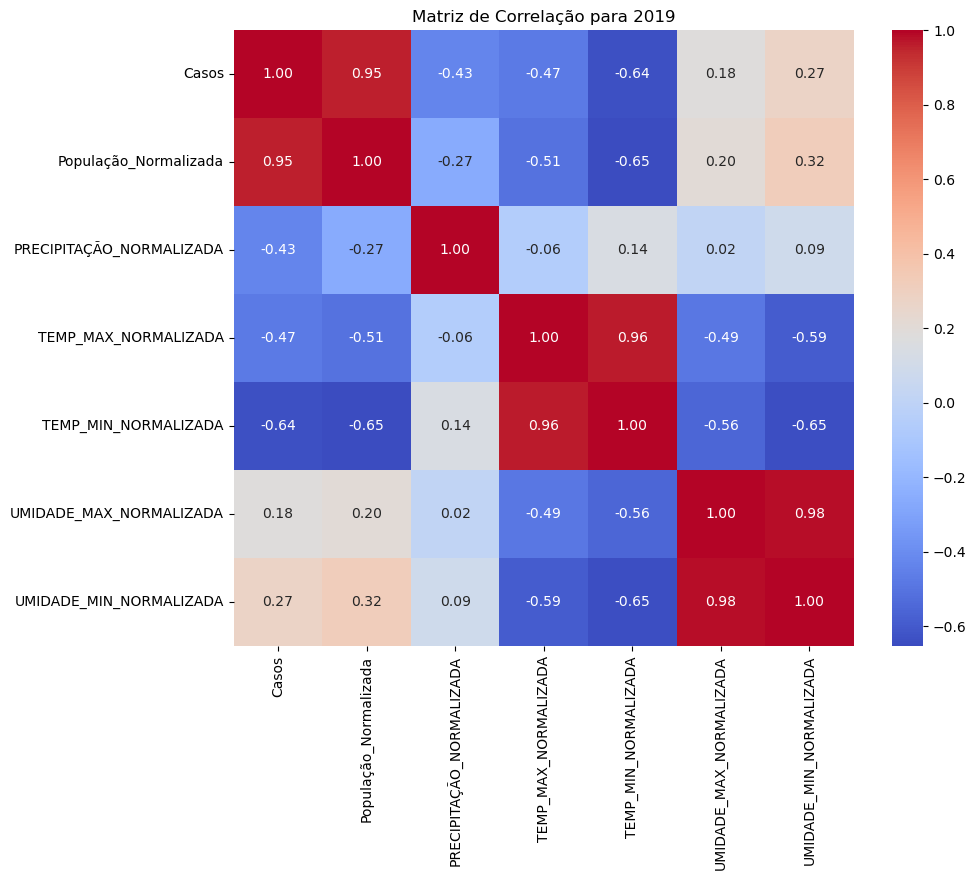

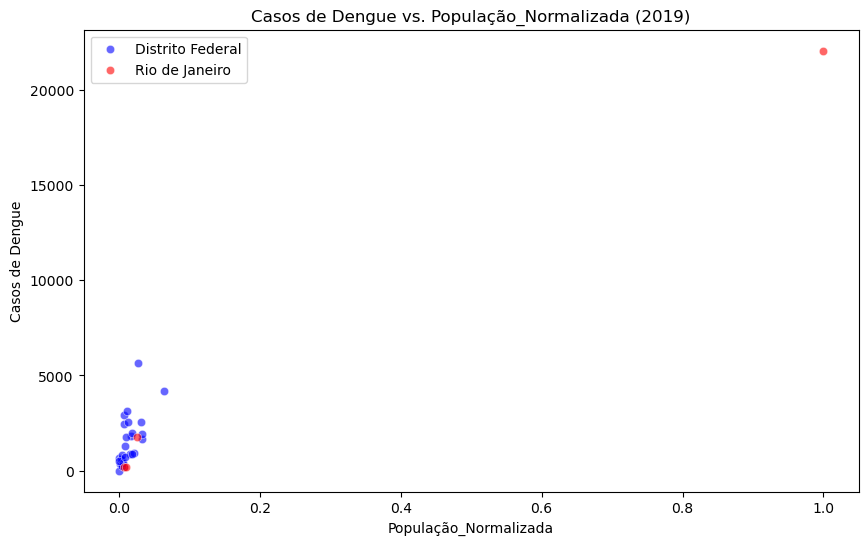

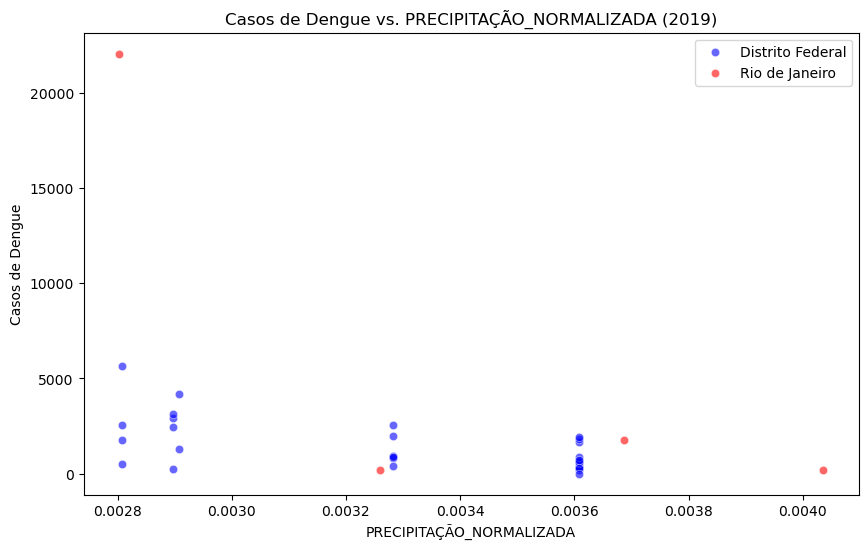

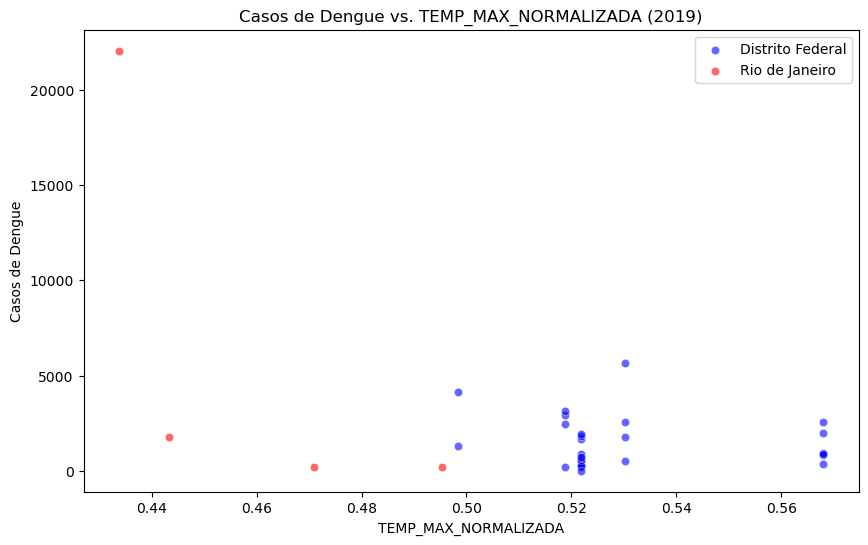

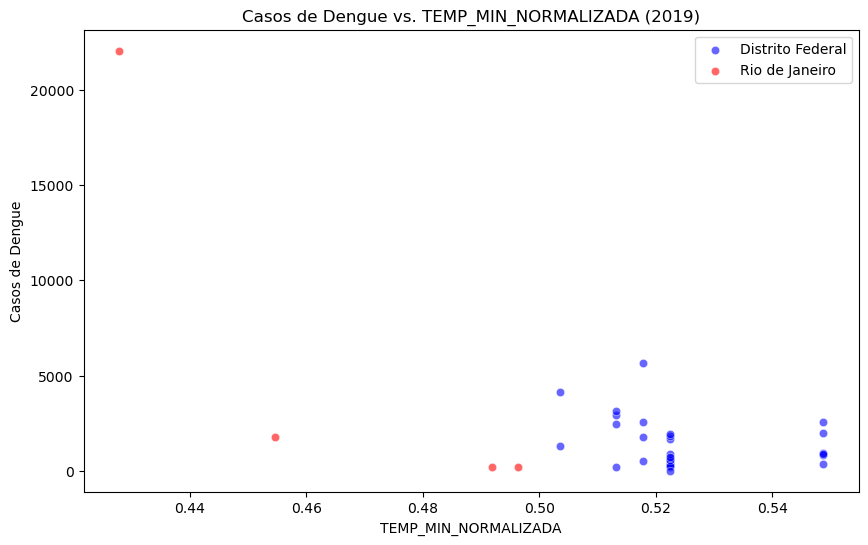

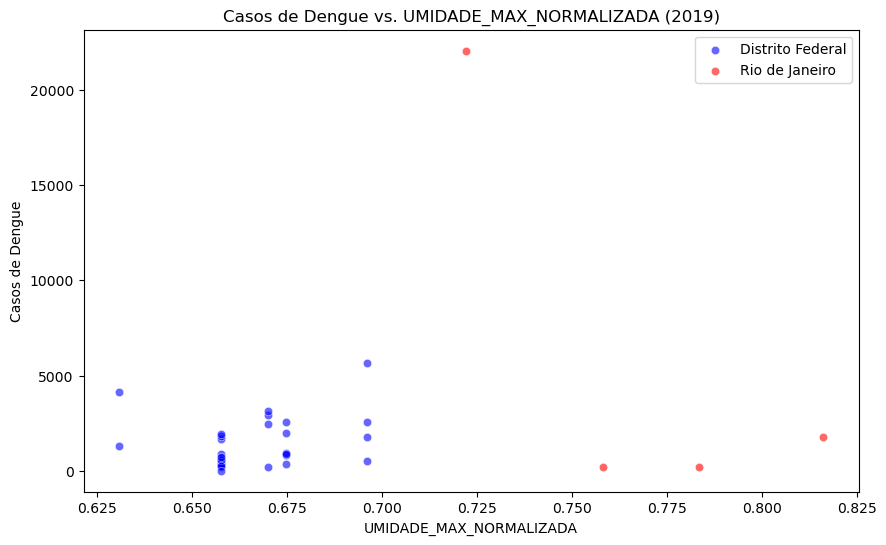

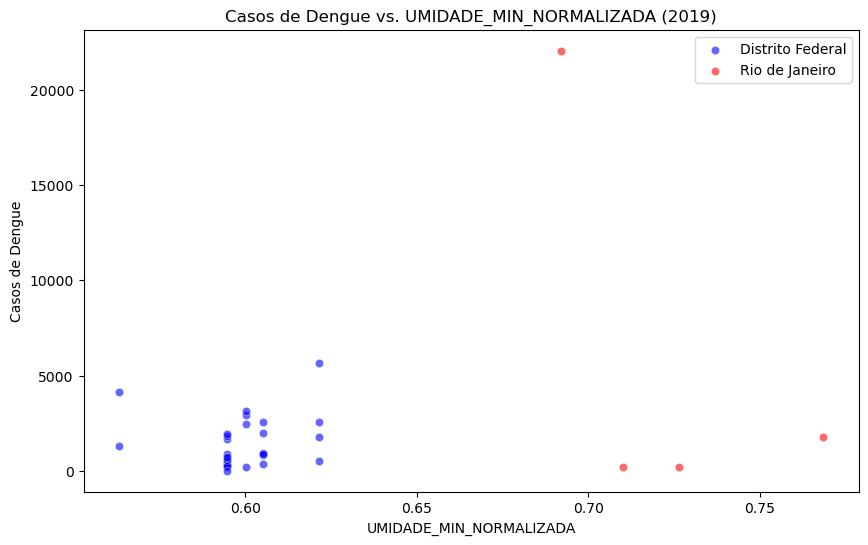

Análise descritiva para o ano 2020:
             Casos  População_Normalizada  PRECIPITAÇÃO_NORMALIZADA  \
count    35.000000              35.000000                 35.000000   
mean   1394.828571               0.041112                  0.004933   
std    1465.555295               0.167357                  0.001794   
min      14.000000               0.000000                  0.002532   
25%     254.000000               0.004680                  0.004317   
50%     568.000000               0.008638                  0.004774   
75%    2573.500000               0.018898                  0.005102   
max    5249.000000               1.000000                  0.011505   

       TEMP_MAX_NORMALIZADA  TEMP_MIN_NORMALIZADA  UMIDADE_MAX_NORMALIZADA  \
count             35.000000             35.000000                35.000000   
mean               0.464518              0.463147                 0.698713   
std                0.041313              0.041834                 0.029285   
min         

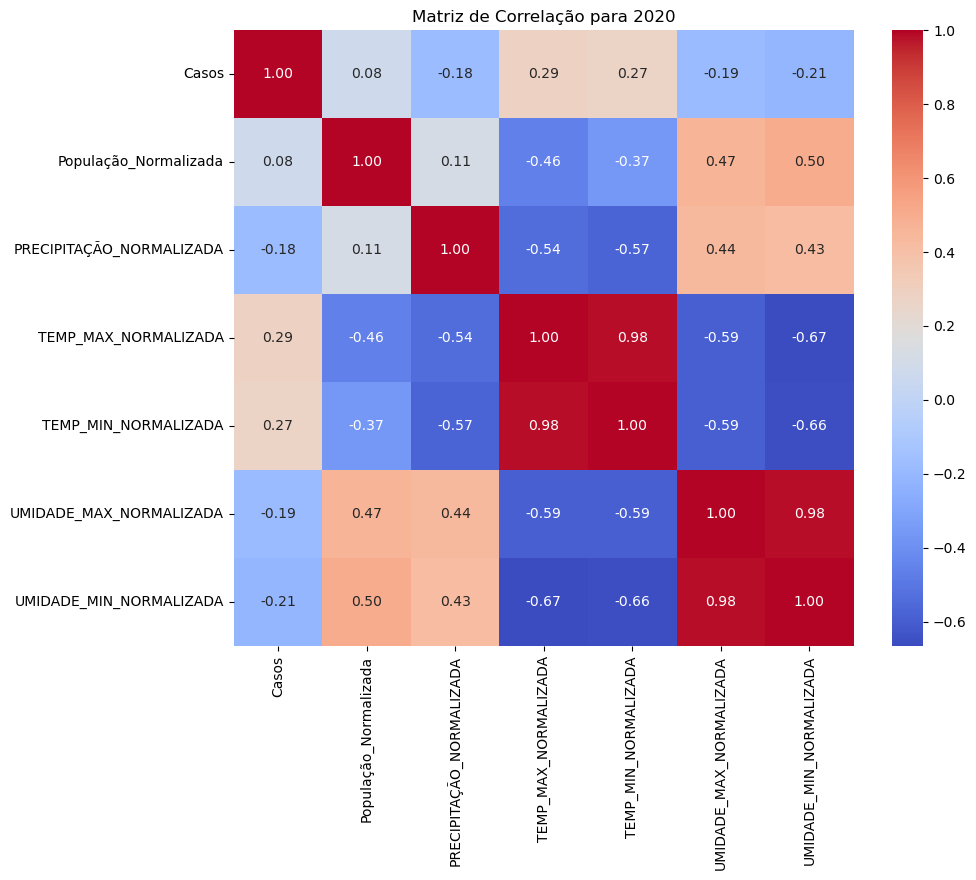

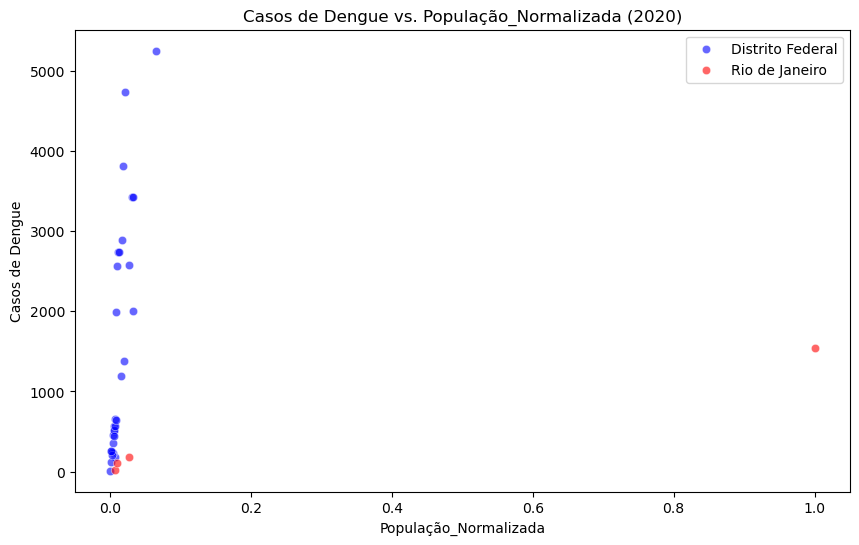

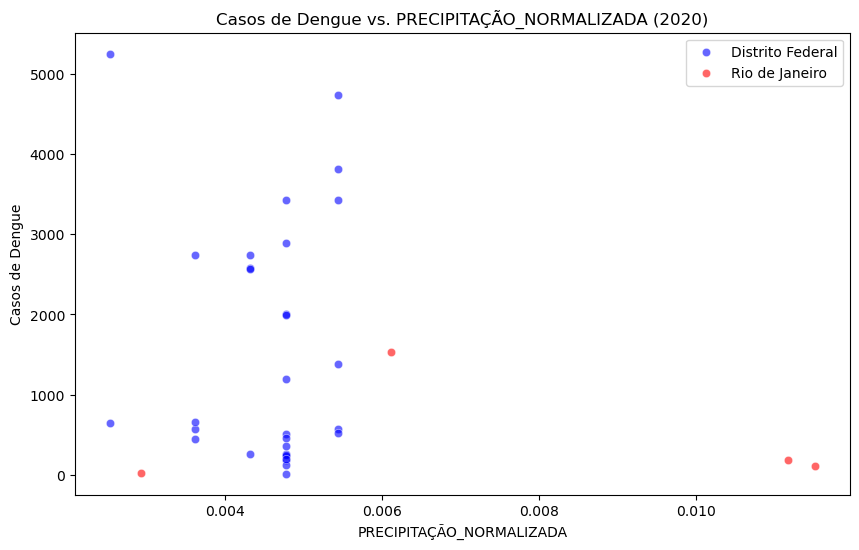

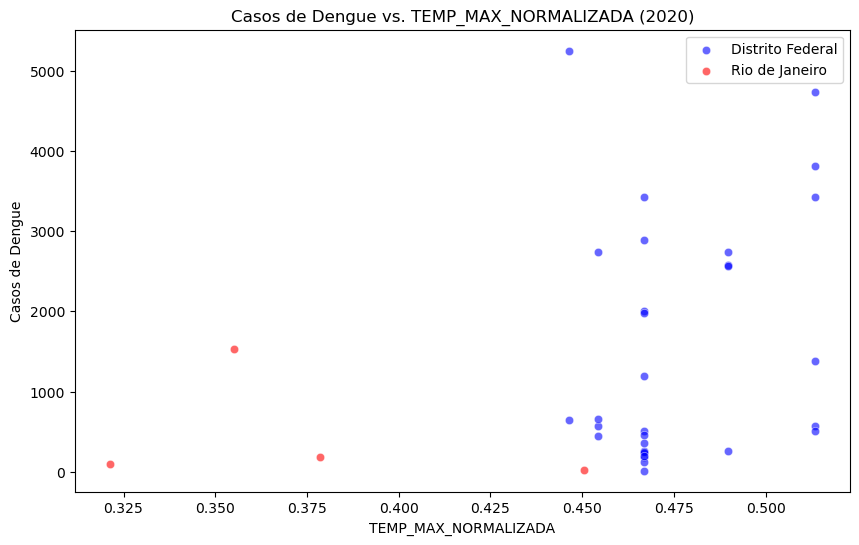

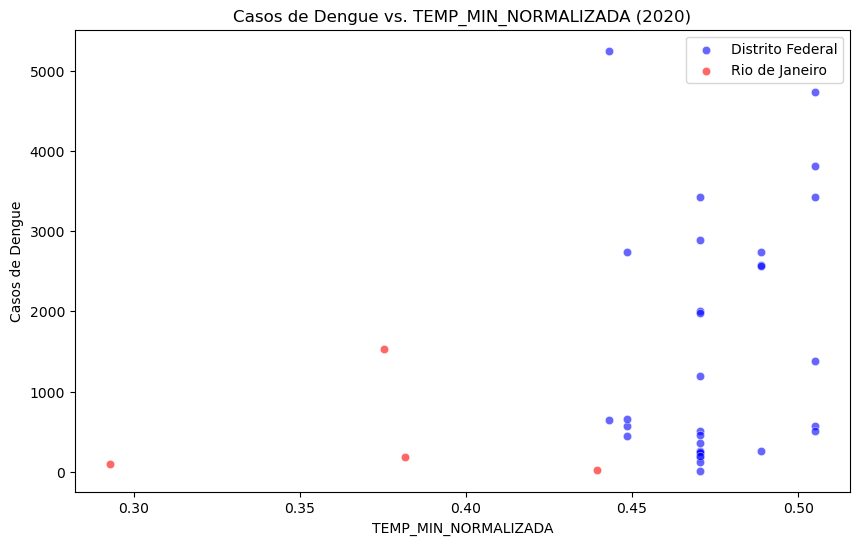

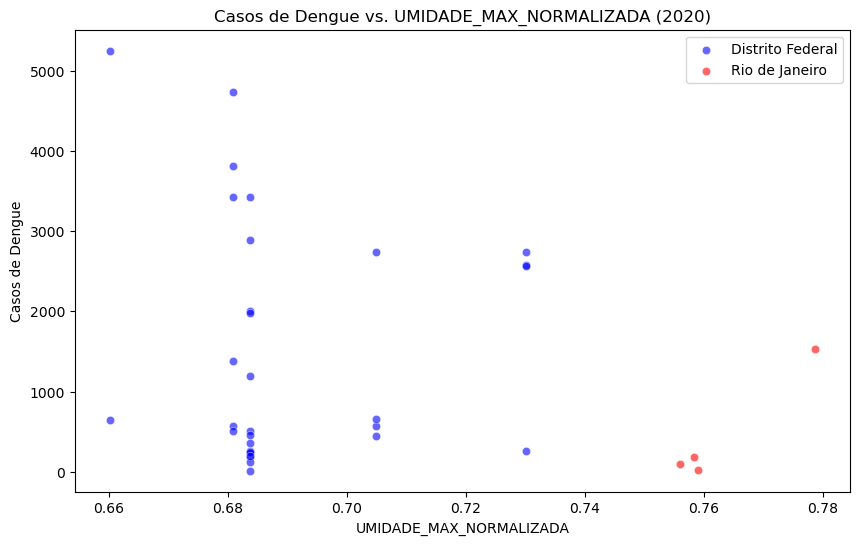

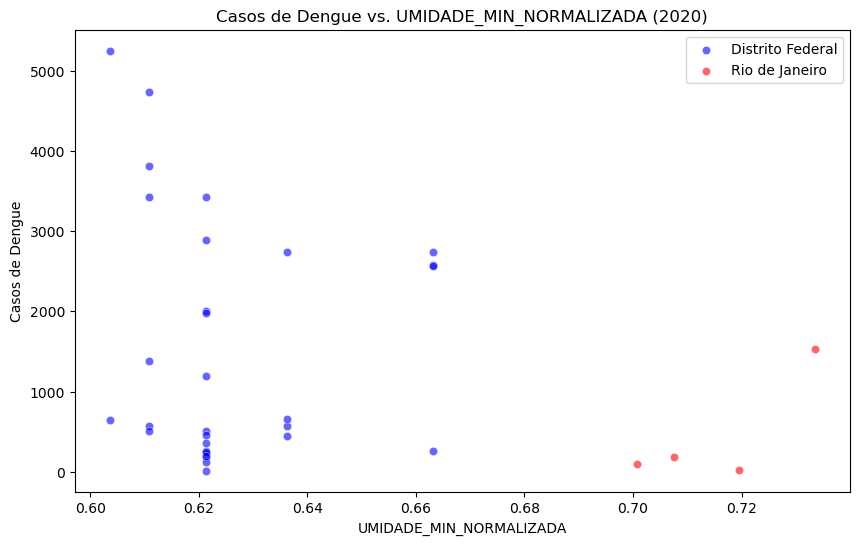

Análise descritiva para o ano 2021:
             Casos  População_Normalizada  PRECIPITAÇÃO_NORMALIZADA  \
count    35.000000              35.000000                 35.000000   
mean    507.885714               0.041112                  0.003693   
std     677.408460               0.167357                  0.000538   
min      12.000000               0.000000                  0.002423   
25%      93.000000               0.004680                  0.003678   
50%     223.000000               0.008638                  0.003678   
75%     655.000000               0.018898                  0.004001   
max    3395.000000               1.000000                  0.004366   

       TEMP_MAX_NORMALIZADA  TEMP_MIN_NORMALIZADA  UMIDADE_MAX_NORMALIZADA  \
count             35.000000             35.000000                35.000000   
mean               0.504633              0.504615                 0.680659   
std                0.026124              0.025227                 0.035205   
min         

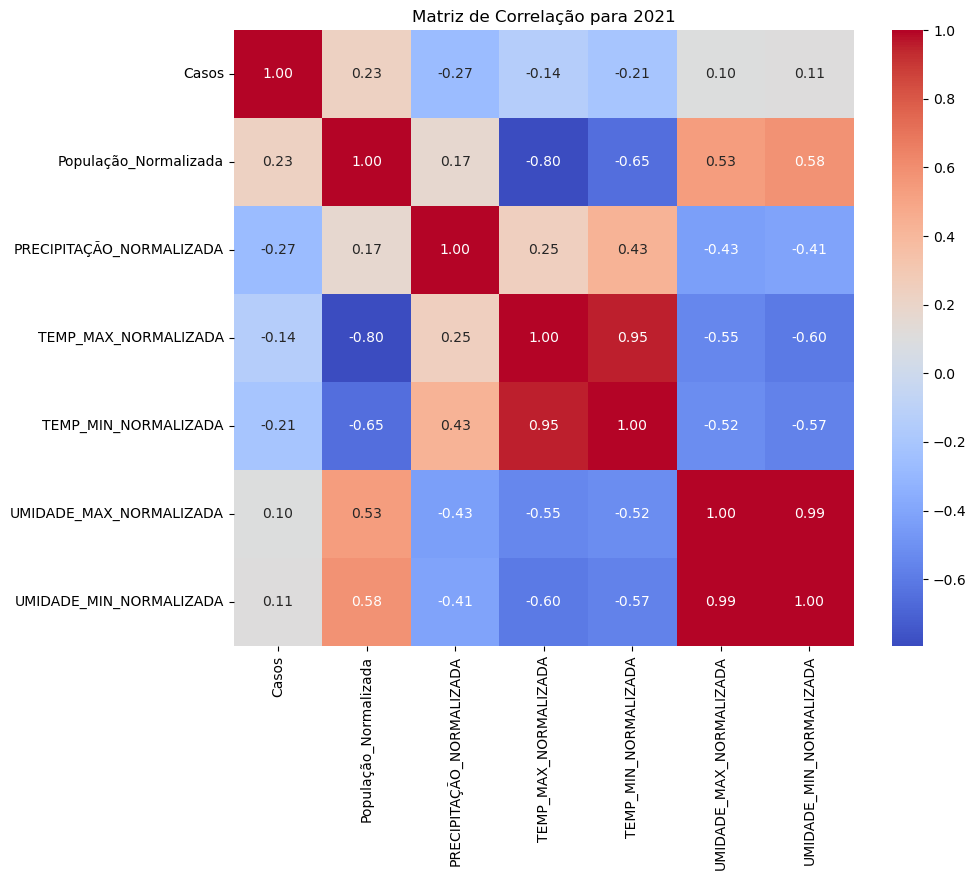

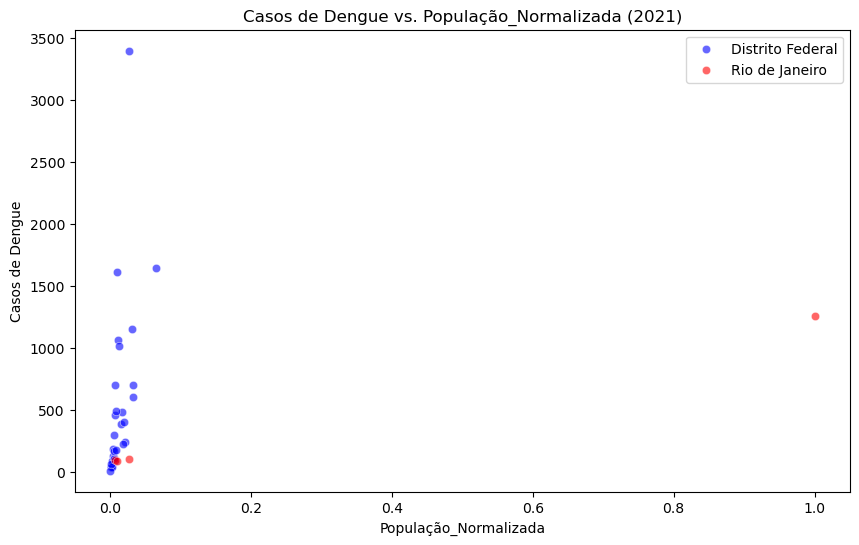

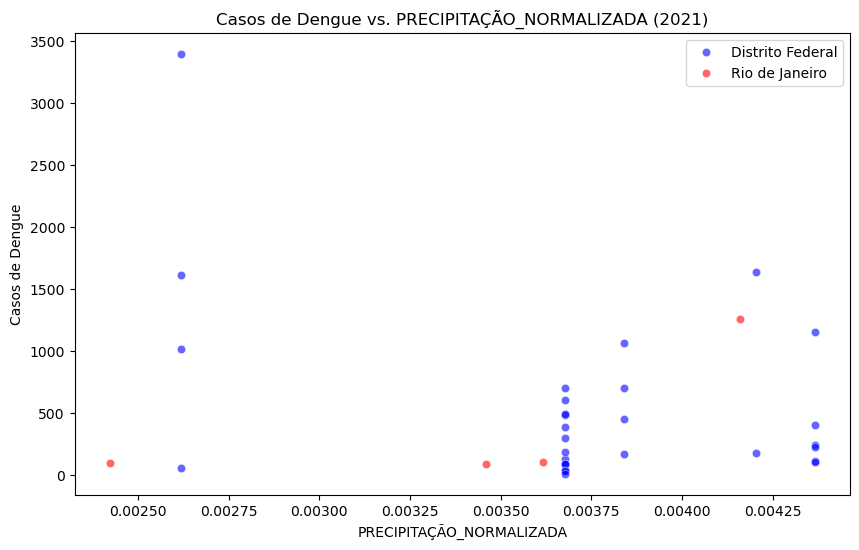

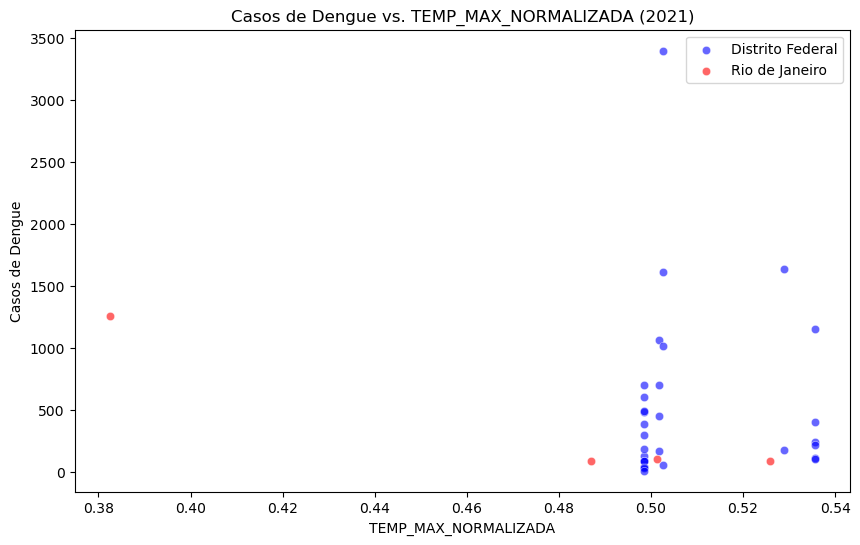

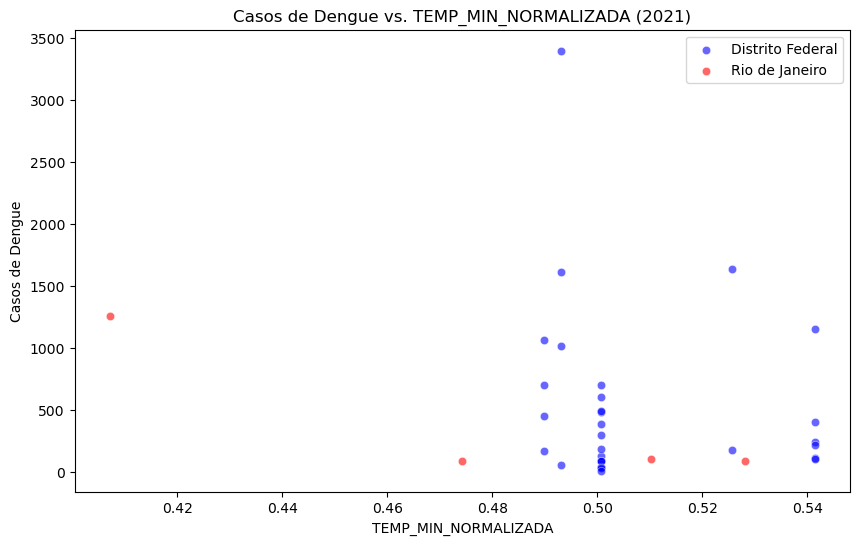

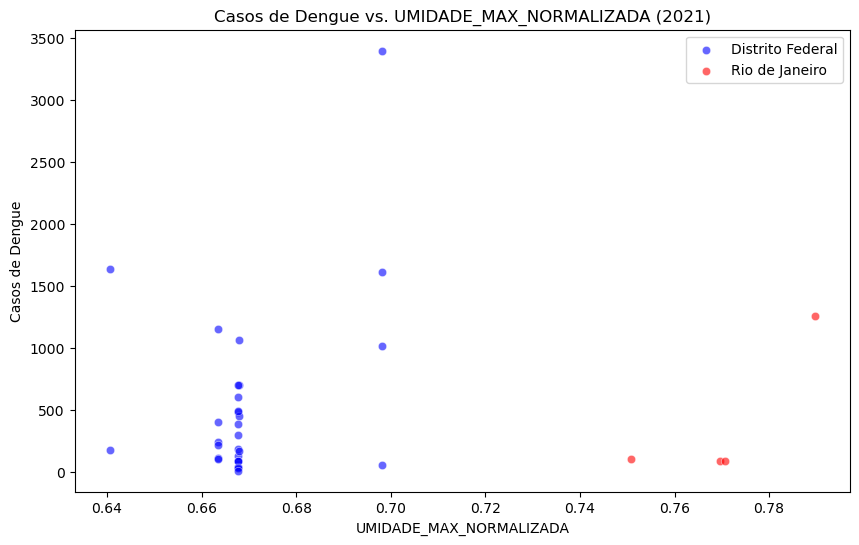

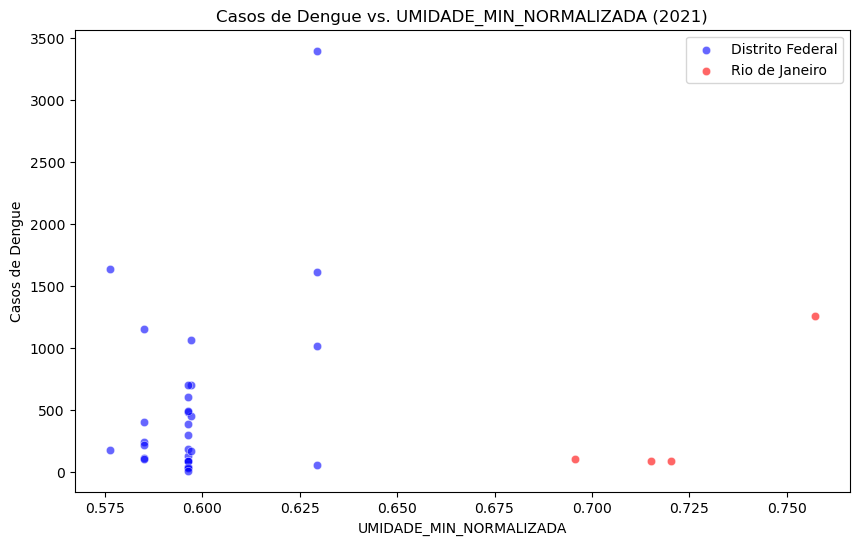

Análise descritiva para o ano 2022:
              Casos  População_Normalizada  PRECIPITAÇÃO_NORMALIZADA  \
count     35.000000              35.000000                 35.000000   
mean    1926.571429               0.041112                  0.003793   
std     2450.841804               0.167357                  0.001117   
min       11.000000               0.000000                  0.002129   
25%      503.500000               0.004680                  0.003352   
50%      848.000000               0.008638                  0.003352   
75%     2316.500000               0.018898                  0.003691   
max    11499.000000               1.000000                  0.006979   

       TEMP_MAX_NORMALIZADA  TEMP_MIN_NORMALIZADA  UMIDADE_MAX_NORMALIZADA  \
count             35.000000             35.000000                35.000000   
mean               0.572358              0.569876                 0.665045   
std                0.051817              0.049307                 0.040585   
min

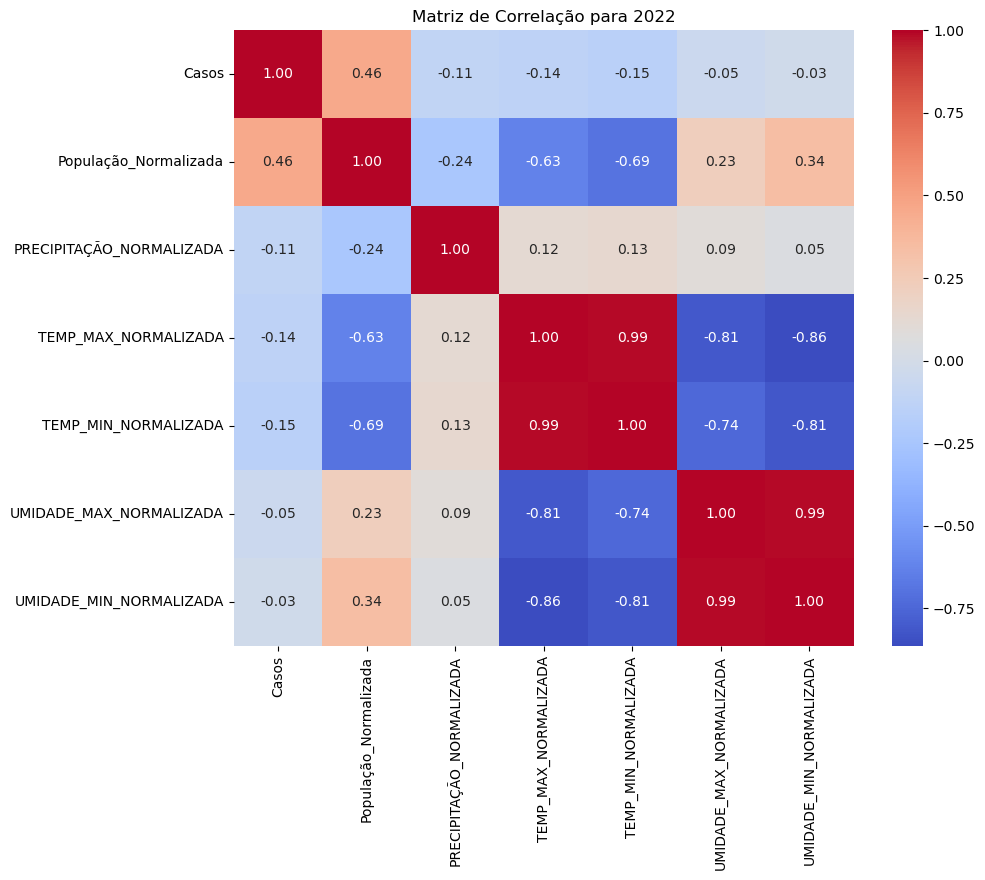

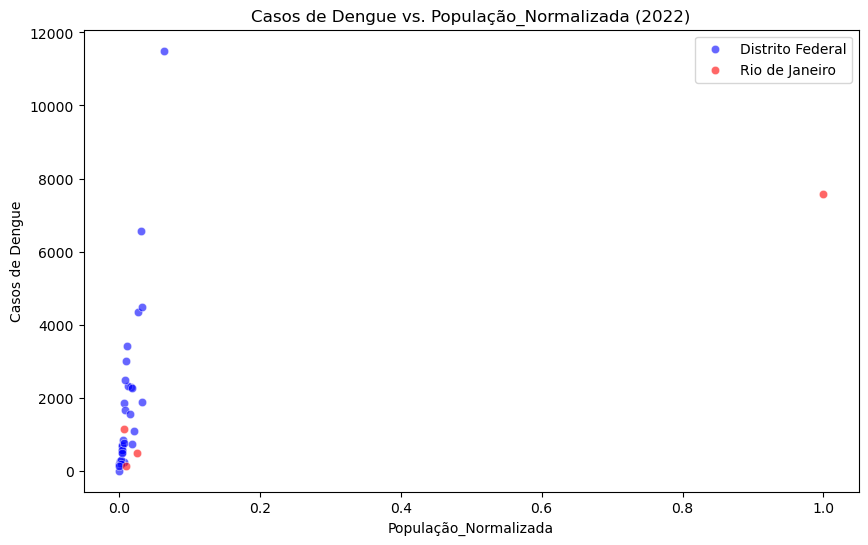

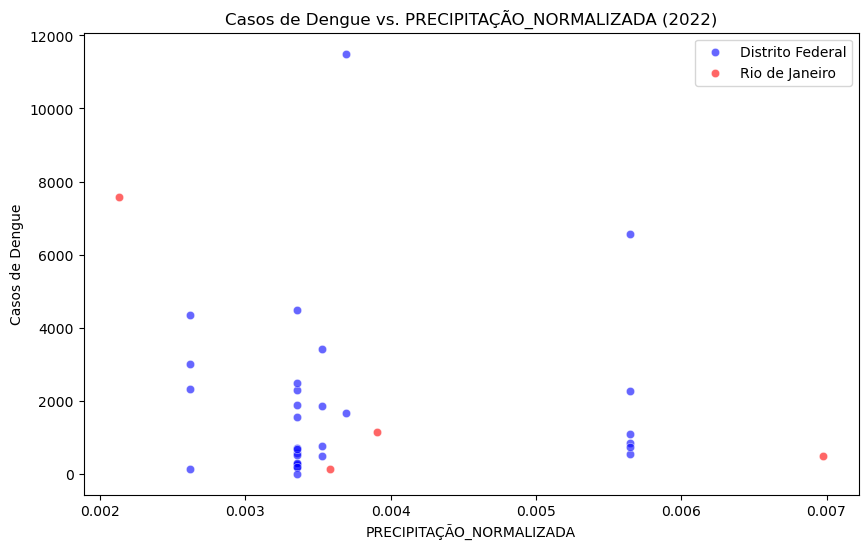

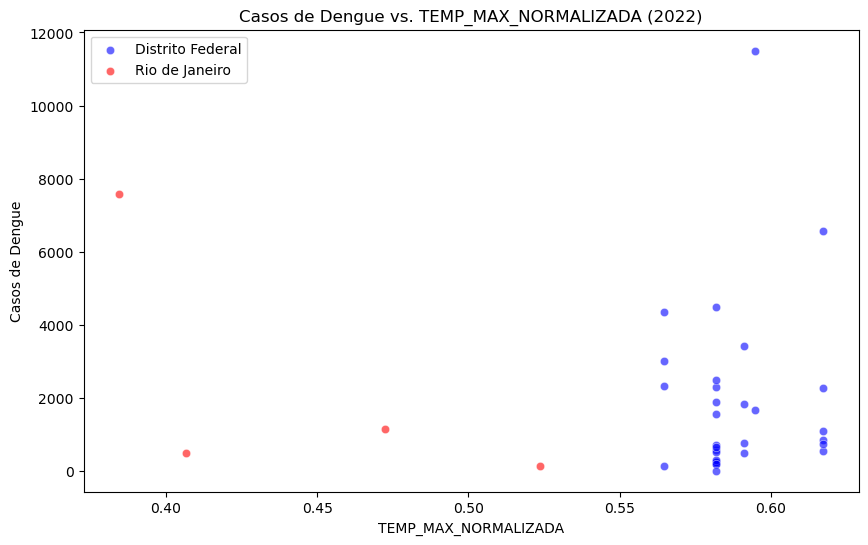

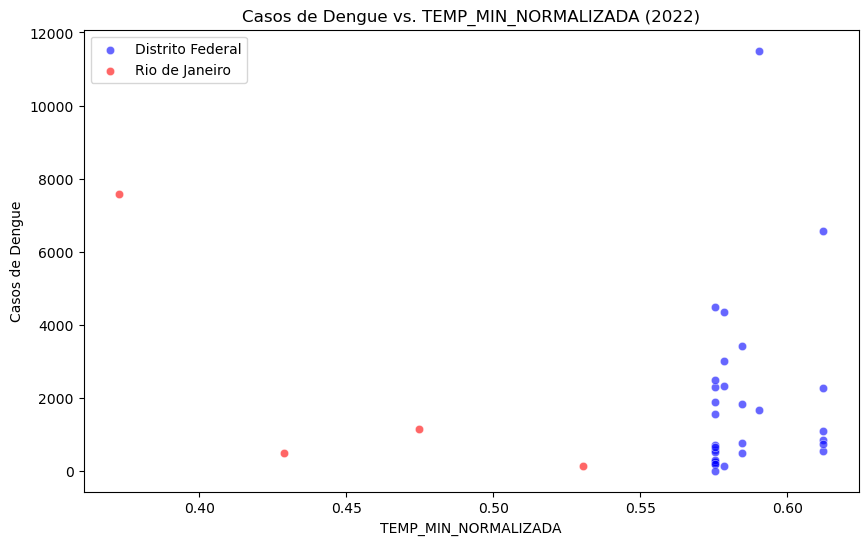

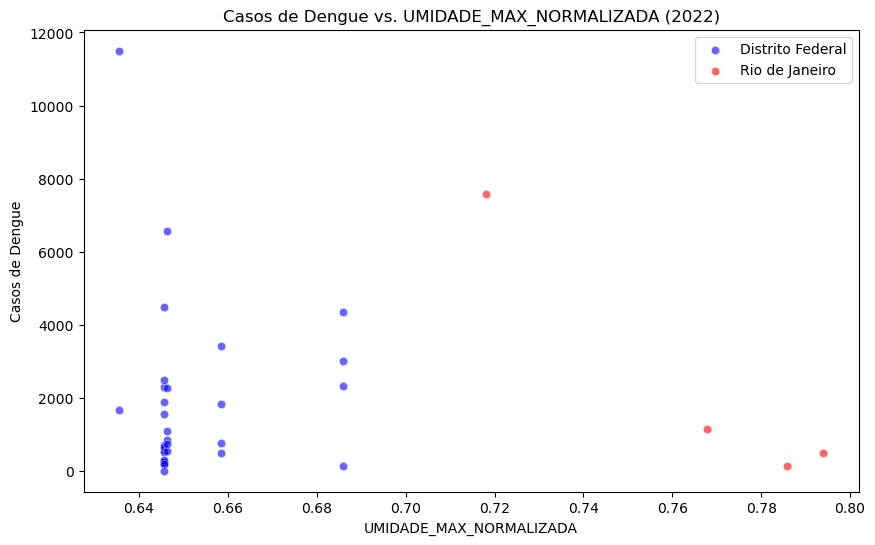

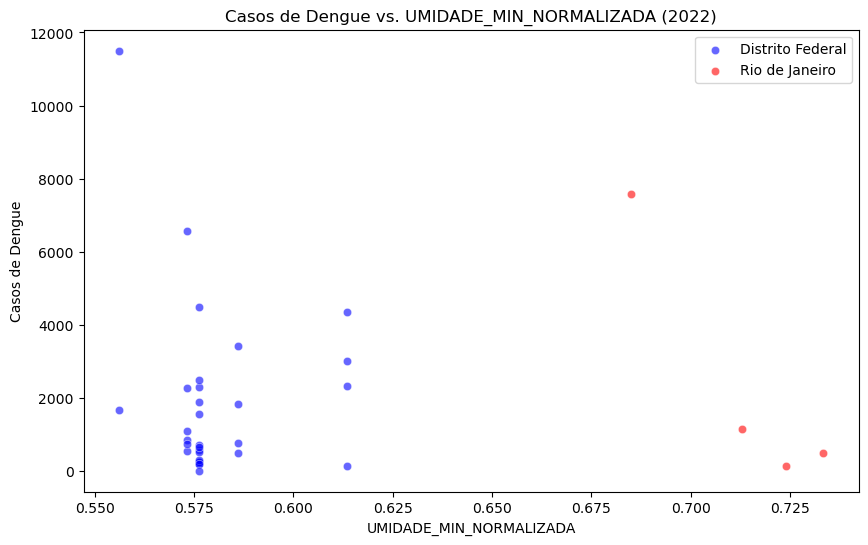

Análise descritiva para o ano 2023:
              Casos  População_Normalizada  PRECIPITAÇÃO_NORMALIZADA  \
count     35.000000              35.000000                 35.000000   
mean    2516.285714               0.041112                  0.003656   
std     7348.941295               0.167357                  0.001150   
min        8.000000               0.000000                  0.001858   
25%      211.000000               0.004680                  0.002481   
50%      743.000000               0.008638                  0.003851   
75%     2131.500000               0.018898                  0.004862   
max    43592.000000               1.000000                  0.004862   

       TEMP_MAX_NORMALIZADA  TEMP_MIN_NORMALIZADA  UMIDADE_MAX_NORMALIZADA  \
count             35.000000             35.000000                35.000000   
mean               0.486472              0.481392                 0.651829   
std                0.031729              0.034960                 0.044632   
min

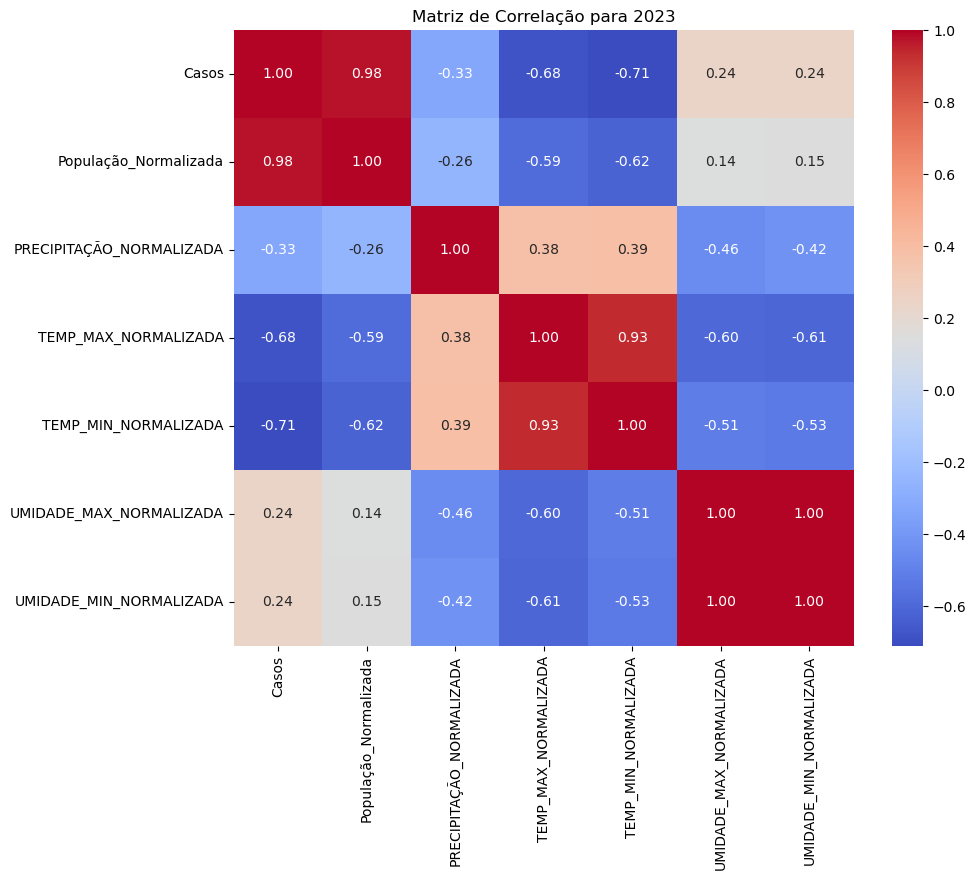

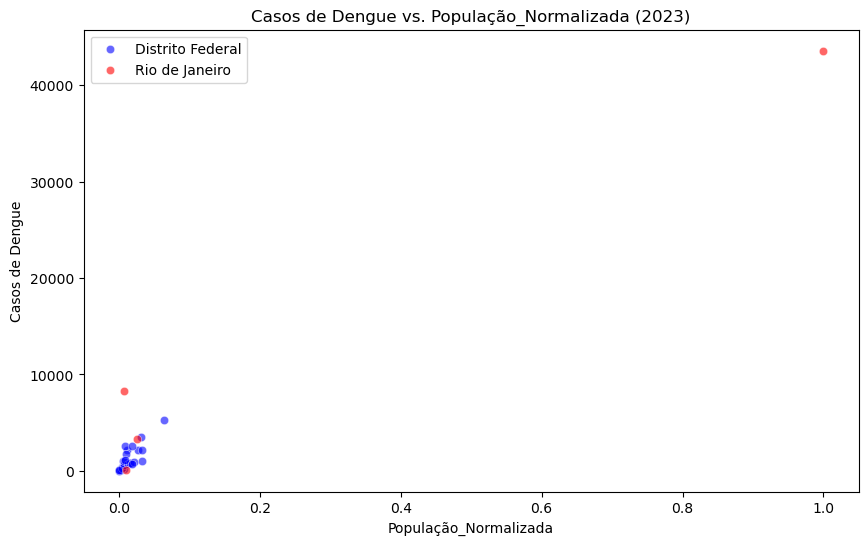

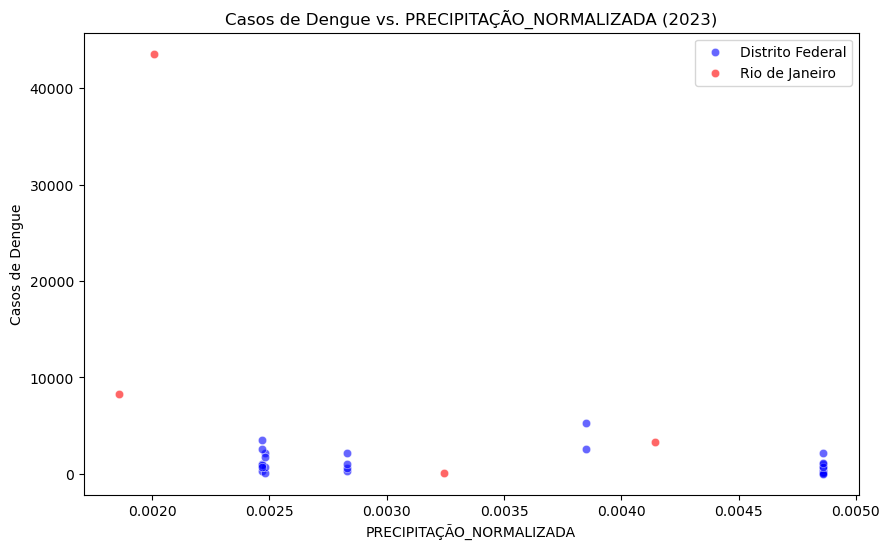

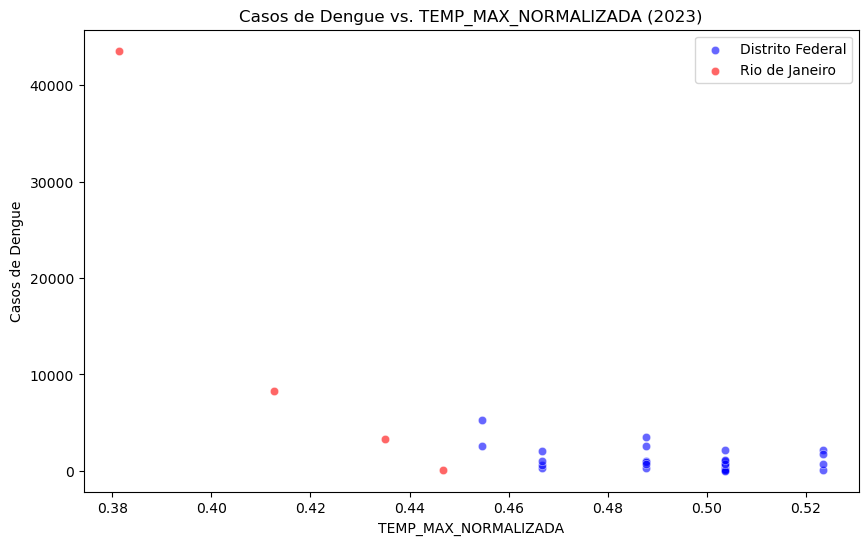

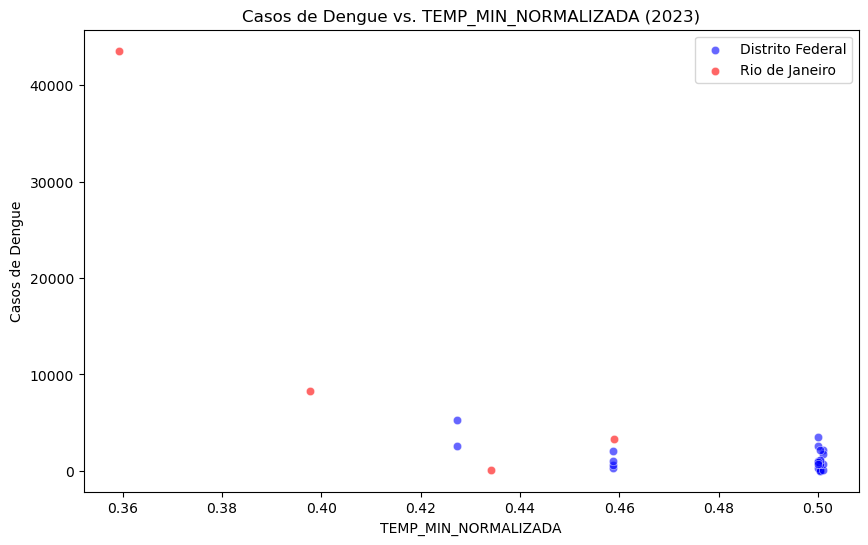

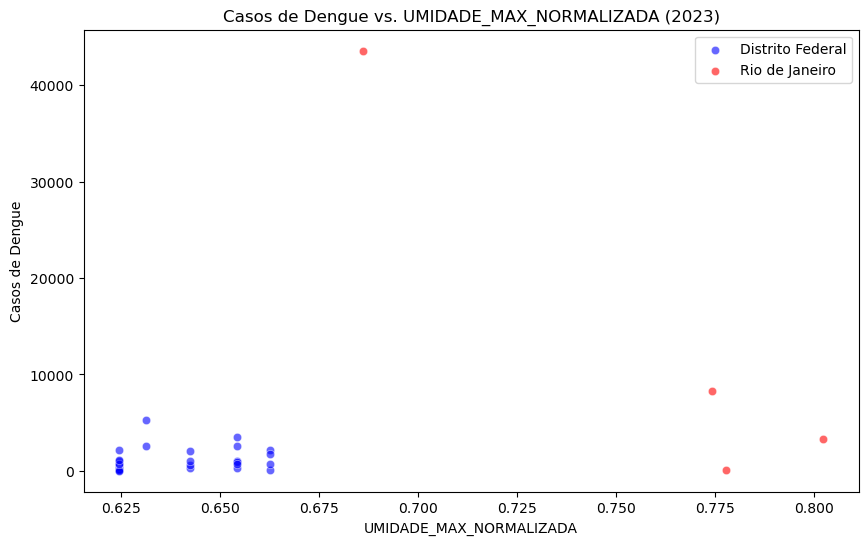

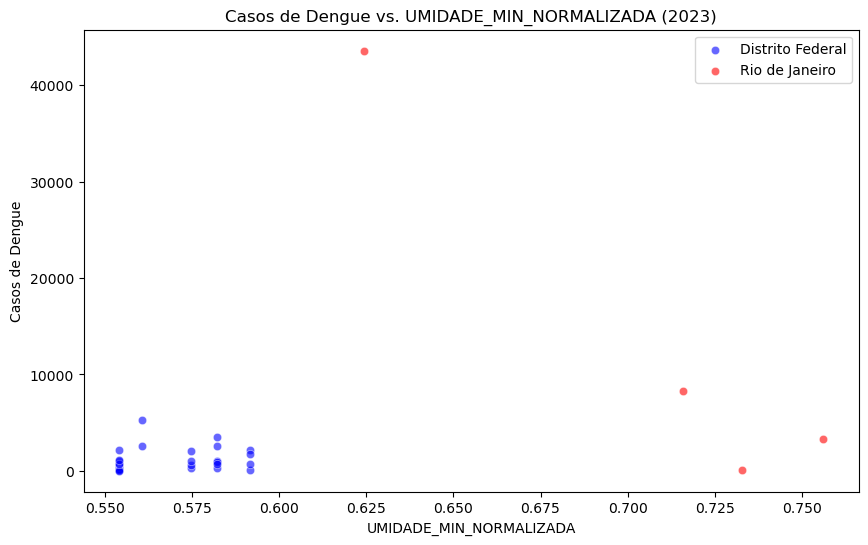

In [17]:
for ano in anos:
    processar_ano(ano)

**Gráfico de Casos de Dengue vs. Precipitação para todos os anos**

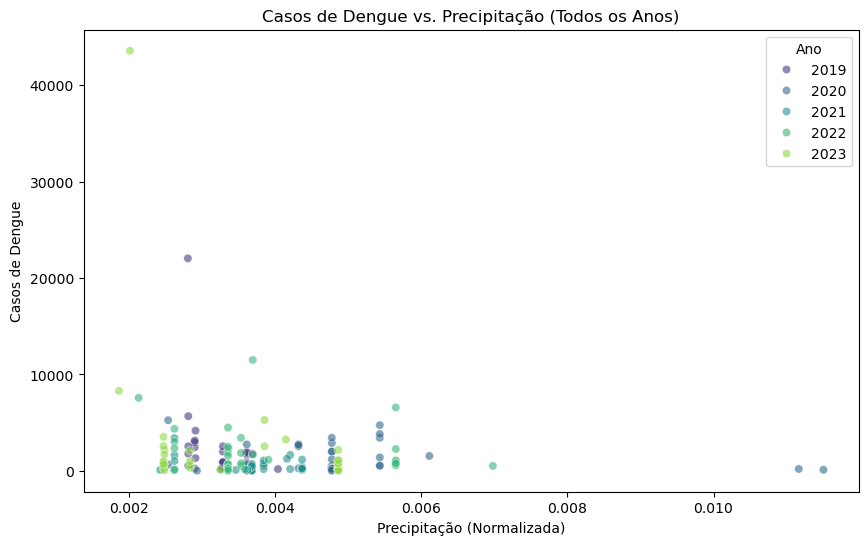

In [18]:
df_consolidado = pd.concat(tabelas_dengue)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_consolidado, x='PRECIPITAÇÃO_NORMALIZADA', y='Casos', hue='Ano', palette='viridis', alpha=0.6)
plt.title('Casos de Dengue vs. Precipitação (Todos os Anos)')
plt.xlabel('Precipitação (Normalizada)')
plt.ylabel('Casos de Dengue')
plt.legend(title='Ano')
plt.show()

**Sem Normalização das Features**

In [19]:
def gerar_tabelas_por_ano_sem_normlaizacao(arquivo_saude, arquivo_populacao, anos):
   
    saude_df = pd.read_csv(arquivo_saude)
    pop_df = pd.read_csv(arquivo_populacao)

    merged_df = pd.merge(saude_df, pop_df[['COD_CIDADE', 'População Total']], on='COD_CIDADE')

    for ano in anos:
        ano_df = merged_df[['COD_CIDADE', 'COD_REG', 'Região de Saúde', ano, 'População Total']]
        
        ano_df = ano_df.copy()
        ano_df.rename(columns={ano: 'Casos'}, inplace=True)
        
        ano_df.to_csv(f'tabela_saude_sem_normalizacao_{ano}.csv', index=False)

    print("Arquivos CSV gerados com sucesso!")

In [20]:
gerar_tabelas_por_ano_sem_normlaizacao('tabela_saude_atualizada.csv', 'habitantes_normalizados.csv', anos)

Arquivos CSV gerados com sucesso!


In [21]:
def gerar_tabelas_sem_normalizacao(anos):
   
    for ano in anos:
        tabela_saude_path = f'tabela_saude_sem_normalizacao_{ano}.csv'
        normalizacao_path = f'medias_{ano}.csv'
        
        tabela_saude_df = pd.read_csv(tabela_saude_path)
        sem_normalizacao_df = pd.read_csv(normalizacao_path)
        
        sem_normalizacao_df = sem_normalizacao_df[[
            'COD_REG', 
            'Média de Precipitação', 
            'Média de Temperatura Máxima', 
            'Média de Temperatura Mínima', 
            'Média de Umidade Relativa Máxima', 
            'Média de Umidade Relativa Mínima'
        ]]
        
        tabela_completa_df = pd.merge(tabela_saude_df, sem_normalizacao_df, on='COD_REG', how='left')
        
        tabela_completa_path = f'tabela_saude_sem_normalizacao_{ano}.csv'
        tabela_completa_df.to_csv(tabela_completa_path, index=False)

        print(f"Arquivo gerado: {tabela_completa_path}")

In [22]:
gerar_tabelas_sem_normalizacao(anos)

Arquivo gerado: tabela_saude_sem_normalizacao_2019.csv
Arquivo gerado: tabela_saude_sem_normalizacao_2020.csv
Arquivo gerado: tabela_saude_sem_normalizacao_2021.csv
Arquivo gerado: tabela_saude_sem_normalizacao_2022.csv
Arquivo gerado: tabela_saude_sem_normalizacao_2023.csv


In [23]:
tabelas_dengue_sem_normalizacao = []

def processar_ano_sem_normalizacao(ano):
    file_path_resultados = f'tabela_saude_sem_normalizacao_{ano}.csv'  # Ajusta para múltiplos anos
    df = pd.read_csv(file_path_resultados)

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    print(f"Análise descritiva para o ano {ano}:")
    print(df_relevante.describe())

    numerical_df = df_relevante.select_dtypes(include=[np.number])

    correlation_matrix = numerical_df.corr()
    print(f"\nMatriz de correlação para {ano}:")
    print(correlation_matrix)

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
    plt.title(f'Matriz de Correlação para {ano}')
    plt.show()

    # Separa os dados do Rio de Janeiro e do restante do DF
    df_rio = df_relevante.iloc[-4:]  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4]    # Todos os registros menos os últimos 4

    features = [
        'População_Total',
        'Media_de_Precipitação', 
        'Media_de_Temperatura_Maxima',
        'Media_de_Temperatura_Minima', 
        'Media_de_Umidade_Relativa_Maxima',
        'Media_de_Umidade_Relativa_Minima'
    ]

    for feature in features:
        plt.figure(figsize=(10, 6))
        
        sns.scatterplot(data=df_df, x=feature, y='Casos', label='Distrito Federal', color='blue', alpha=0.6)
        sns.scatterplot(data=df_rio, x=feature, y='Casos', label='Rio de Janeiro', color='red', alpha=0.6)
        
        plt.title(f'Casos de Dengue vs. {feature} ({ano})')
        plt.xlabel(feature)
        plt.ylabel('Casos de Dengue')
        plt.legend()
        plt.show()

    df_relevante['Ano'] = ano
    tabelas_dengue_sem_normalizacao.append(df_relevante)

Análise descritiva para o ano 2019:
              Casos  População_Total  Media_de_Precipitação  \
count     35.000000     3.500000e+01              35.000000   
mean    1919.057143     2.595315e+07               0.154991   
std     3724.560590     1.038762e+08               0.026639   
min        6.000000     4.356000e+05               0.101036   
25%      374.500000     3.340250e+06               0.142459   
50%      862.000000     5.797400e+06               0.156610   
75%     1973.000000     1.216530e+07               0.156610   
max    22046.000000     6.211223e+08               0.277238   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    35.000000                    35.000000   
mean                     23.024466                    21.531314   
std                       0.538767                     0.656585   
min                      22.669062                    21.049325   
25%                      22.708829                    21.2472

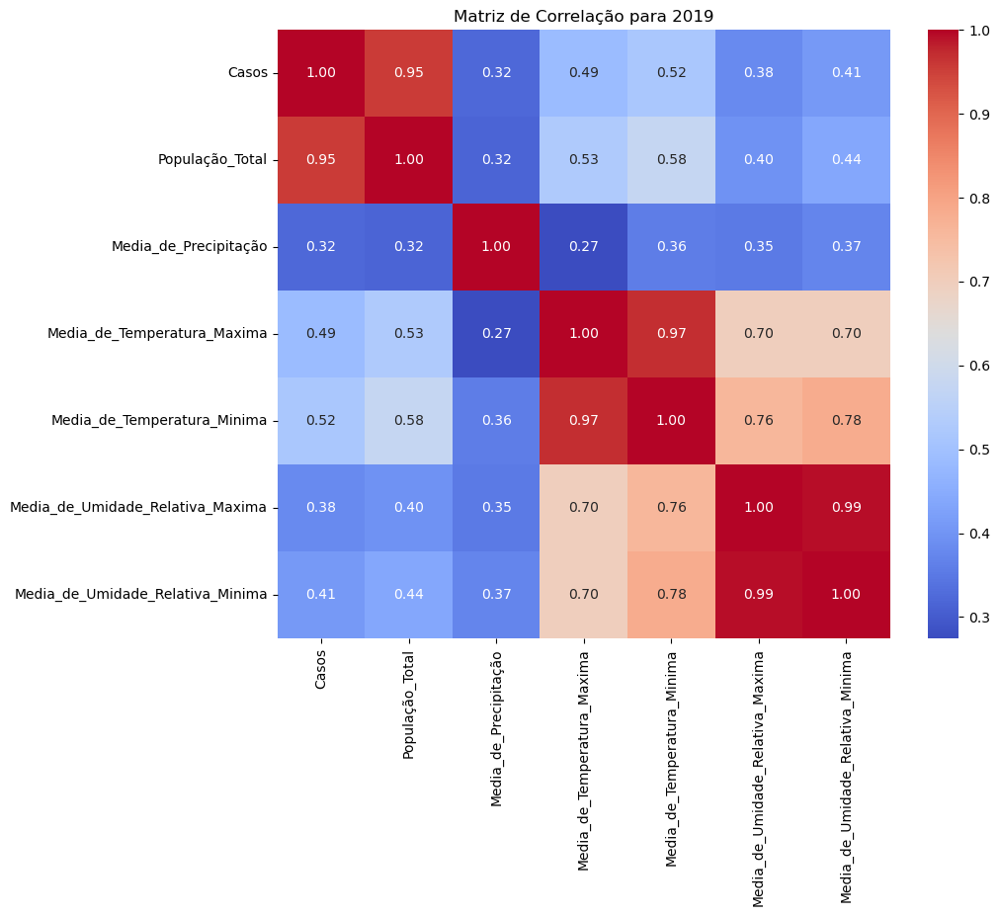

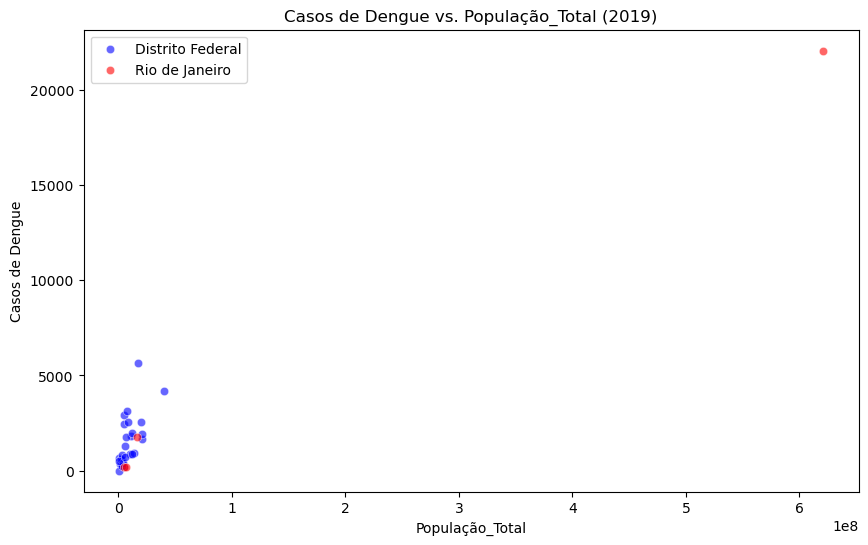

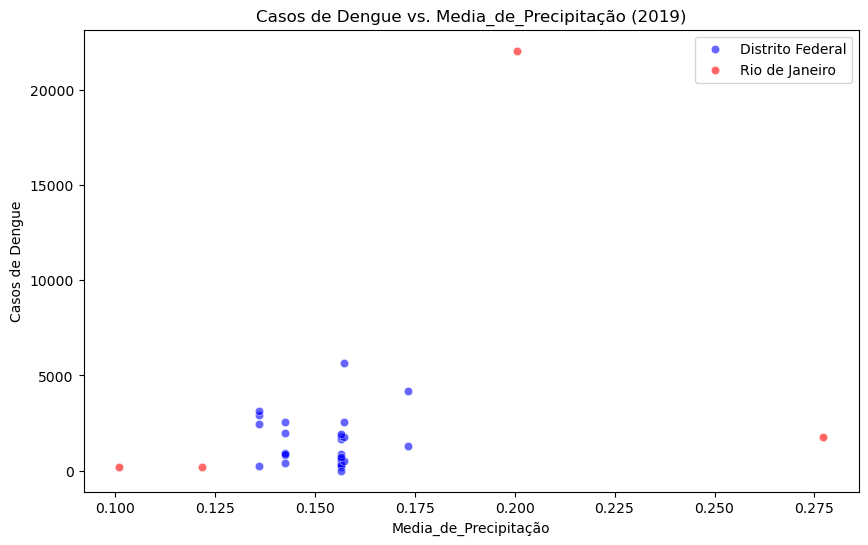

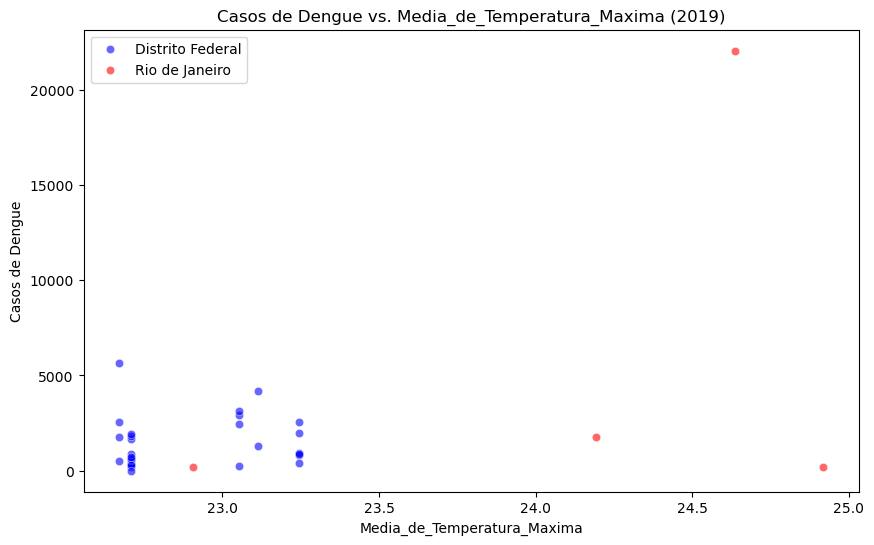

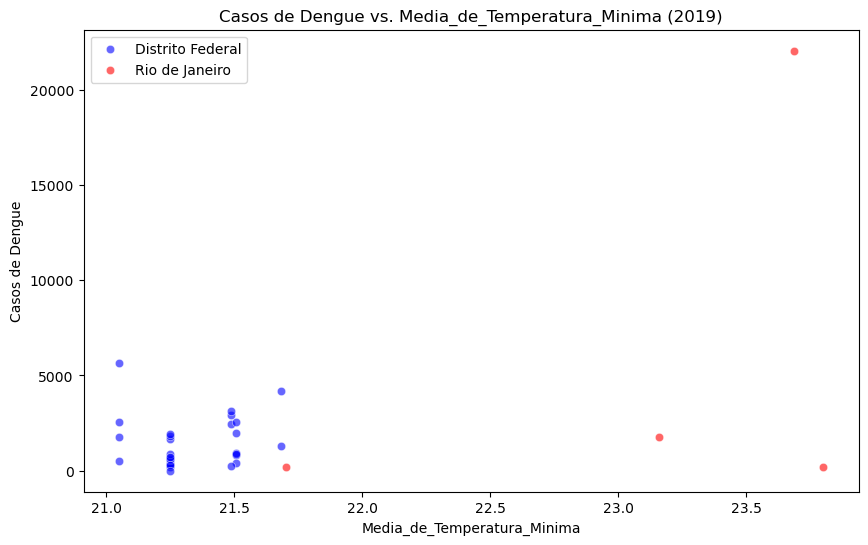

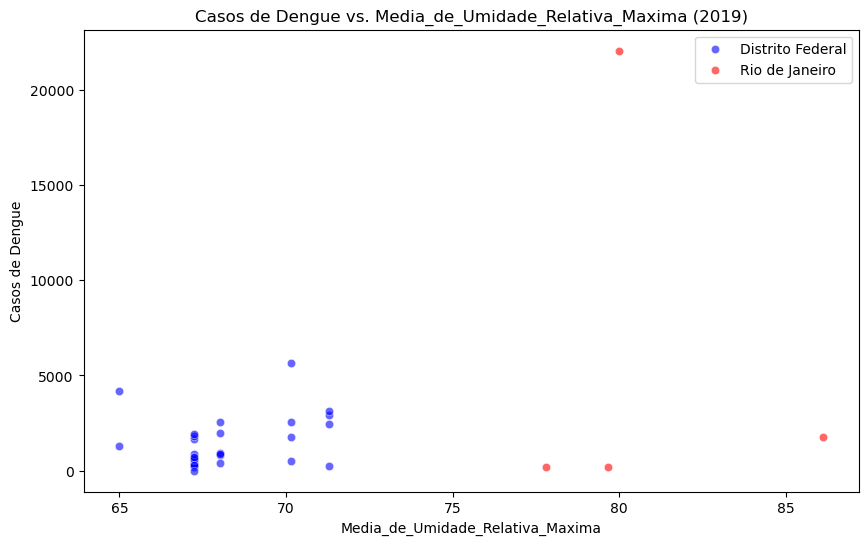

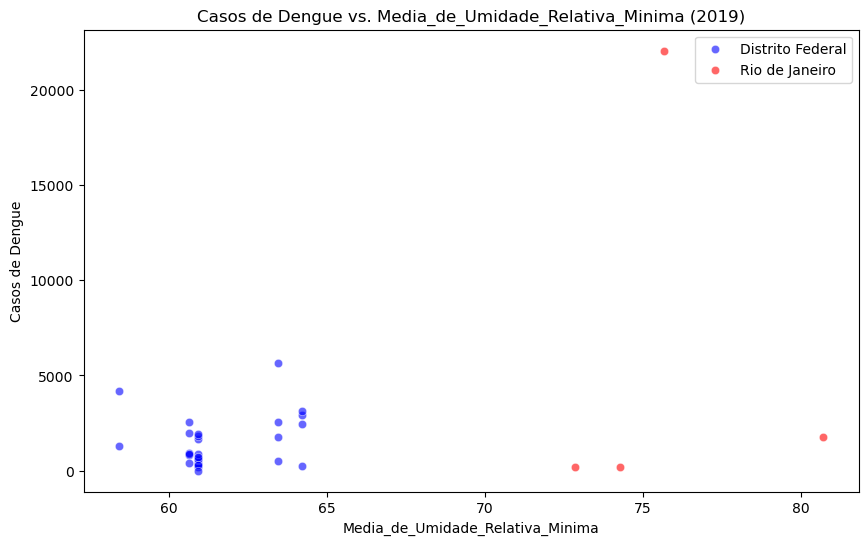

Análise descritiva para o ano 2020:
             Casos  População_Total  Media_de_Precipitação  \
count    35.000000     3.500000e+01              35.000000   
mean   1394.828571     2.595315e+07               0.215054   
std    1465.555295     1.038762e+08               0.083670   
min      14.000000     4.356000e+05               0.145406   
25%     254.000000     3.340250e+06               0.179485   
50%     568.000000     5.797400e+06               0.183039   
75%    2573.500000     1.216530e+07               0.223736   
max    5249.000000     6.211223e+08               0.646575   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    35.000000                    35.000000   
mean                     22.537856                    21.125195   
std                       0.837920                     0.937264   
min                      22.030565                    20.471190   
25%                      22.054041                    20.682832   
50%

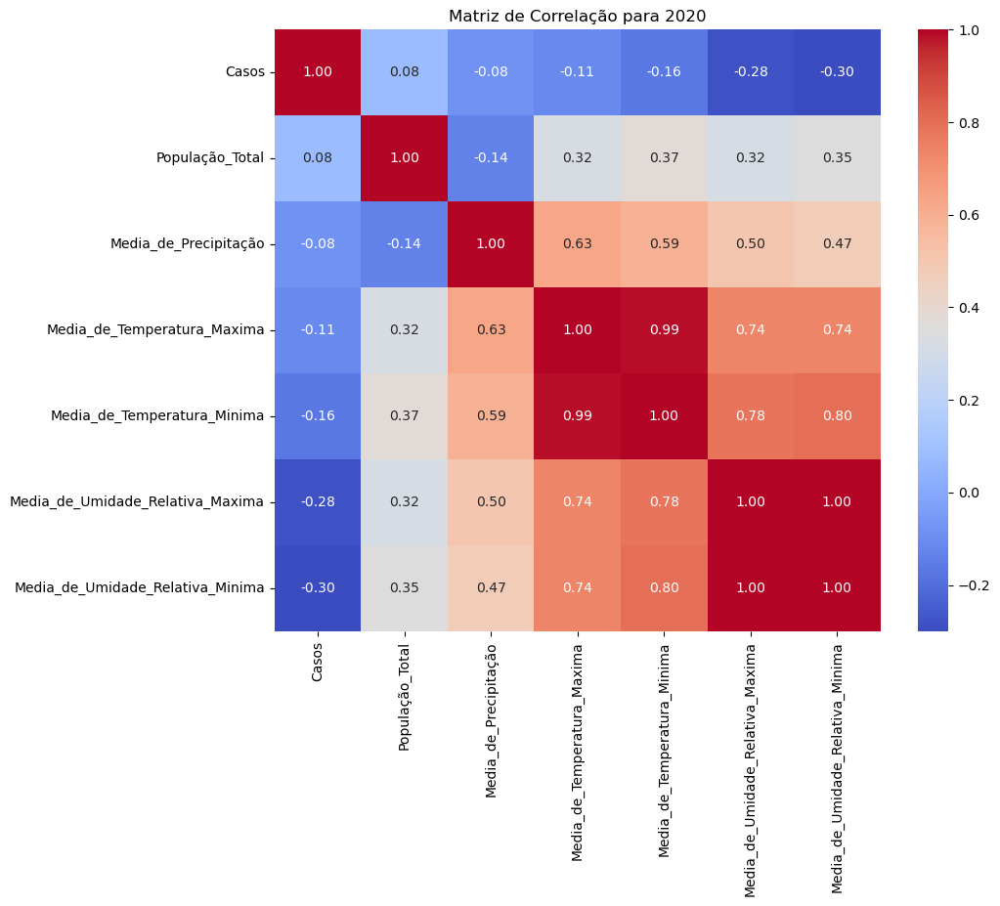

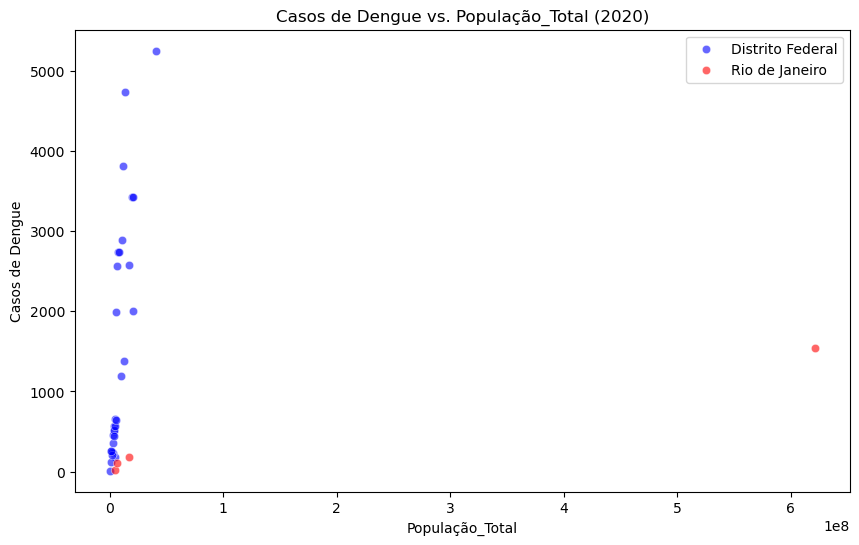

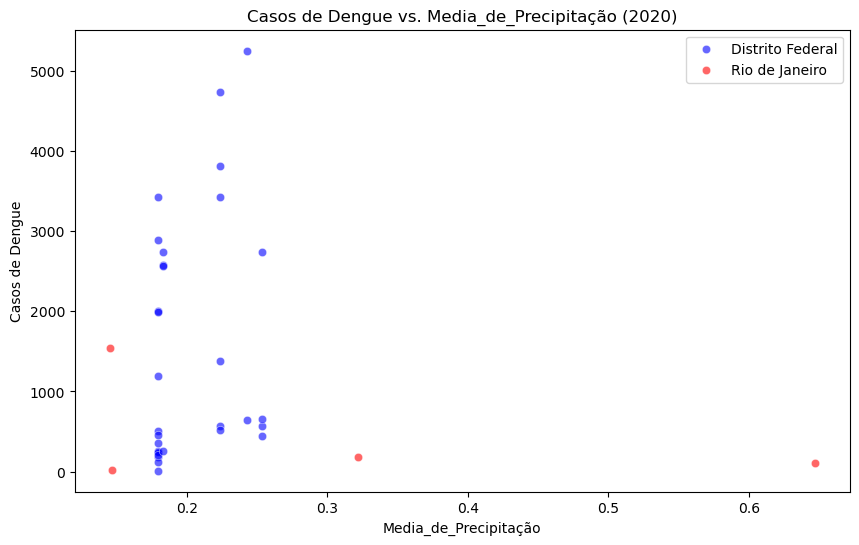

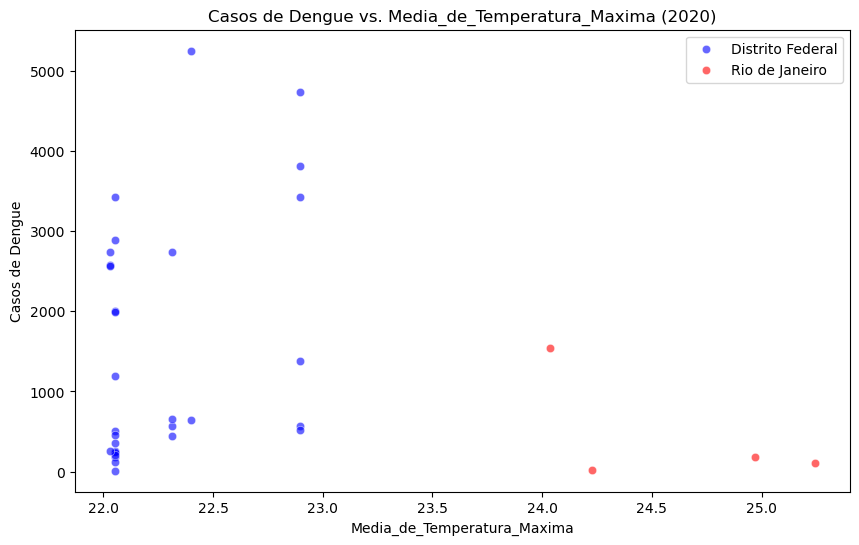

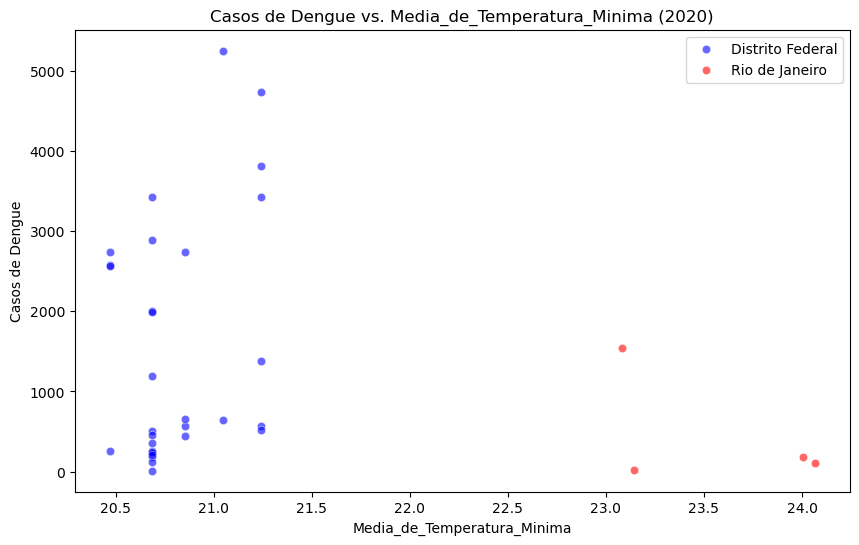

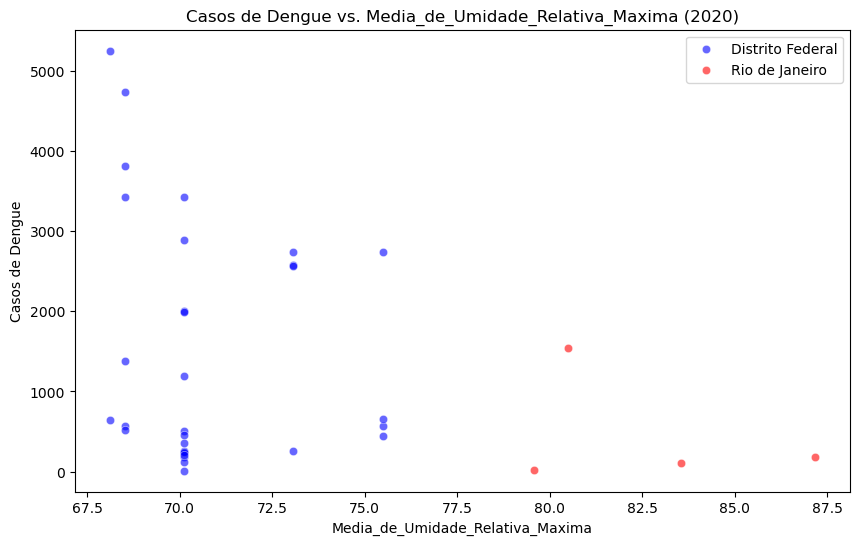

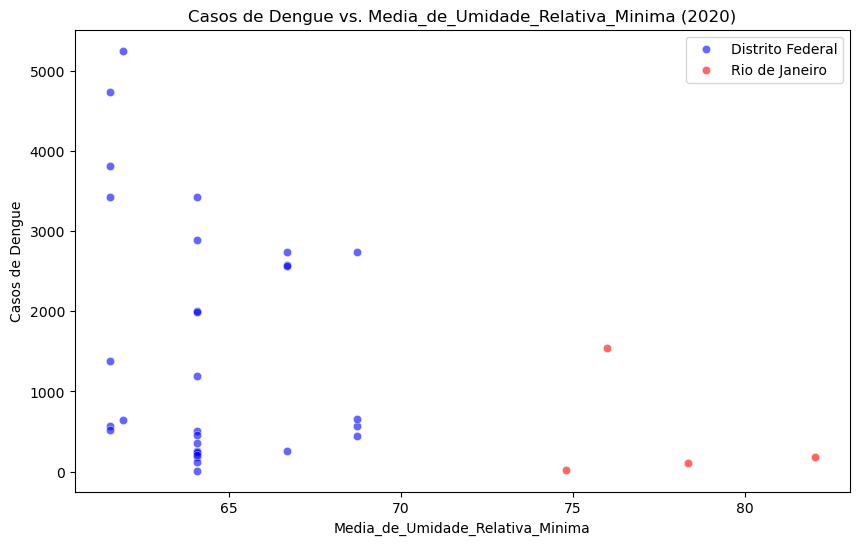

Análise descritiva para o ano 2021:
             Casos  População_Total  Media_de_Precipitação  \
count    35.000000     3.500000e+01              35.000000   
mean    507.885714     2.595315e+07               0.198800   
std     677.408460     1.038762e+08               0.034973   
min      12.000000     4.356000e+05               0.135625   
25%      93.000000     3.340250e+06               0.164302   
50%     223.000000     5.797400e+06               0.195885   
75%     655.000000     1.216530e+07               0.230985   
max    3395.000000     6.211223e+08               0.235389   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    35.000000                    35.000000   
mean                     22.328508                    20.851609   
std                       0.557149                     0.625510   
min                      21.926774                    20.297989   
25%                      21.960477                    20.518328   
50%

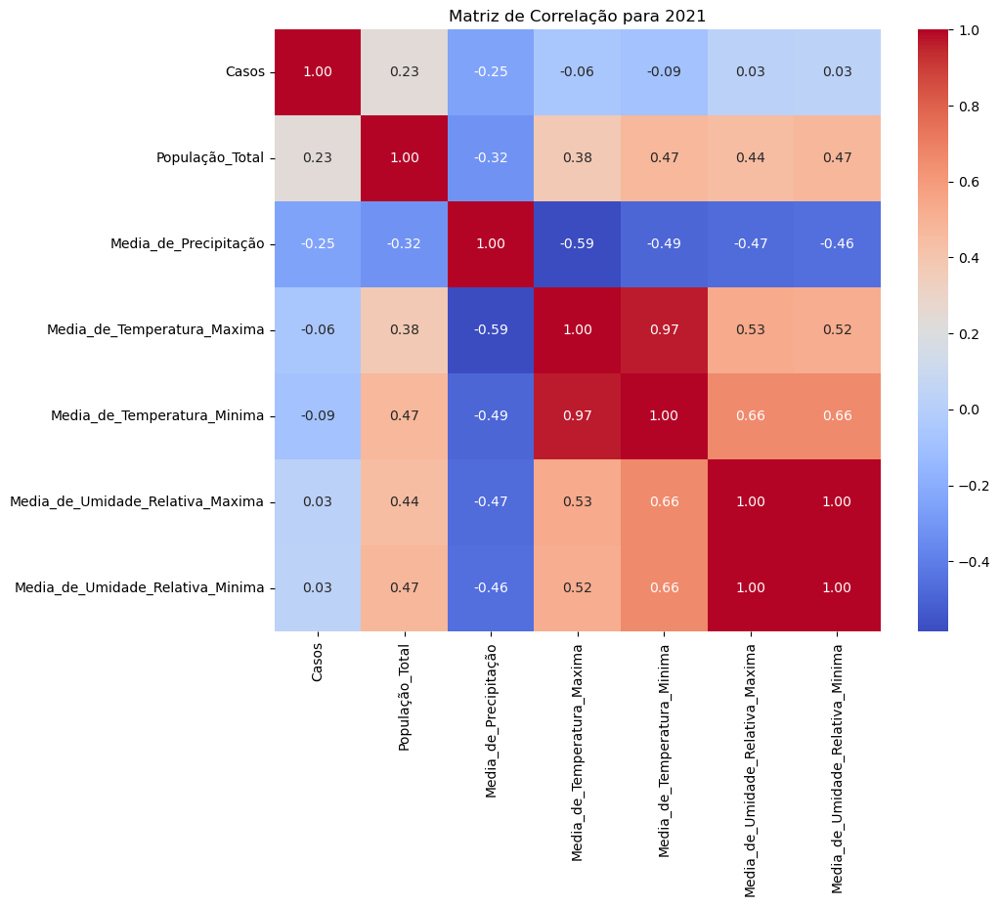

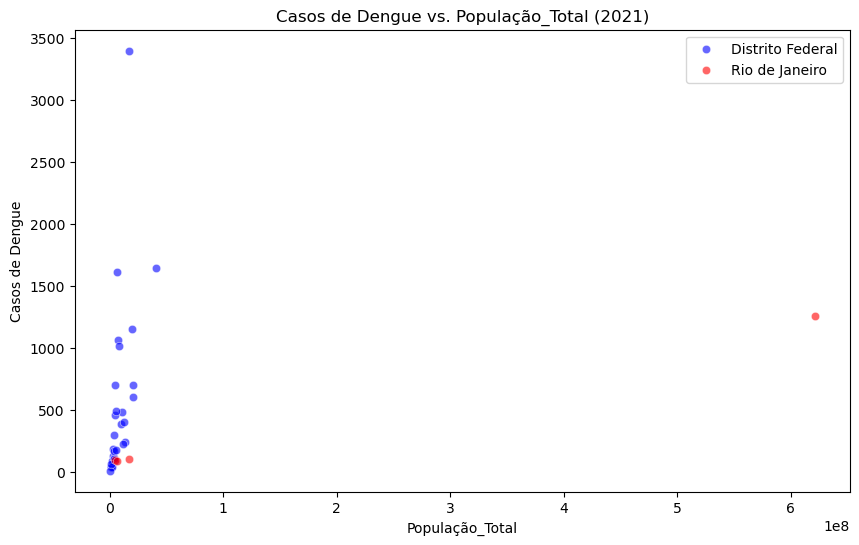

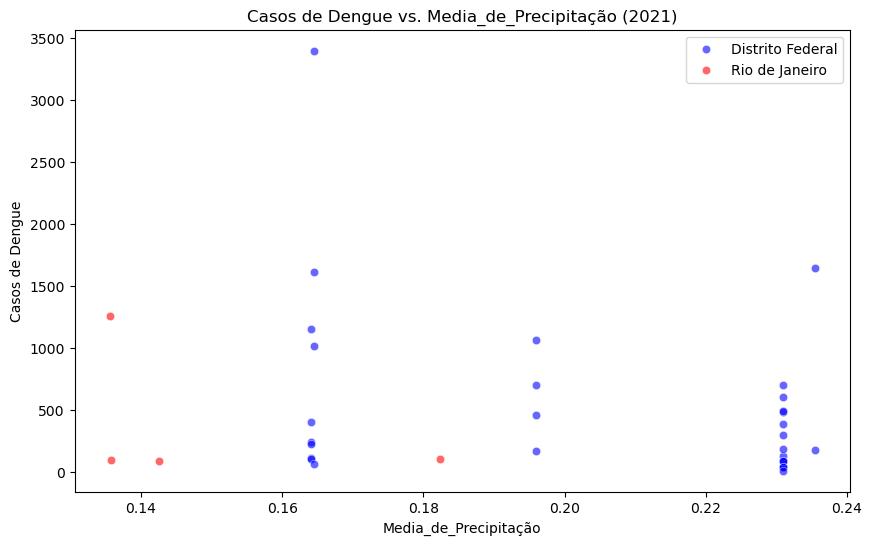

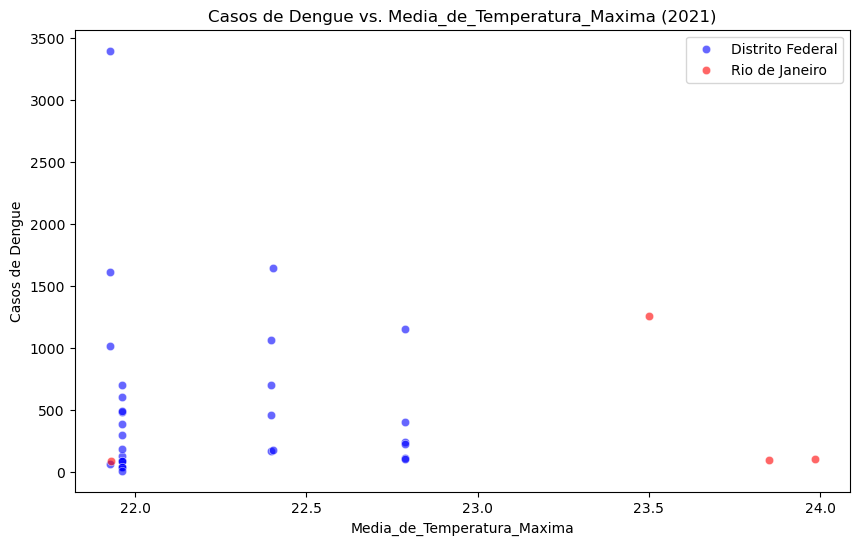

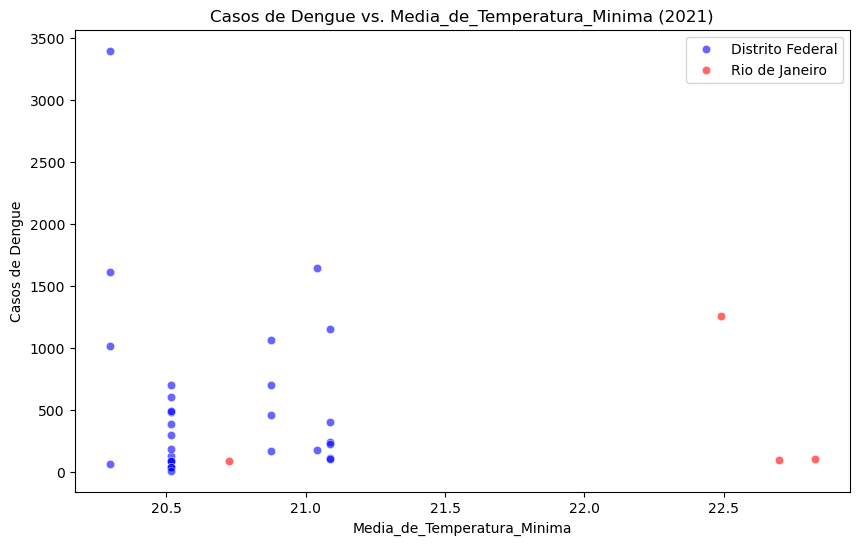

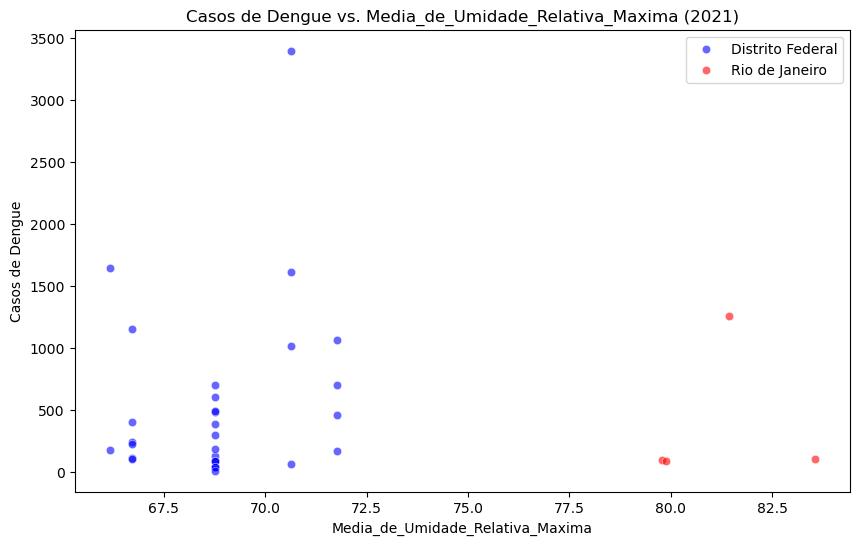

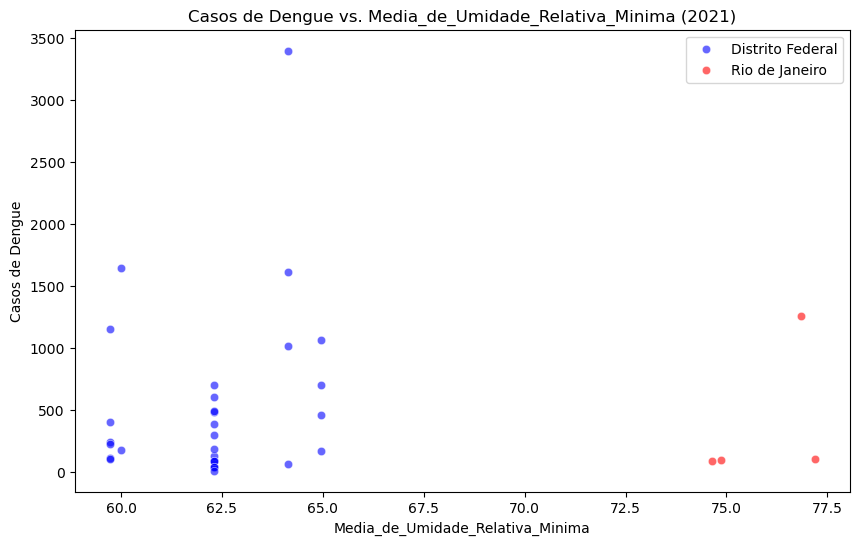

Análise descritiva para o ano 2022:
              Casos  População_Total  Media_de_Precipitação  \
count     35.000000     3.500000e+01              35.000000   
mean    1926.571429     2.595315e+07               0.156256   
std     2450.841804     1.038762e+08               0.031987   
min       11.000000     4.356000e+05               0.122845   
25%      503.500000     3.340250e+06               0.148714   
50%      848.000000     5.797400e+06               0.154858   
75%     2316.500000     1.216530e+07               0.157049   
max    11499.000000     6.211223e+08               0.322412   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    35.000000                    35.000000   
mean                     22.341997                    20.849909   
std                       0.552614                     0.644249   
min                      21.938315                    20.304301   
25%                      21.999247                    20.5251

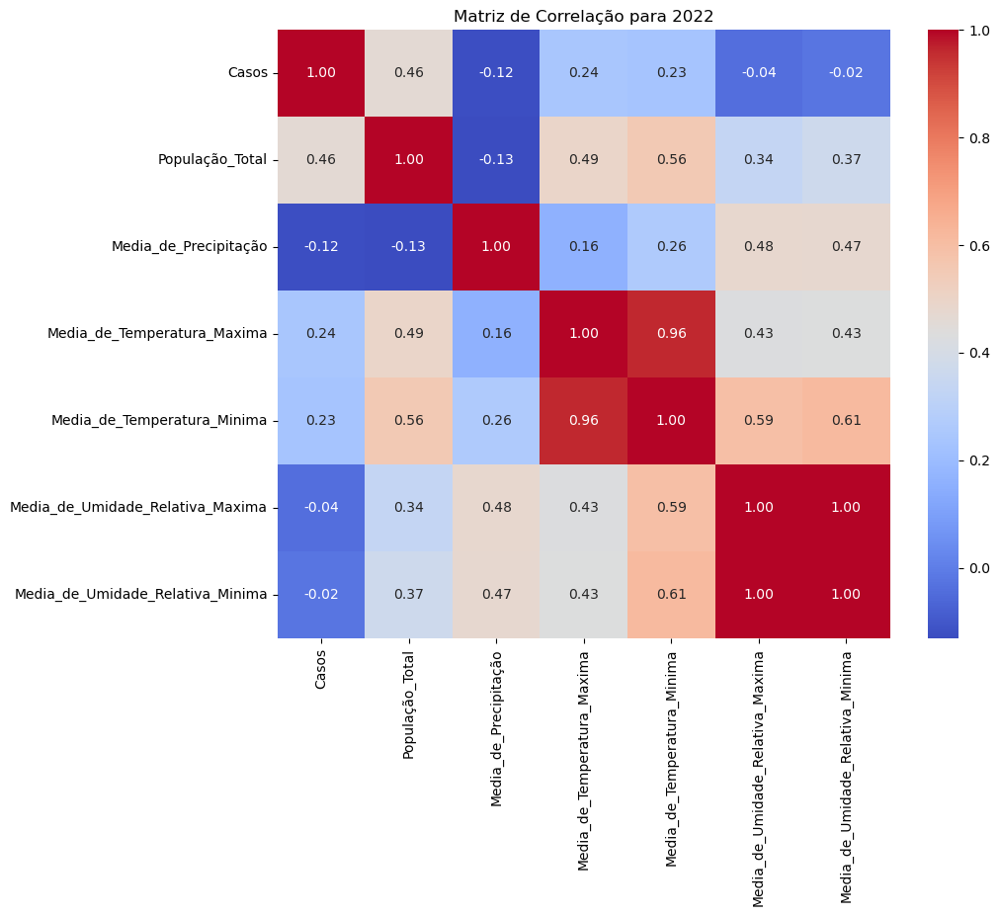

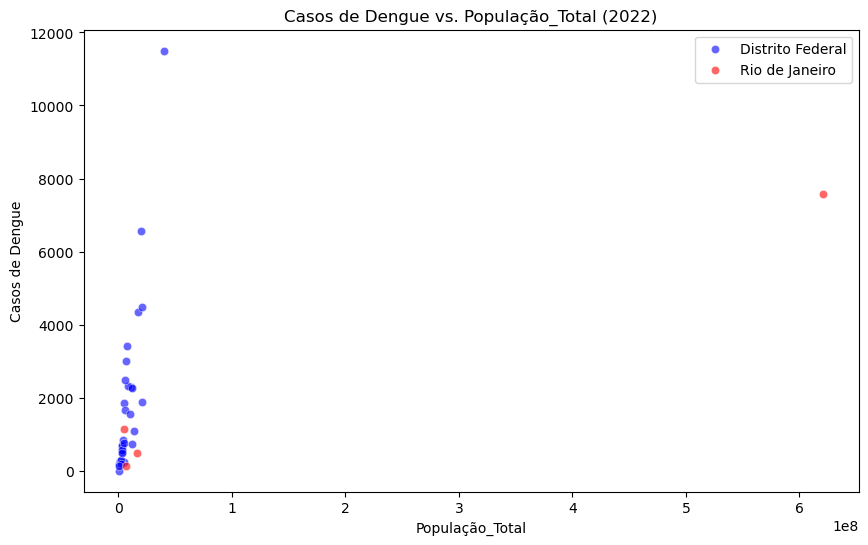

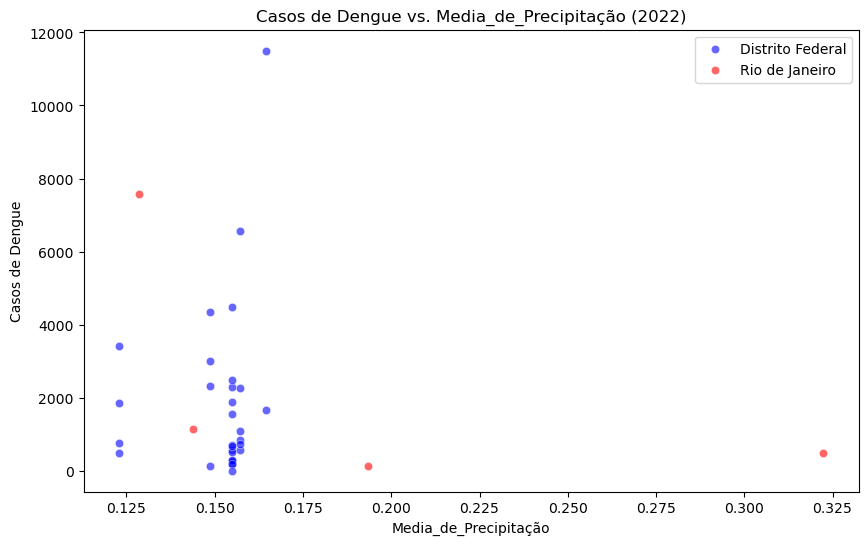

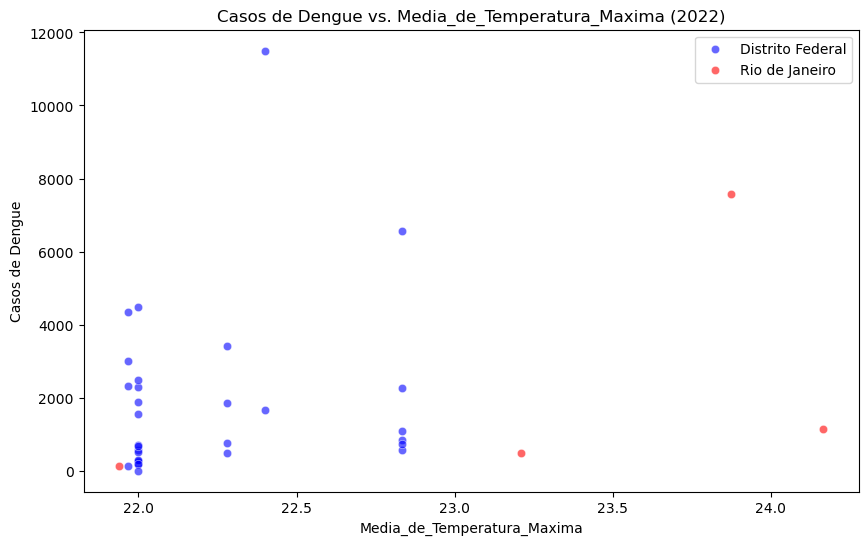

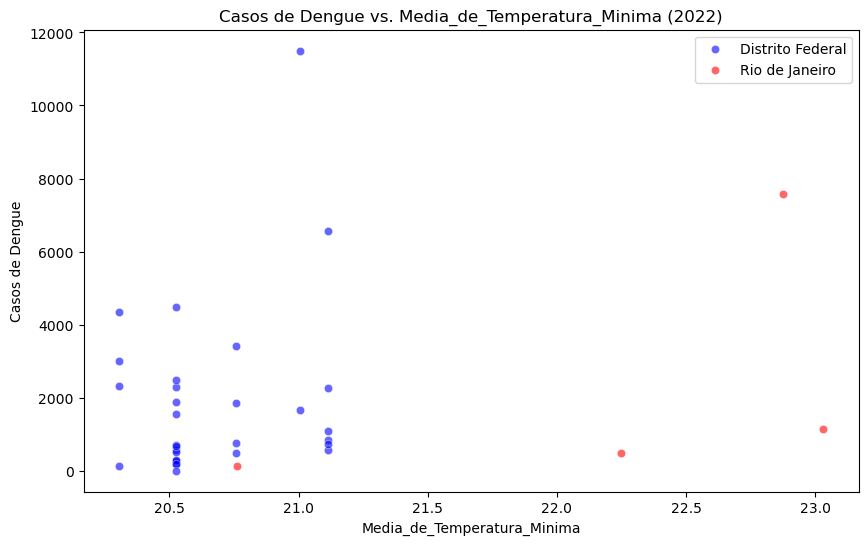

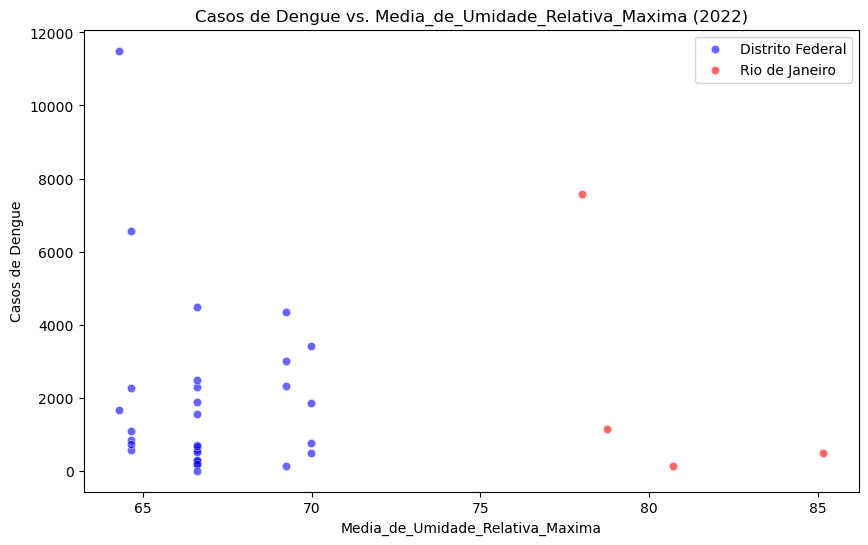

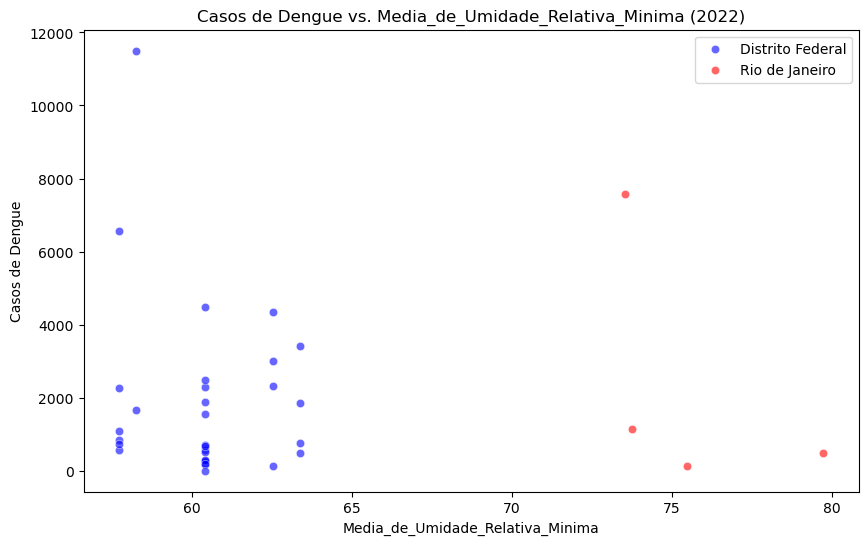

Análise descritiva para o ano 2023:
              Casos  População_Total  Media_de_Precipitação  \
count     35.000000     3.500000e+01              35.000000   
mean    2516.285714     2.595315e+07               0.126220   
std     7348.941295     1.038762e+08               0.026252   
min        8.000000     4.356000e+05               0.091406   
25%      211.000000     3.340250e+06               0.113764   
50%      743.000000     5.797400e+06               0.113764   
75%     2131.500000     1.216530e+07               0.141690   
max    43592.000000     6.211223e+08               0.243733   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    35.000000                    35.000000   
mean                     23.110297                    21.570452   
std                       0.508849                     0.622388   
min                      22.735544                    21.207454   
25%                      22.735544                    21.2074

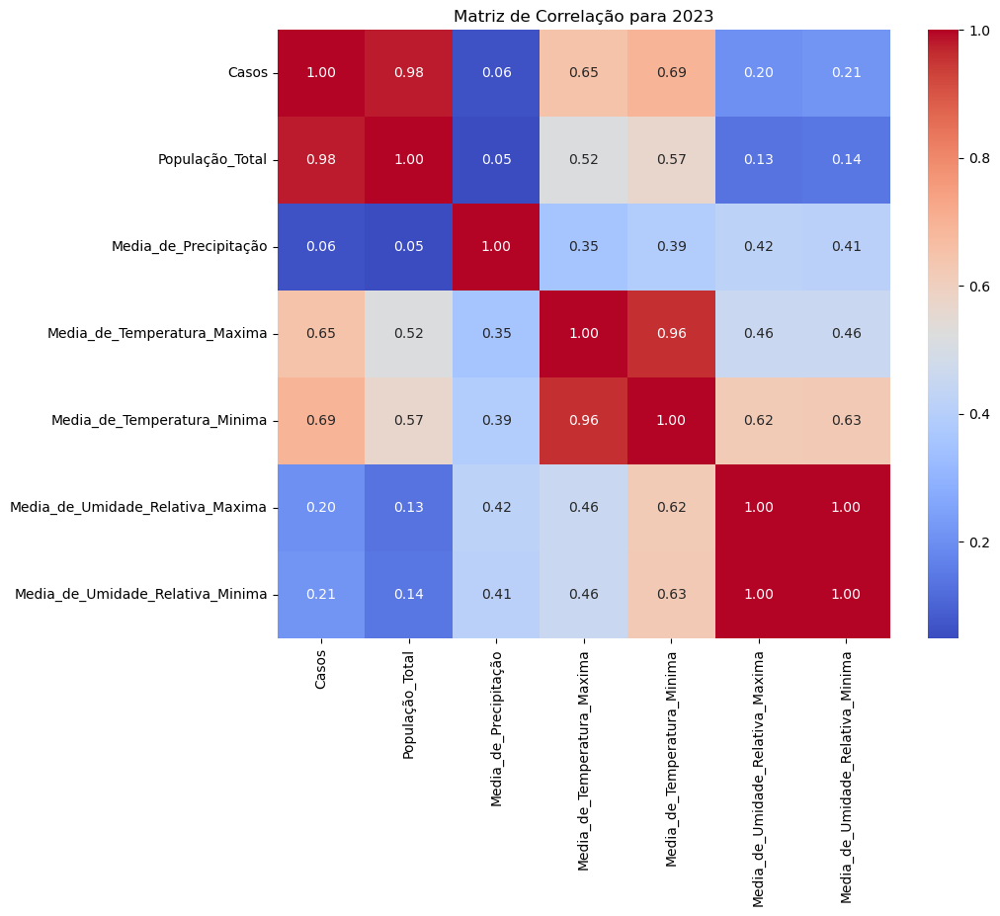

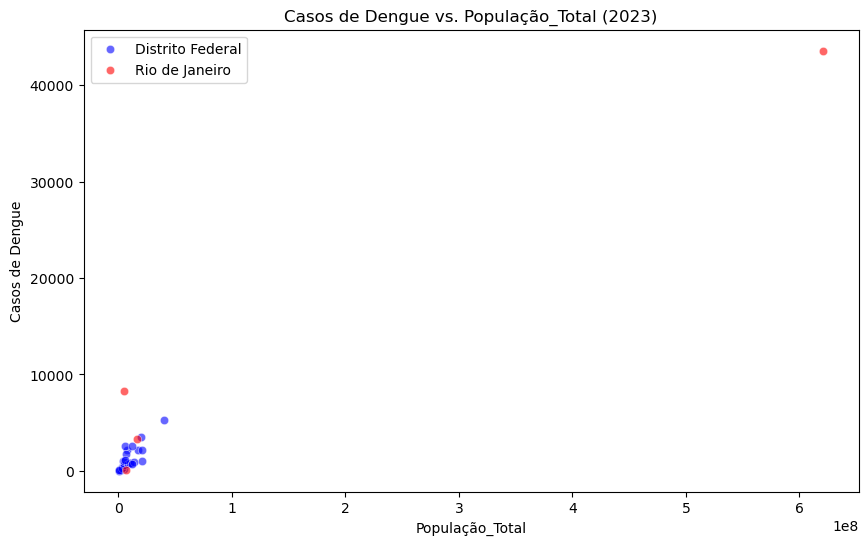

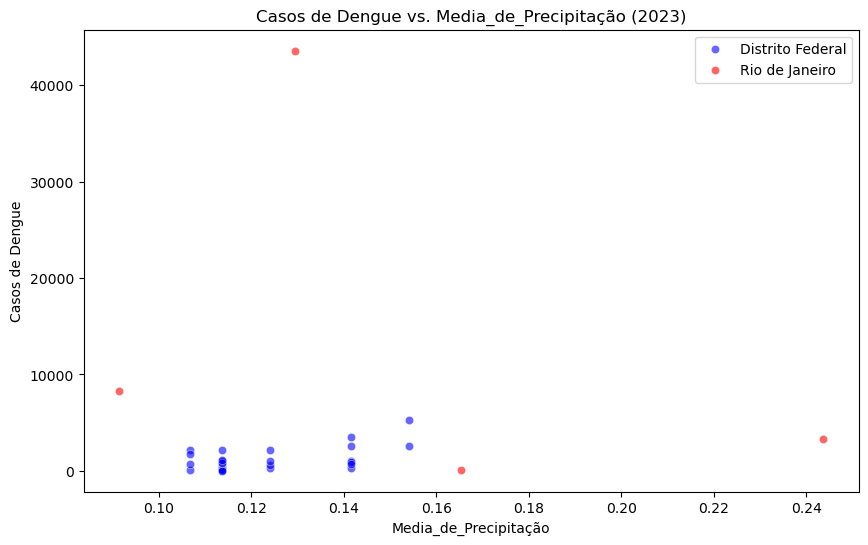

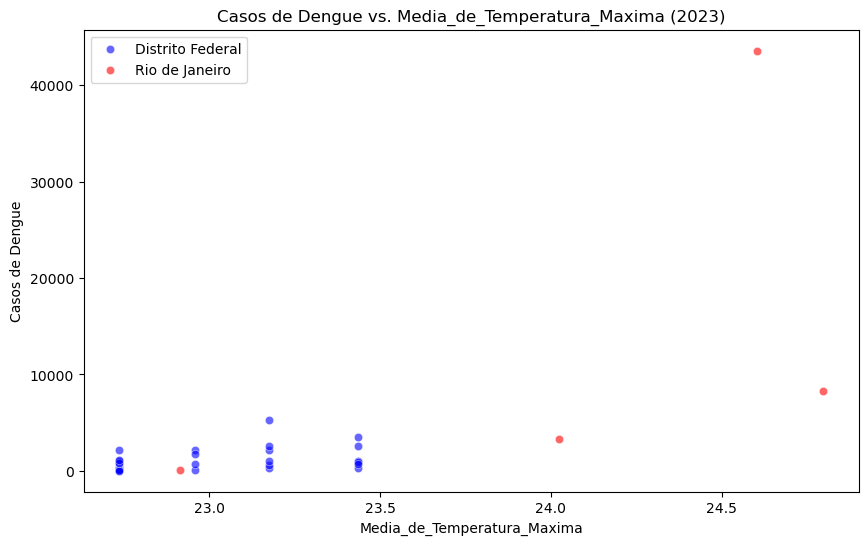

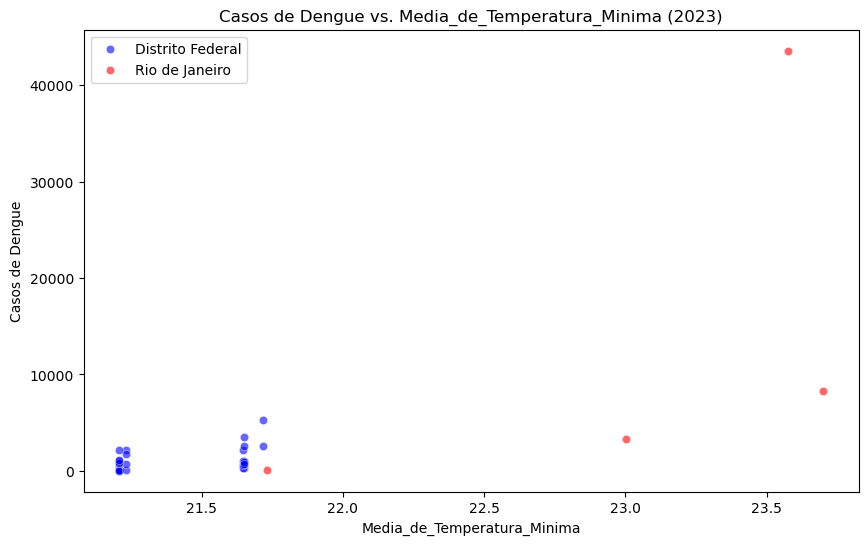

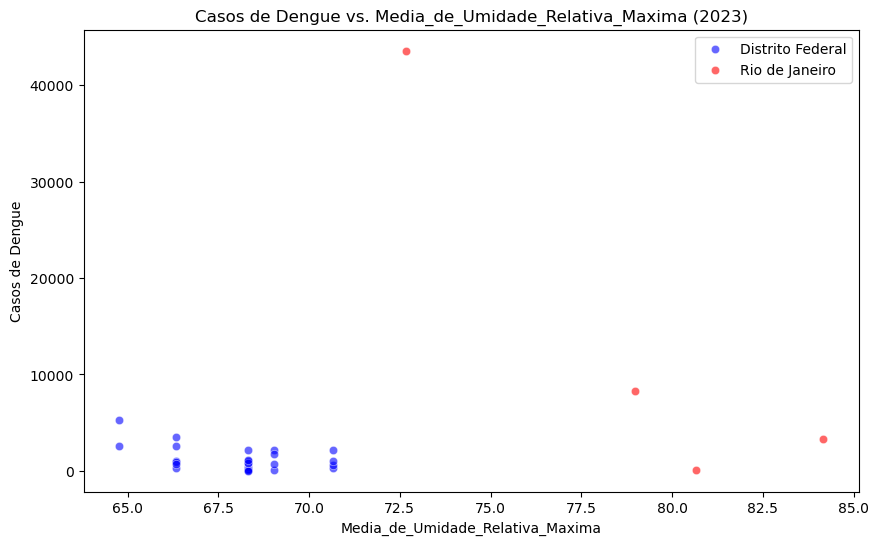

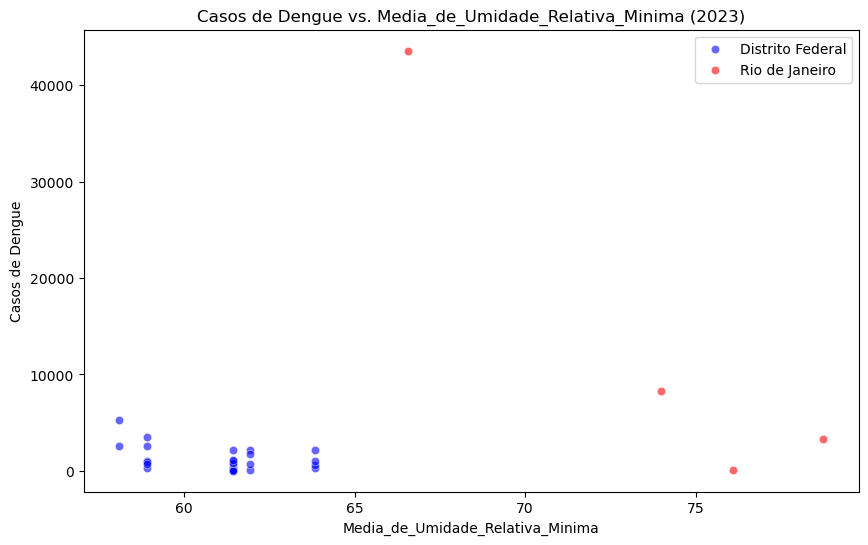

In [24]:
for ano in anos:
    processar_ano_sem_normalizacao(ano)

**Gráfico de Casos de Dengue vs. Precipitação para todos os anos(Sem Normalização)**

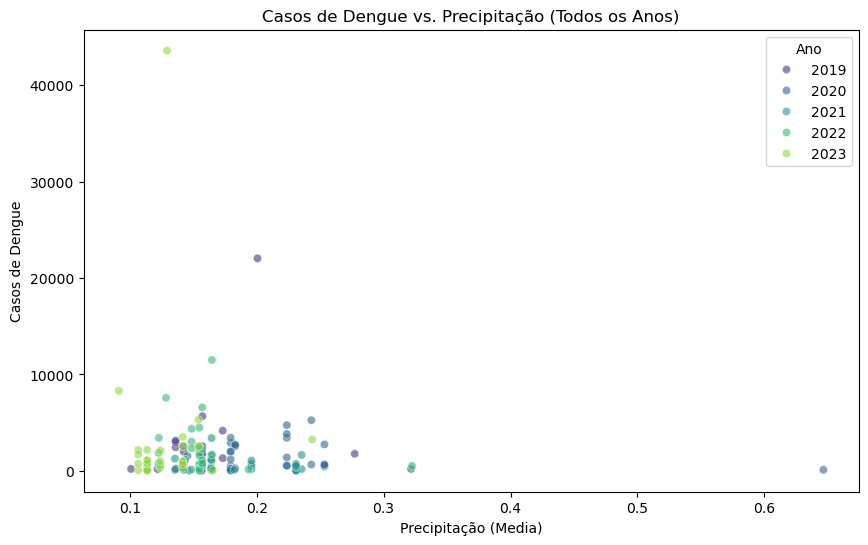

In [25]:
df_consolidado_sem_normalizacao = pd.concat(tabelas_dengue_sem_normalizacao)


plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_consolidado_sem_normalizacao, x='Media_de_Precipitação', y='Casos', hue='Ano', palette='viridis', alpha=0.6)
plt.title('Casos de Dengue vs. Precipitação (Todos os Anos)')
plt.xlabel('Precipitação (Media)')
plt.ylabel('Casos de Dengue')
plt.legend(title='Ano')
plt.show()

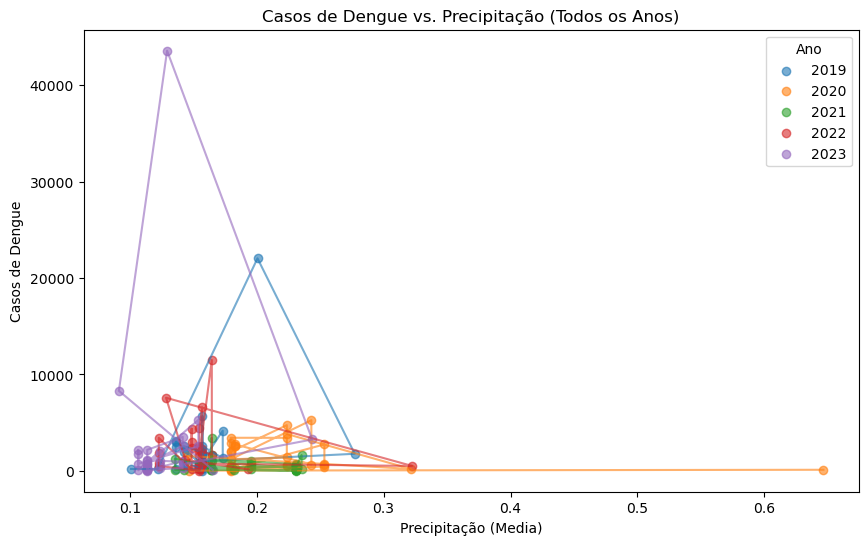

In [26]:
df_consolidado_sem_normalizacao.replace([float('inf'), -float('inf')], pd.NA, inplace=True)
plt.figure(figsize=(10, 6))

for ano in df_consolidado_sem_normalizacao['Ano'].unique():
    subset = df_consolidado_sem_normalizacao[df_consolidado_sem_normalizacao['Ano'] == ano]
    plt.scatter(subset['Media_de_Precipitação'], subset['Casos'], alpha=0.6, label=ano)
    plt.plot(subset['Media_de_Precipitação'], subset['Casos'], alpha=0.6)

plt.title('Casos de Dengue vs. Precipitação (Todos os Anos)')
plt.xlabel('Precipitação (Media)')
plt.ylabel('Casos de Dengue')
plt.legend(title='Ano')
plt.show()

C:\Users\lucas\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


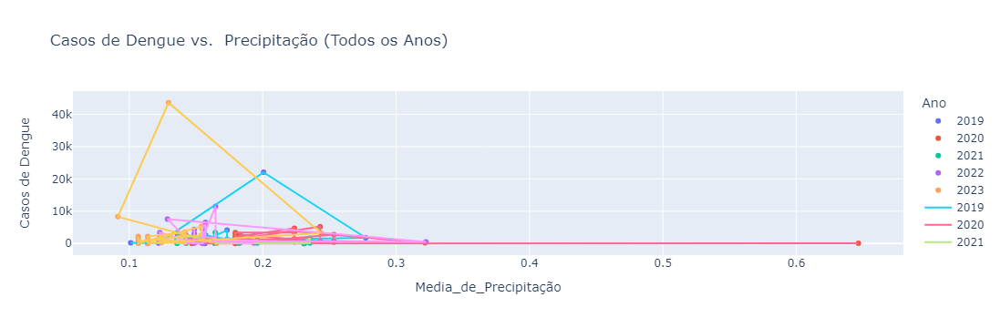

In [27]:
df_consolidado_sem_normalizacao.replace([float('inf'), -float('inf')], pd.NA, inplace=True)


fig = px.scatter(df_consolidado_sem_normalizacao, 
                 x='Media_de_Precipitação', 
                 y='Casos', 
                 color='Ano', 
                 title='Casos de Dengue vs.  Precipitação (Todos os Anos)',
                 labels={'Media_de_Temperatura_Minima': 'Precipitação (Média)', 'Casos': 'Casos de Dengue'})


for ano in df_consolidado_sem_normalizacao['Ano'].unique():
    subset = df_consolidado_sem_normalizacao[df_consolidado_sem_normalizacao['Ano'] == ano]
    fig.add_scatter(x=subset['Media_de_Precipitação'], 
                     y=subset['Casos'], 
                     mode='lines', 
                     name=str(ano))

fig.show()

**Casos de Dengue vs. Temperatura Máxima (Todos os Anos)(Sem Normalização)**

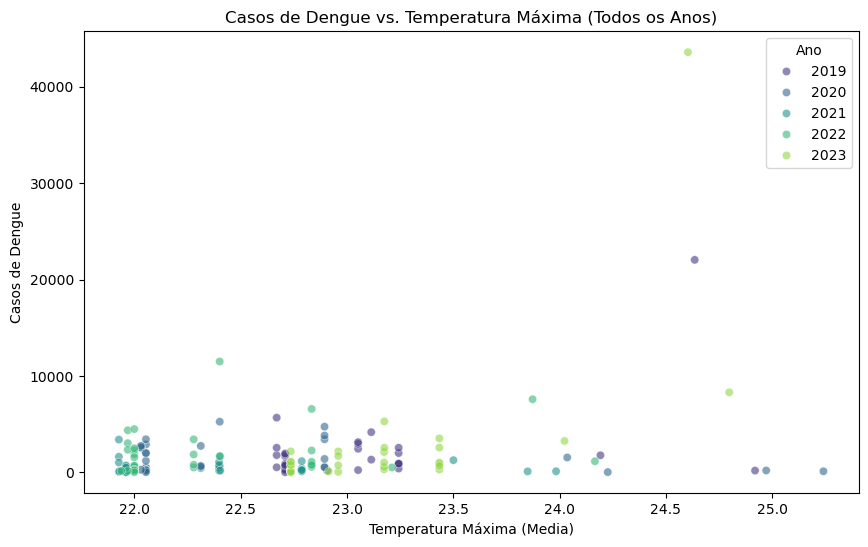

In [28]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_consolidado_sem_normalizacao, x='Media_de_Temperatura_Maxima', y='Casos', hue='Ano', palette='viridis', alpha=0.6)
plt.title('Casos de Dengue vs. Temperatura Máxima (Todos os Anos)')
plt.xlabel('Temperatura Máxima (Media)')
plt.ylabel('Casos de Dengue')
plt.legend(title='Ano')
plt.show()

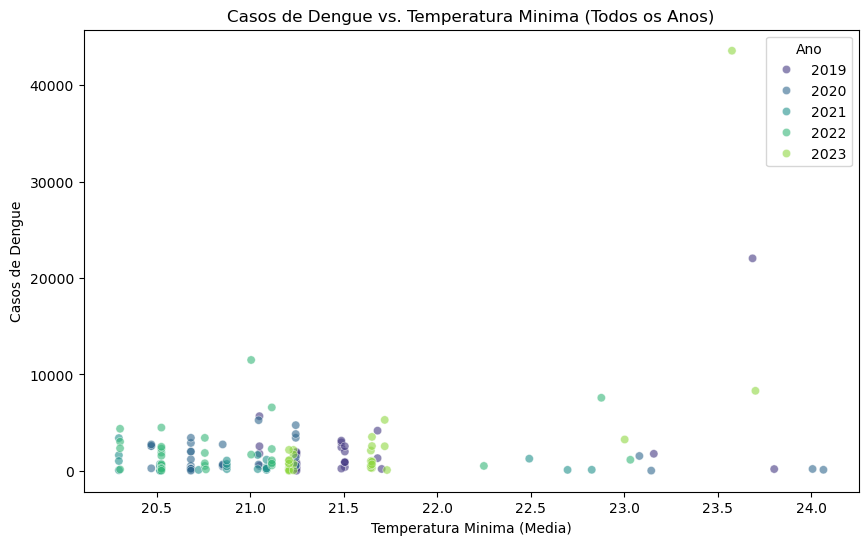

In [29]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_consolidado_sem_normalizacao, x='Media_de_Temperatura_Minima', y='Casos', hue='Ano', palette='viridis', alpha=0.6)
plt.title('Casos de Dengue vs. Temperatura Minima (Todos os Anos)')
plt.xlabel('Temperatura Minima (Media)')
plt.ylabel('Casos de Dengue')
plt.legend(title='Ano')
plt.show()

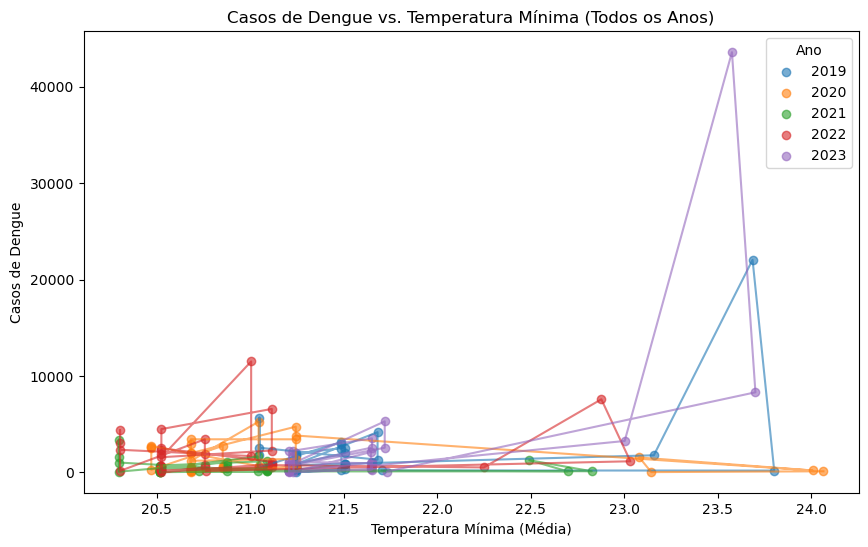

In [30]:
df_consolidado_sem_normalizacao.replace([float('inf'), -float('inf')], pd.NA, inplace=True)
plt.figure(figsize=(10, 6))

for ano in df_consolidado_sem_normalizacao['Ano'].unique():
    subset = df_consolidado_sem_normalizacao[df_consolidado_sem_normalizacao['Ano'] == ano]
    plt.scatter(subset['Media_de_Temperatura_Minima'], subset['Casos'], alpha=0.6, label=ano)
    plt.plot(subset['Media_de_Temperatura_Minima'], subset['Casos'], alpha=0.6)

plt.title('Casos de Dengue vs. Temperatura Mínima (Todos os Anos)')
plt.xlabel('Temperatura Mínima (Média)')
plt.ylabel('Casos de Dengue')
plt.legend(title='Ano')
plt.show()

C:\Users\lucas\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



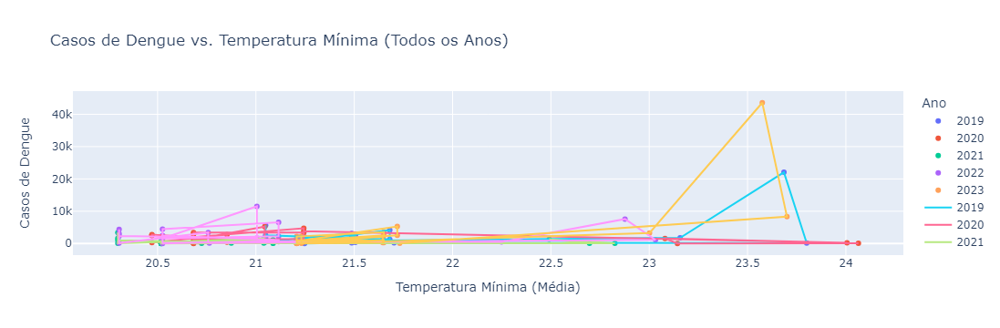

In [31]:
df_consolidado_sem_normalizacao.replace([float('inf'), -float('inf')], pd.NA, inplace=True)


fig = px.scatter(df_consolidado_sem_normalizacao, 
                 x='Media_de_Temperatura_Minima', 
                 y='Casos', 
                 color='Ano', 
                 title='Casos de Dengue vs. Temperatura Mínima (Todos os Anos)',
                 labels={'Media_de_Temperatura_Minima': 'Temperatura Mínima (Média)', 'Casos': 'Casos de Dengue'})


for ano in df_consolidado_sem_normalizacao['Ano'].unique():
    subset = df_consolidado_sem_normalizacao[df_consolidado_sem_normalizacao['Ano'] == ano]
    fig.add_scatter(x=subset['Media_de_Temperatura_Minima'], 
                     y=subset['Casos'], 
                     mode='lines', 
                     name=str(ano))

fig.show()

***
TESTE EM ANDAMENTO
***

Análise descritiva para o ano 2019 - Rio de Janeiro:
              Casos  População_Total  Media_de_Precipitação  \
count      4.000000     4.000000e+00               4.000000   
mean    6044.250000     1.623775e+08               0.175202   
std    10693.820782     3.058743e+08               0.080417   
min      177.000000     4.835400e+06               0.101036   
25%      186.750000     6.315450e+06               0.116680   
50%      977.000000     1.177610e+07               0.161267   
75%     6834.500000     1.678381e+08               0.219789   
max    22046.000000     6.211223e+08               0.277238   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                     4.000000                     4.000000   
mean                     24.163448                    23.086389   
std                       0.889751                     0.964161   
min                      22.906605                    21.702525   
25%                      23.870734          

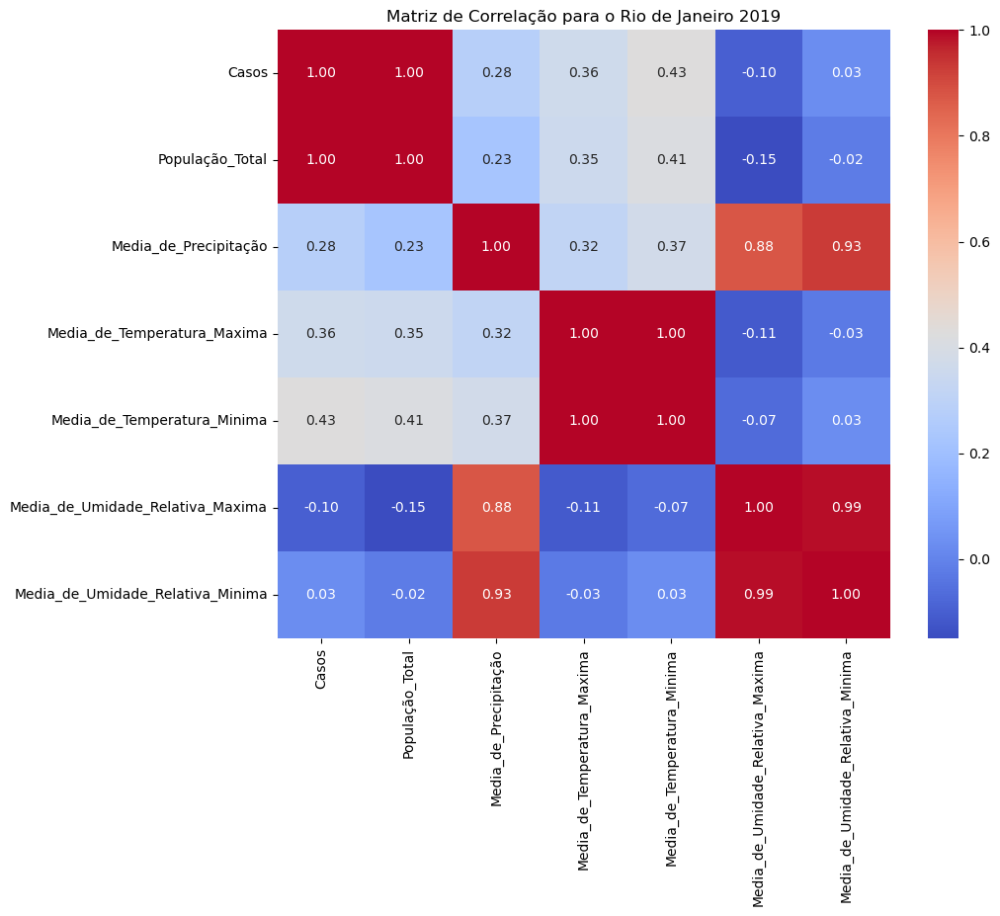

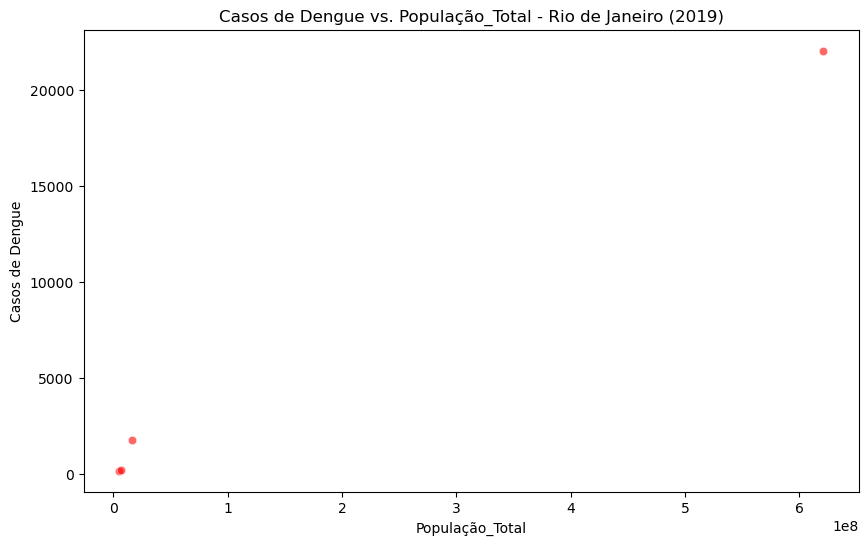

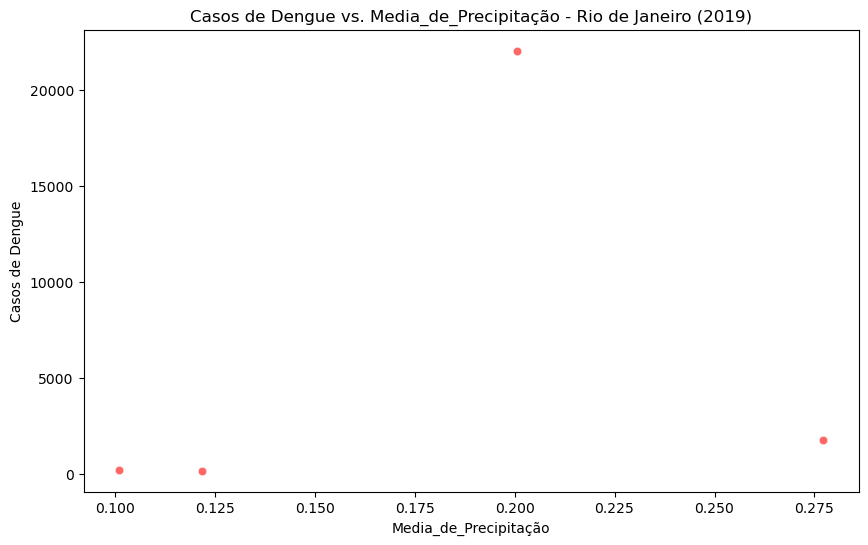

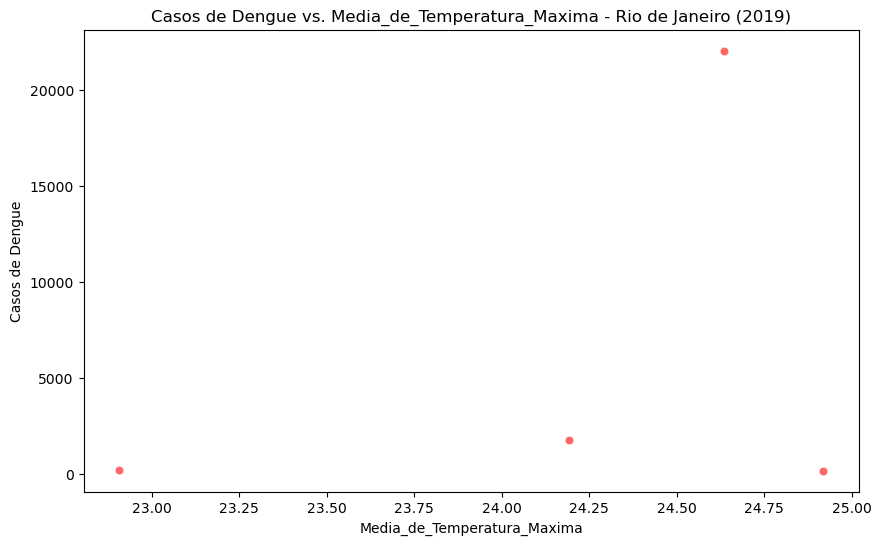

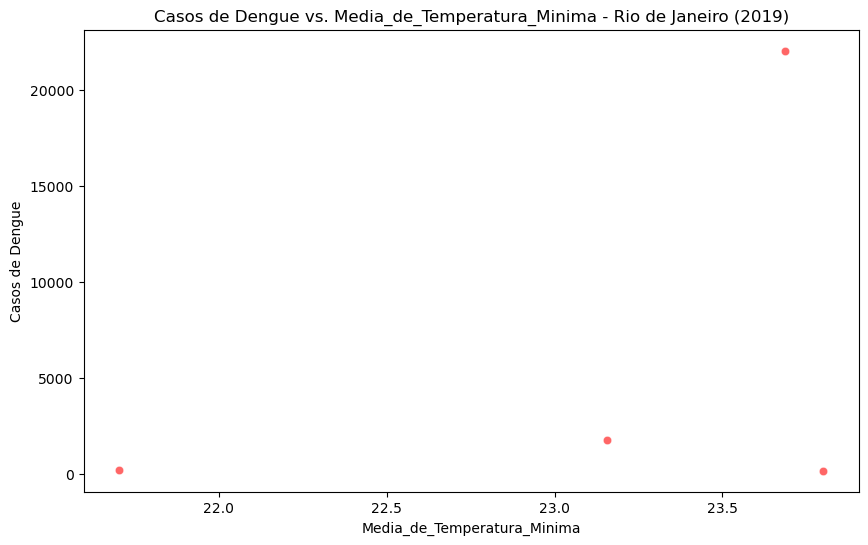

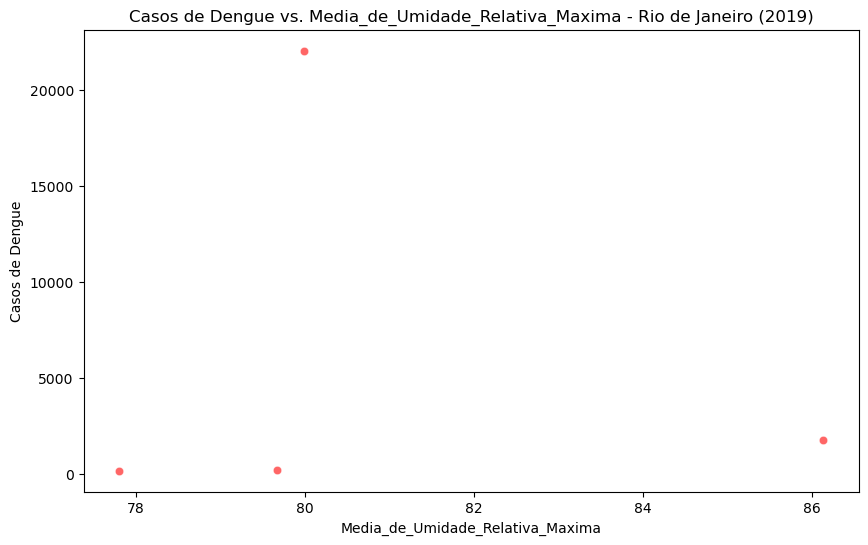

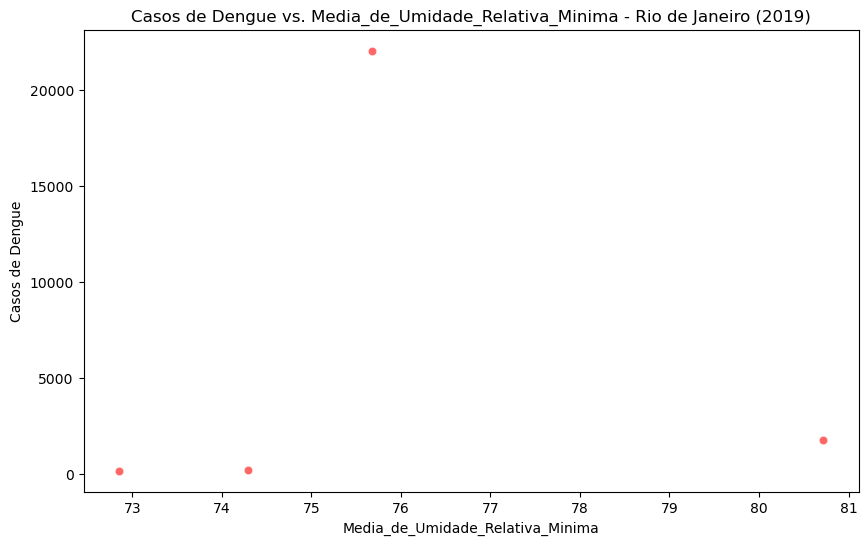

Análise descritiva para o ano 2020 - Rio de Janeiro:
             Casos  População_Total  Media_de_Precipitação  \
count     4.000000     4.000000e+00               4.000000   
mean    461.250000     1.623775e+08               0.315126   
std     719.814502     3.058743e+08               0.235941   
min      18.000000     4.835400e+06               0.145406   
25%      82.500000     6.315450e+06               0.146529   
50%     145.500000     1.177610e+07               0.234261   
75%     524.250000     1.678381e+08               0.402858   
max    1536.000000     6.211223e+08               0.646575   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                     4.000000                     4.000000   
mean                     24.618879                    23.573293   
std                       0.578920                     0.534074   
min                      24.035892                    23.080087   
25%                      24.178978                   

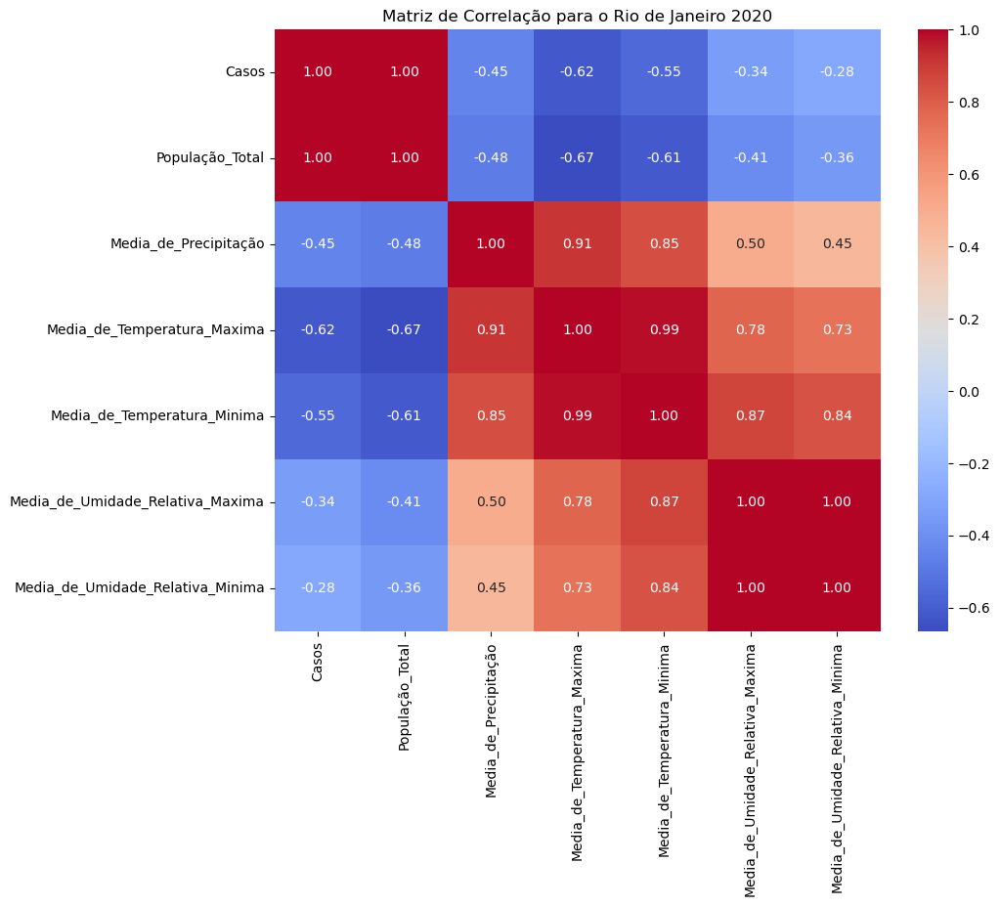

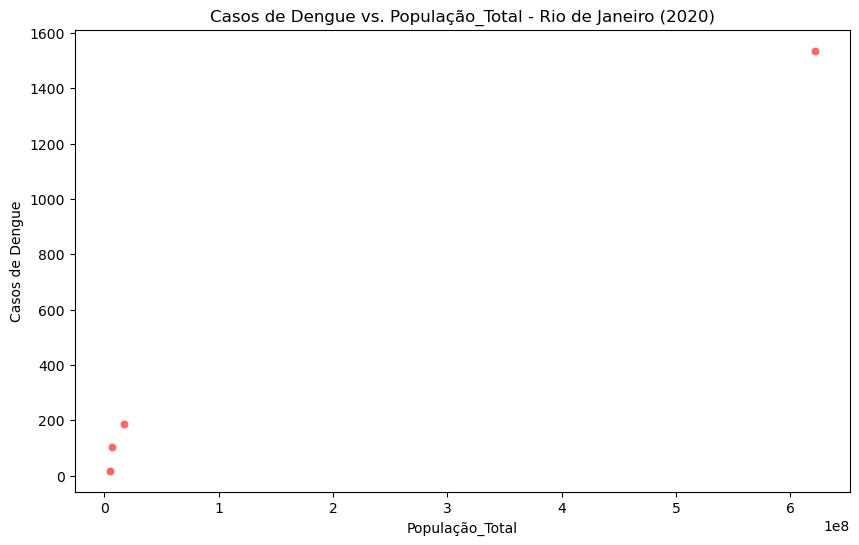

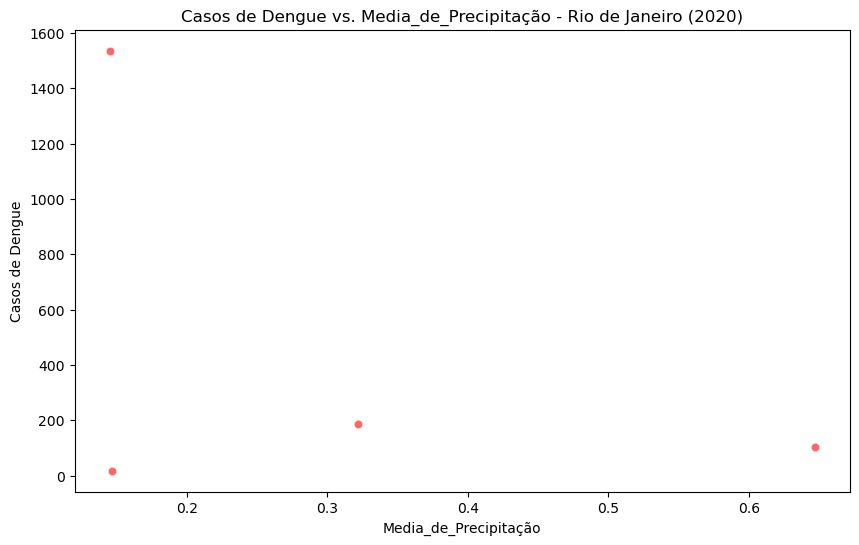

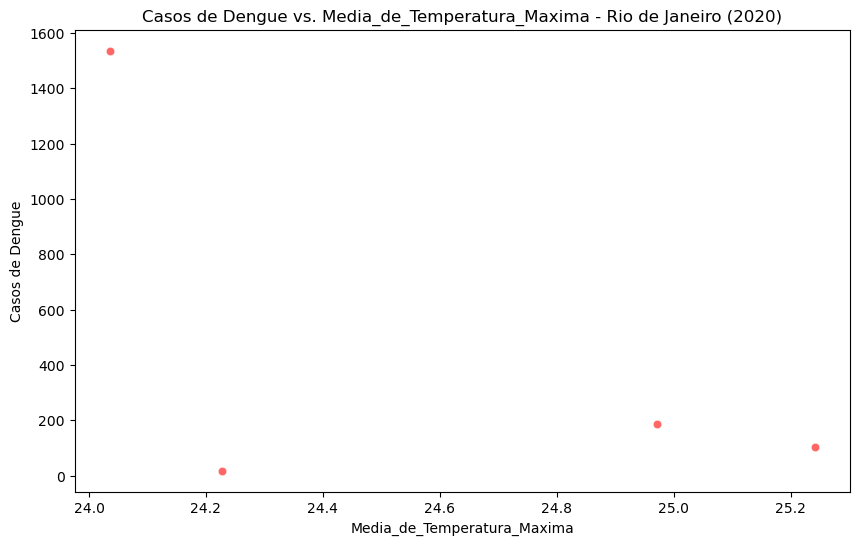

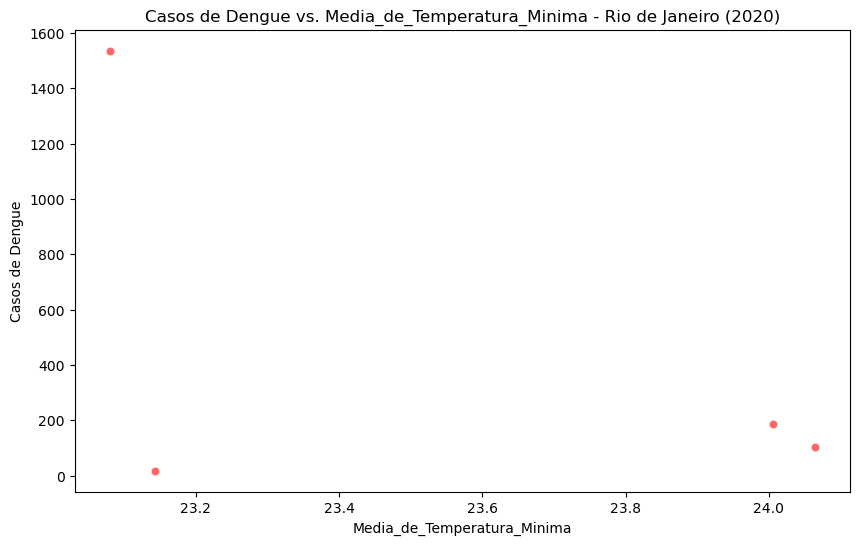

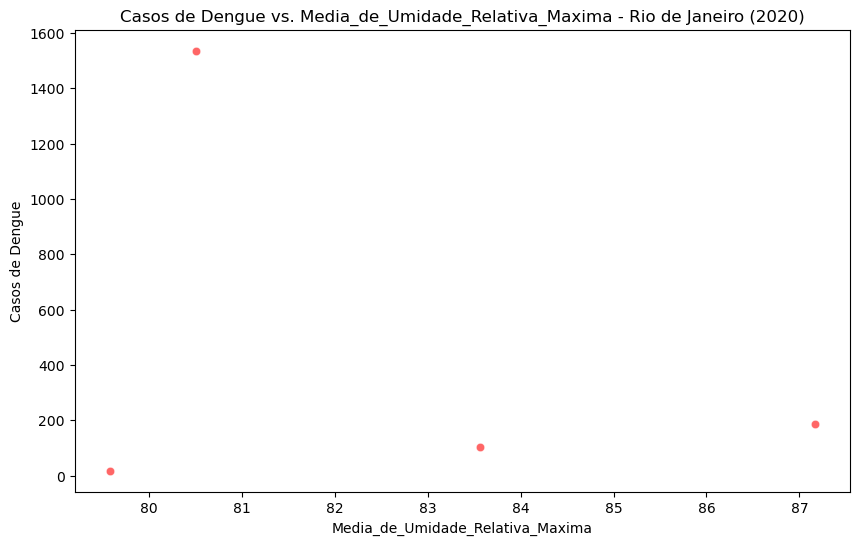

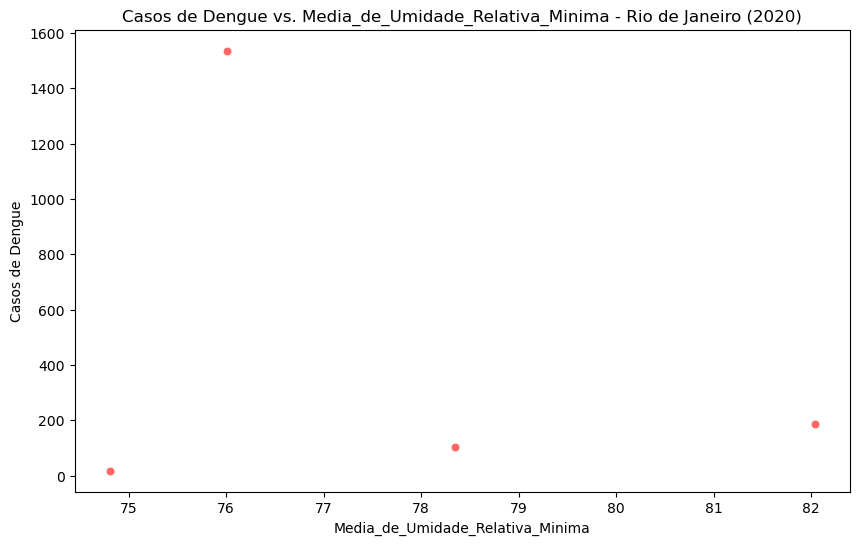

Análise descritiva para o ano 2021 - Rio de Janeiro:
             Casos  População_Total  Media_de_Precipitação  \
count     4.000000     4.000000e+00               4.000000   
mean    386.000000     1.623775e+08               0.149043   
std     579.359992     3.058743e+08               0.022437   
min      91.000000     4.835400e+06               0.135625   
25%      93.250000     6.315450e+06               0.135681   
50%      99.000000     1.177610e+07               0.139098   
75%     391.750000     1.678381e+08               0.152460   
max    1255.000000     6.211223e+08               0.182349   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                     4.000000                     4.000000   
mean                     23.315666                    22.184298   
std                       0.946476                     0.983281   
min                      21.929206                    20.723858   
25%                      23.107576                   

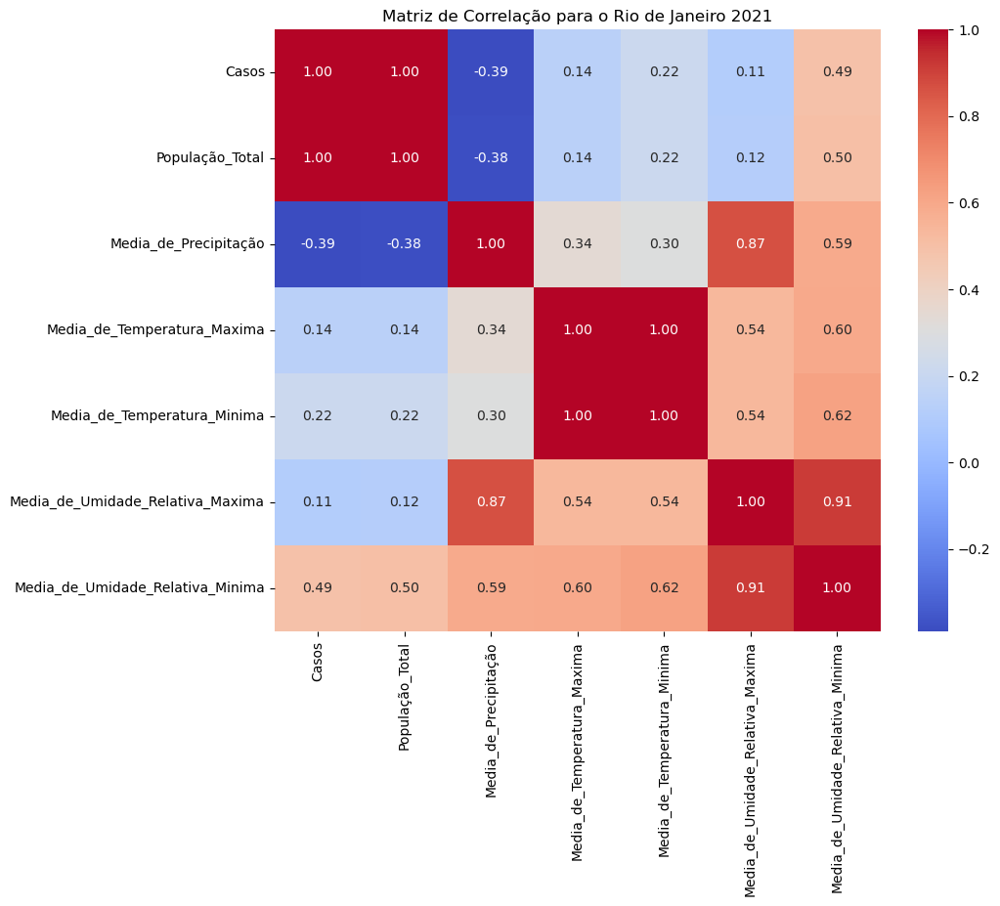

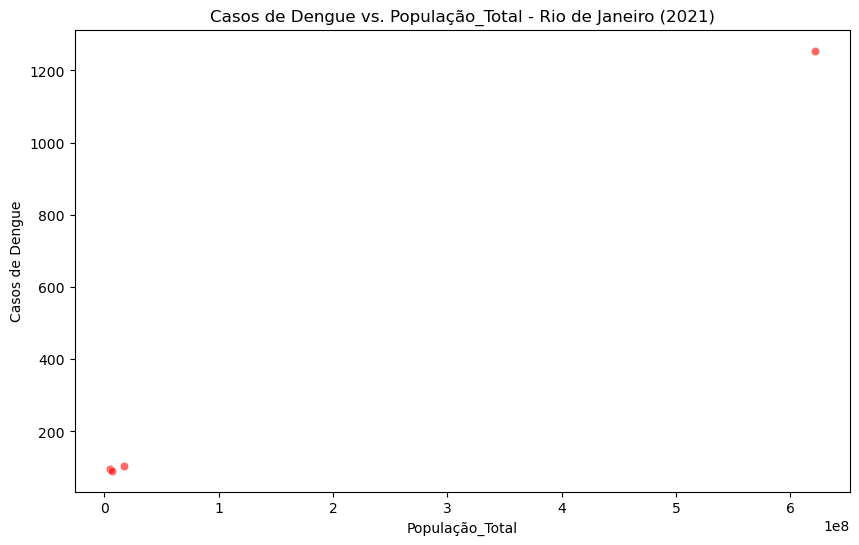

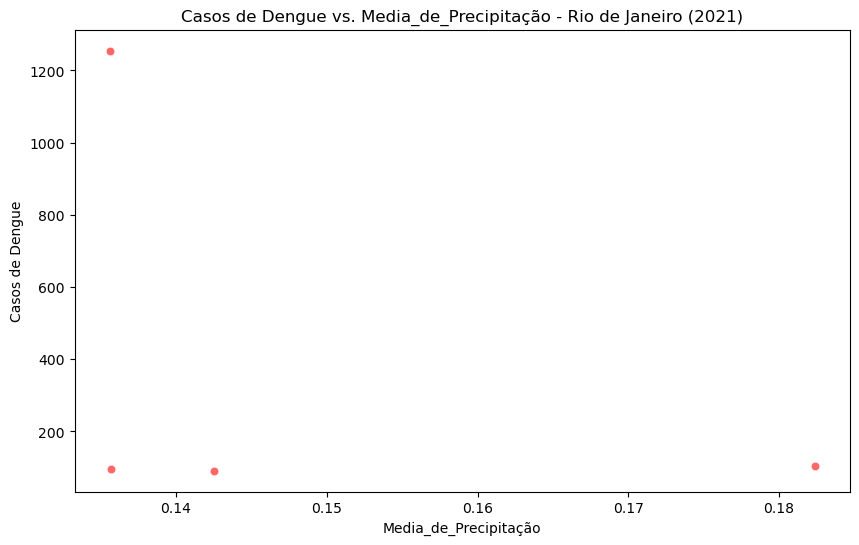

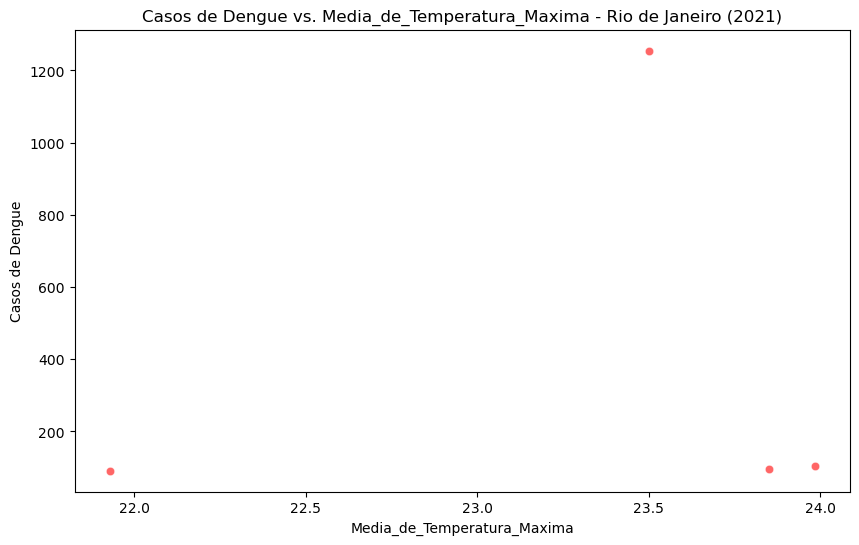

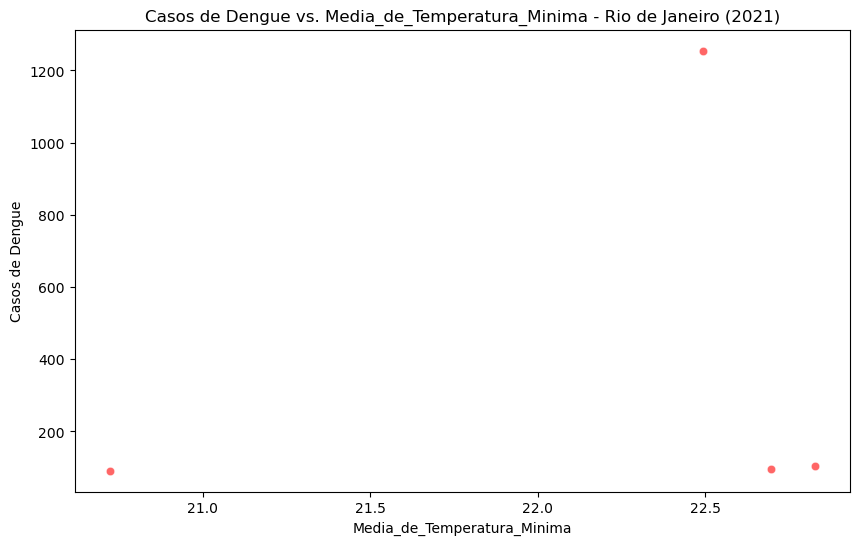

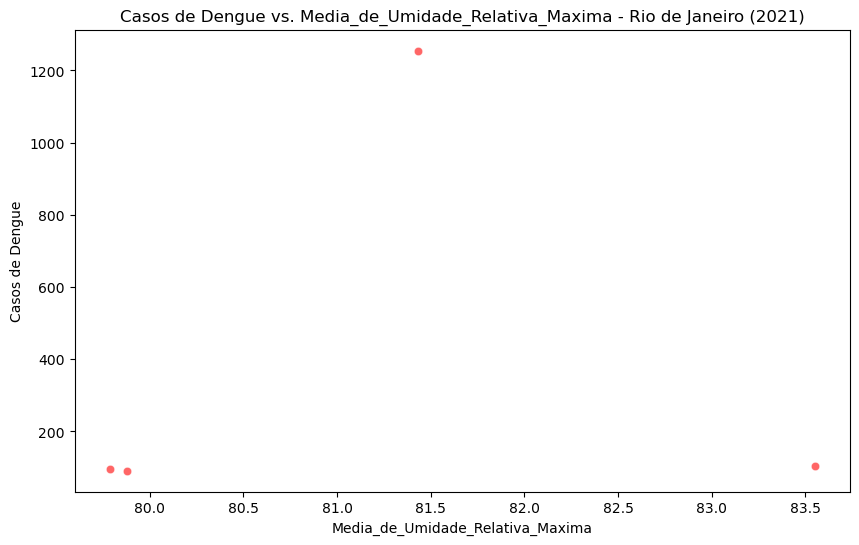

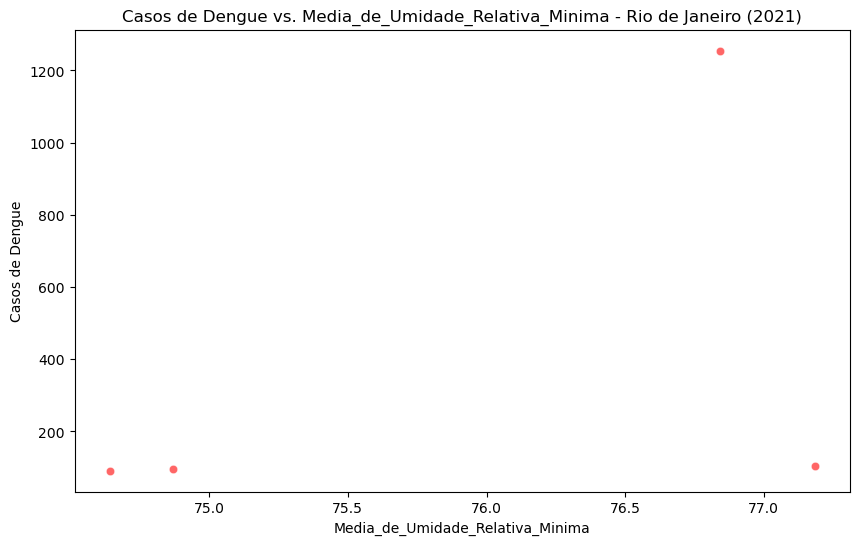

Análise descritiva para o ano 2022 - Rio de Janeiro:
             Casos  População_Total  Media_de_Precipitação  \
count     4.000000     4.000000e+00               4.000000   
mean   2342.000000     1.623775e+08               0.197065   
std    3513.564951     3.058743e+08               0.088052   
min     146.000000     4.835400e+06               0.128567   
25%     414.500000     6.315450e+06               0.139950   
50%     823.000000     1.177610e+07               0.168642   
75%    2750.500000     1.678381e+08               0.225757   
max    7576.000000     6.211223e+08               0.322412   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                     4.000000                     4.000000   
mean                     23.297190                    22.230229   
std                       0.990077                     1.034832   
min                      21.938315                    20.763363   
25%                      22.892982                   

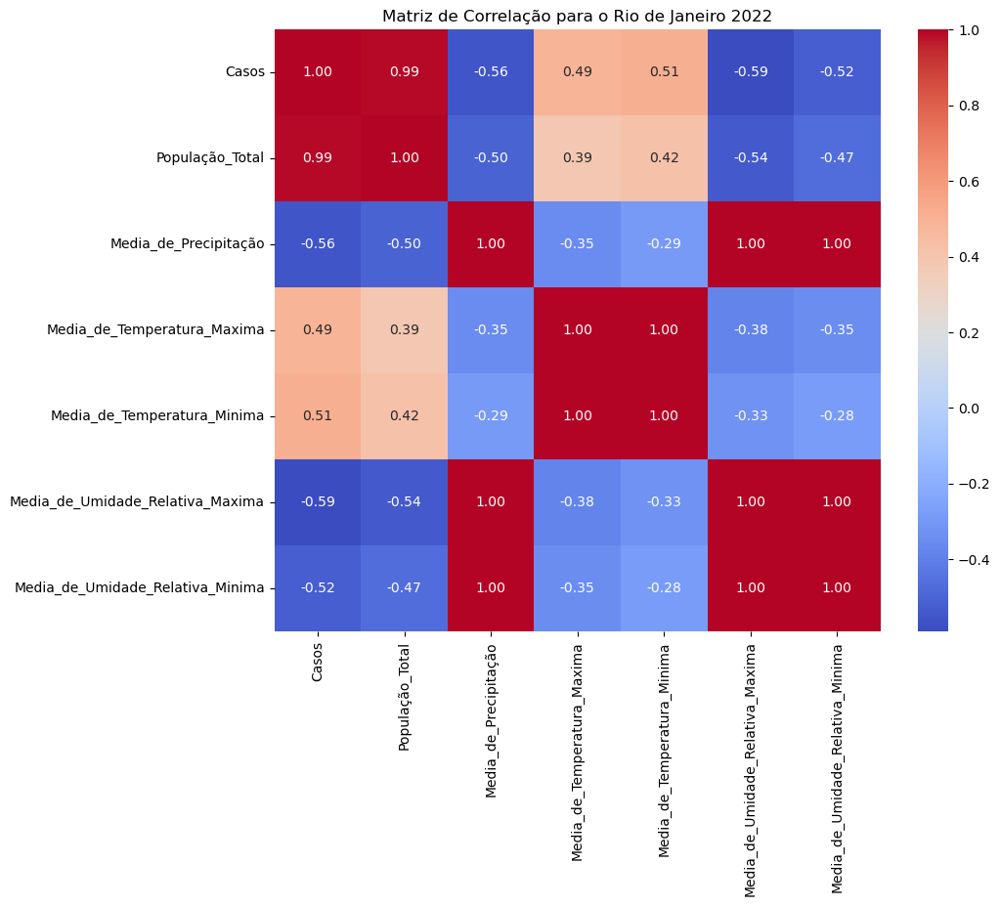

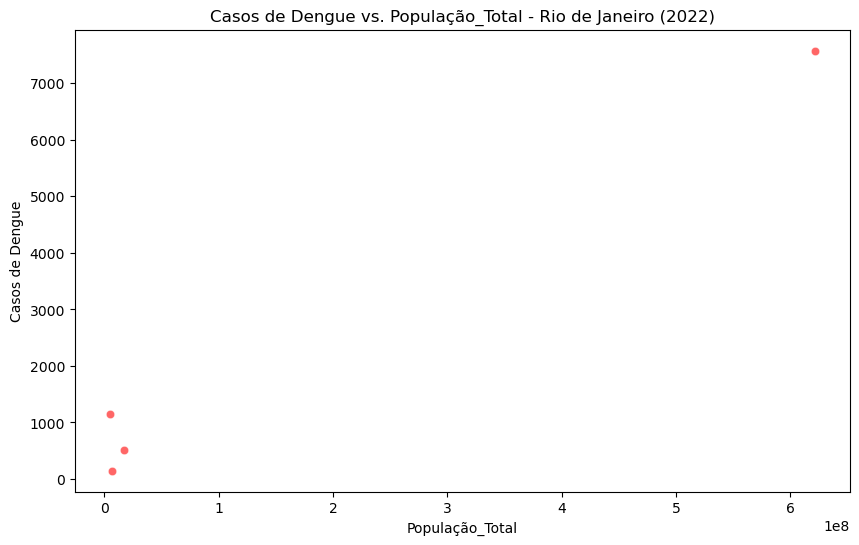

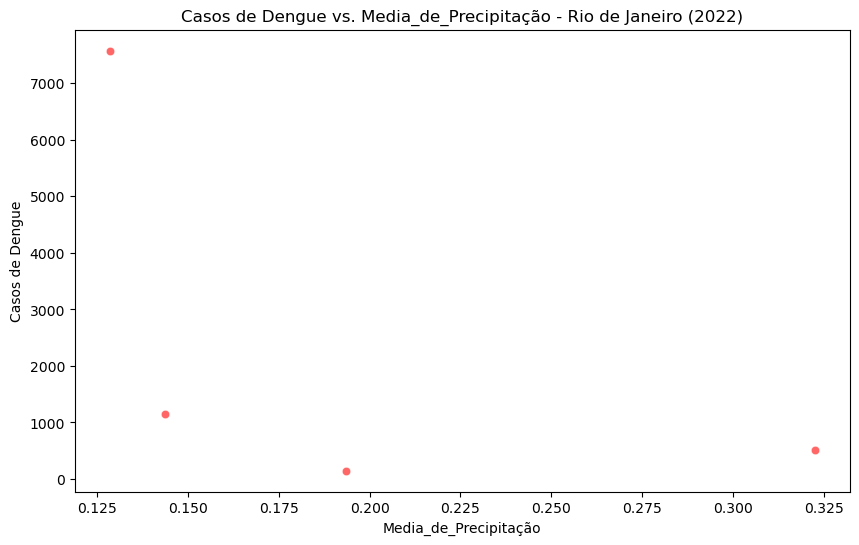

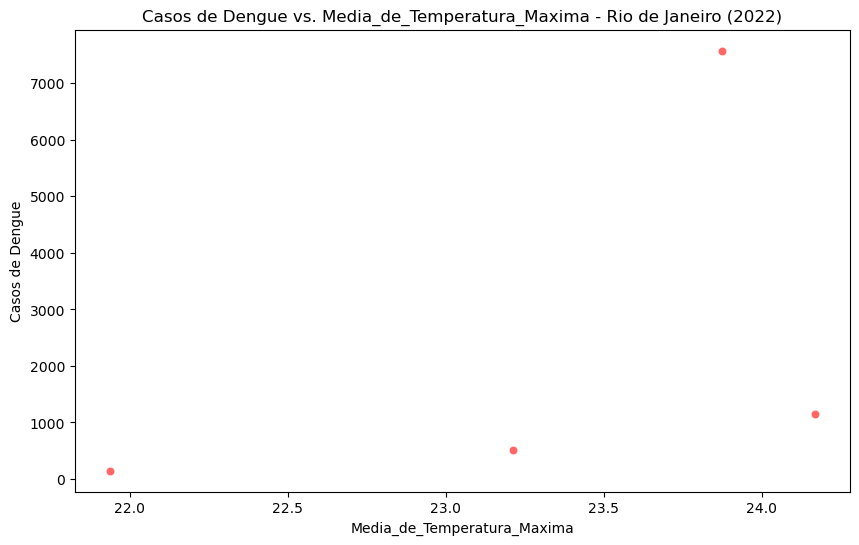

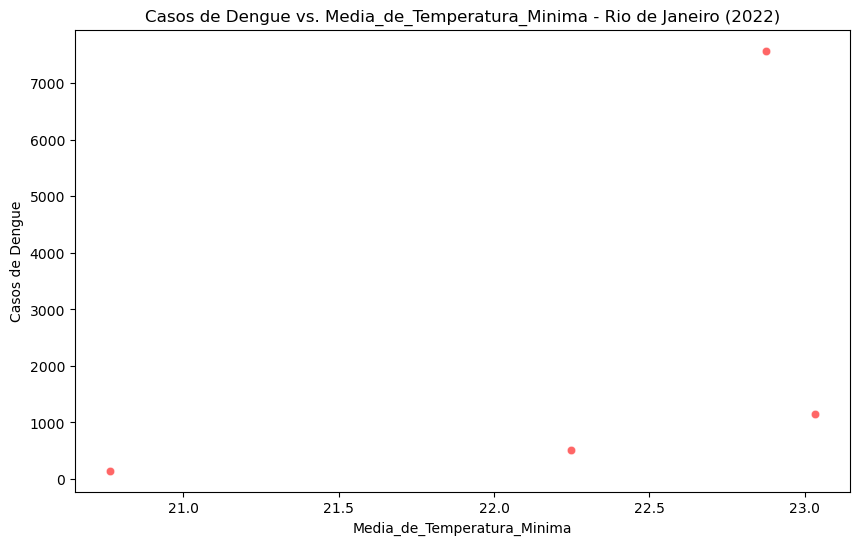

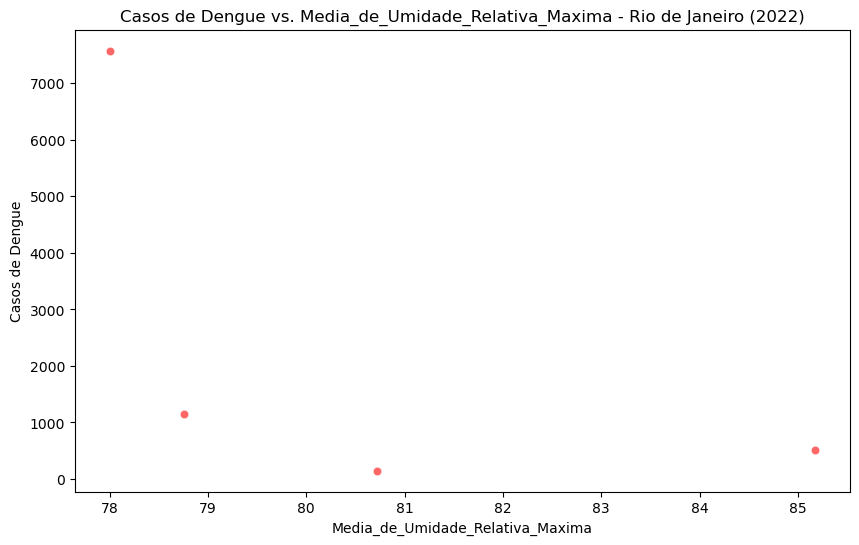

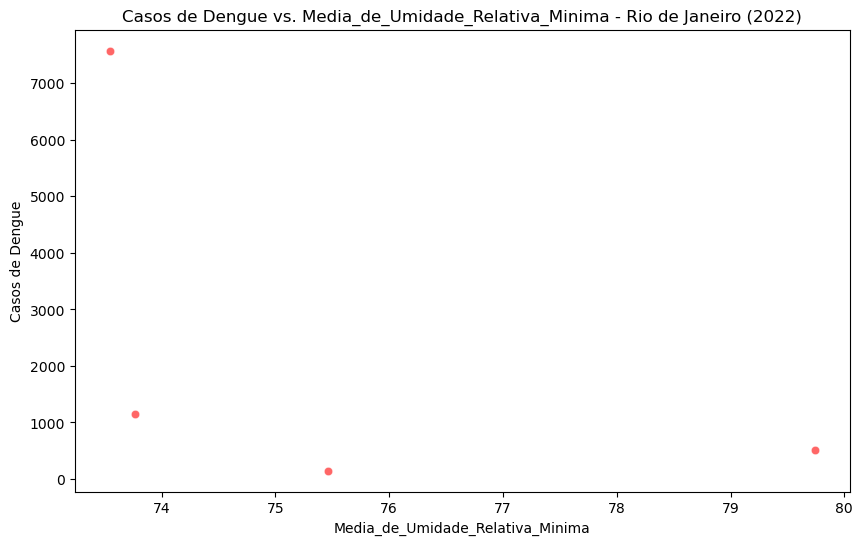

Análise descritiva para o ano 2023 - Rio de Janeiro:
              Casos  População_Total  Media_de_Precipitação  \
count      4.000000     4.000000e+00               4.000000   
mean   13805.000000     1.623775e+08               0.157505   
std    20144.447275     3.058743e+08               0.064956   
min       80.000000     4.835400e+06               0.091406   
25%     2456.000000     6.315450e+06               0.119900   
50%     5774.000000     1.177610e+07               0.147439   
75%    17123.000000     1.678381e+08               0.185044   
max    43592.000000     6.211223e+08               0.243733   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                     4.000000                     4.000000   
mean                     24.084570                    23.001989   
std                       0.847162                     0.900210   
min                      22.913661                    21.731112   
25%                      23.745727          

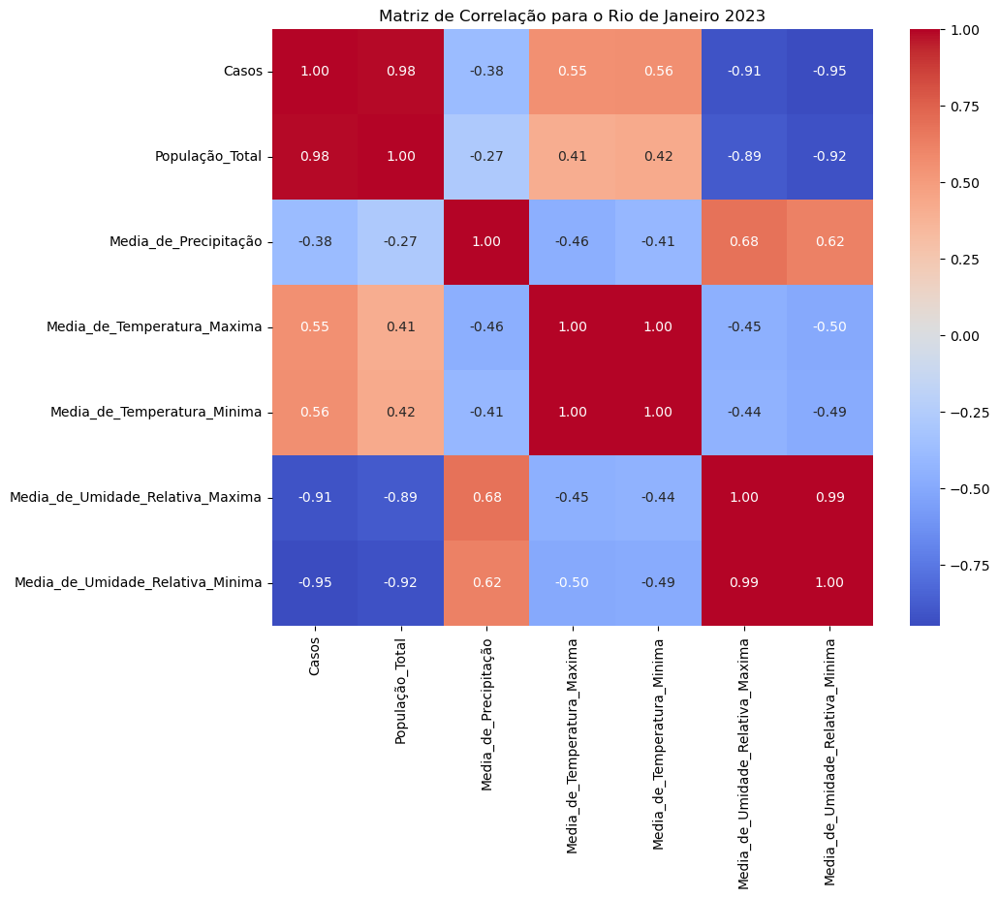

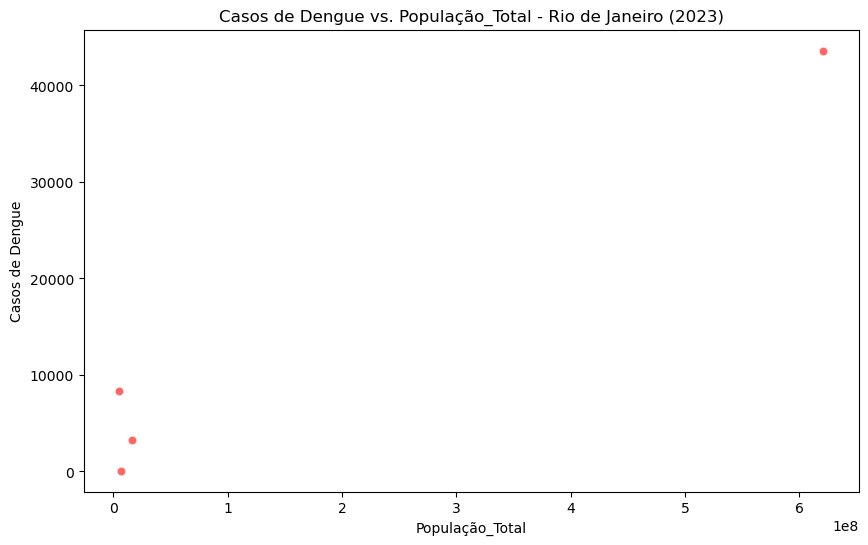

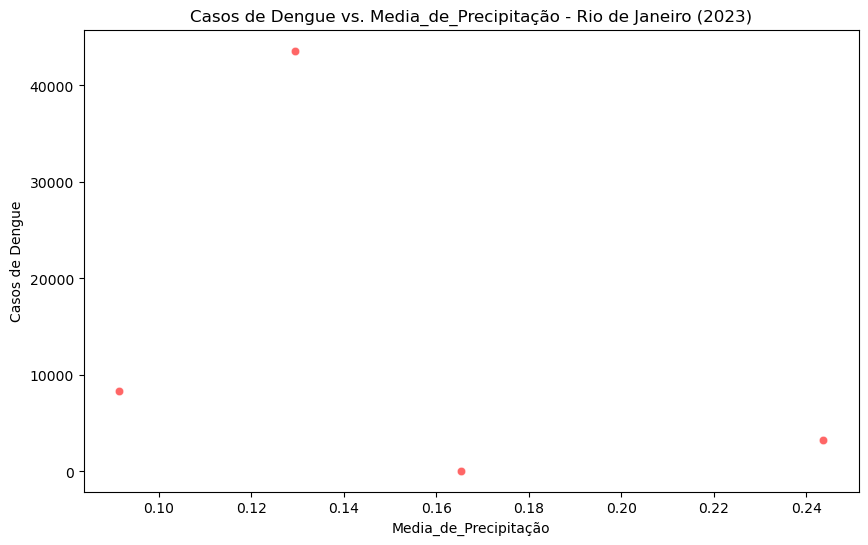

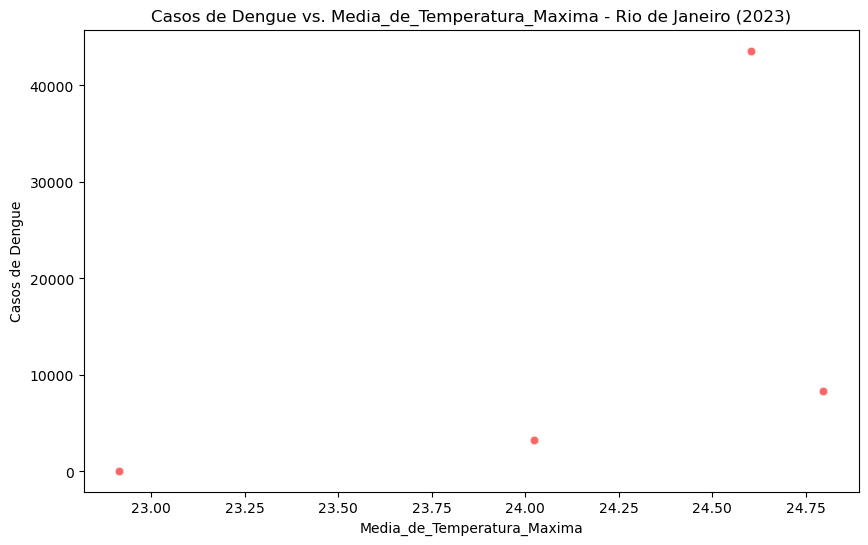

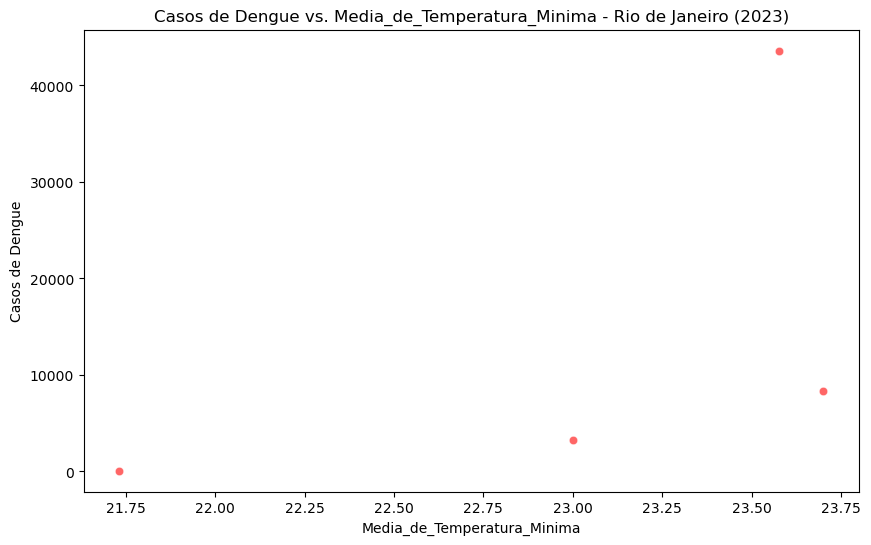

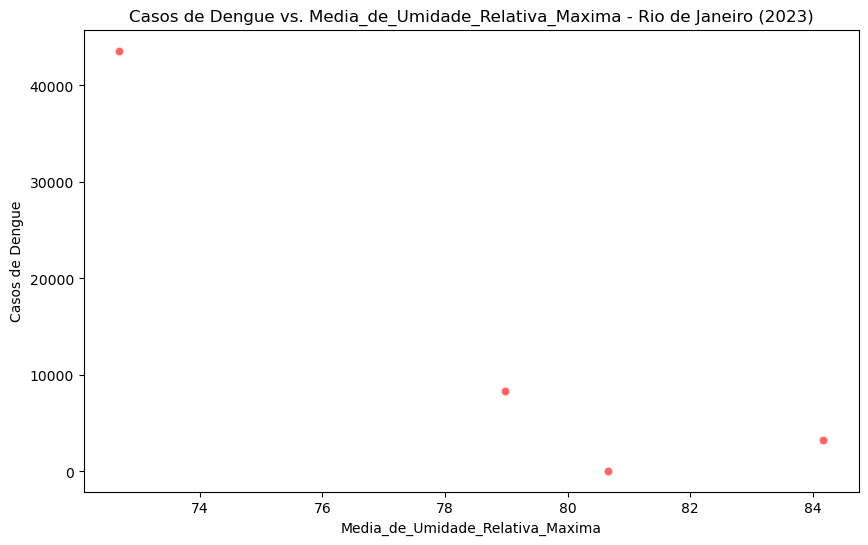

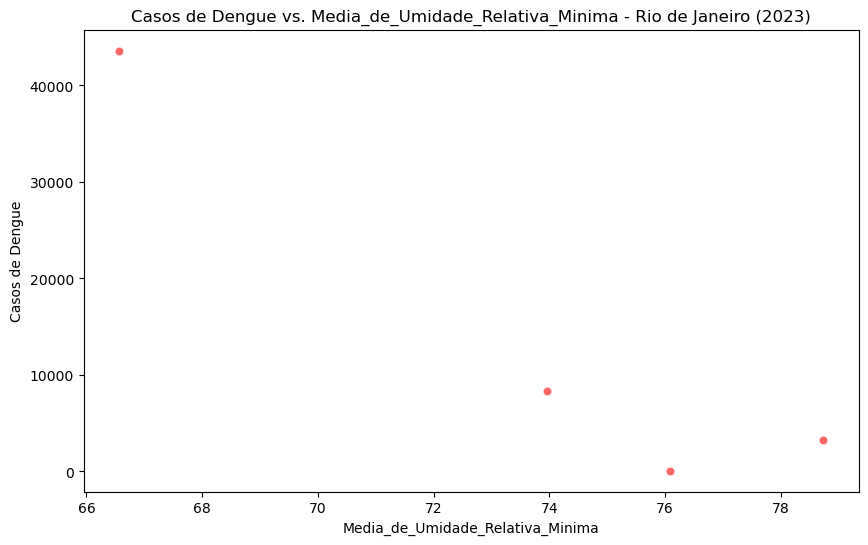

Análise descritiva para o ano 2019 - Distrito Federal:
             Casos  População_Total  Media_de_Precipitação  \
count    31.000000     3.100000e+01              31.000000   
mean   1386.774194     8.350006e+06               0.152383   
std    1313.197134     8.444581e+06               0.009801   
min       6.000000     4.356000e+05               0.136123   
25%     403.000000     3.110050e+06               0.142459   
50%     862.000000     5.208900e+06               0.156610   
75%    1973.000000     1.137690e+07               0.156610   
max    5667.000000     4.059320e+07               0.173248   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    31.000000                    31.000000   
mean                     22.877500                    21.330659   
std                       0.233489                     0.177720   
min                      22.669062                    21.049325   
25%                      22.708829                 

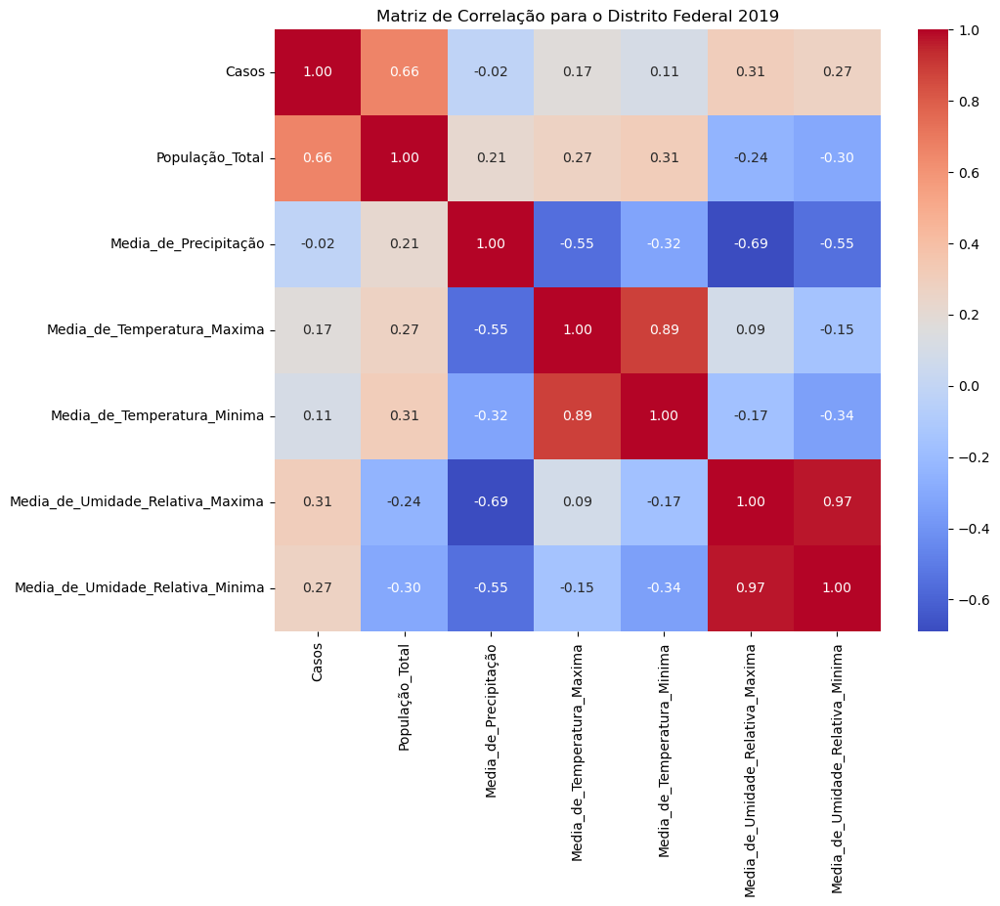

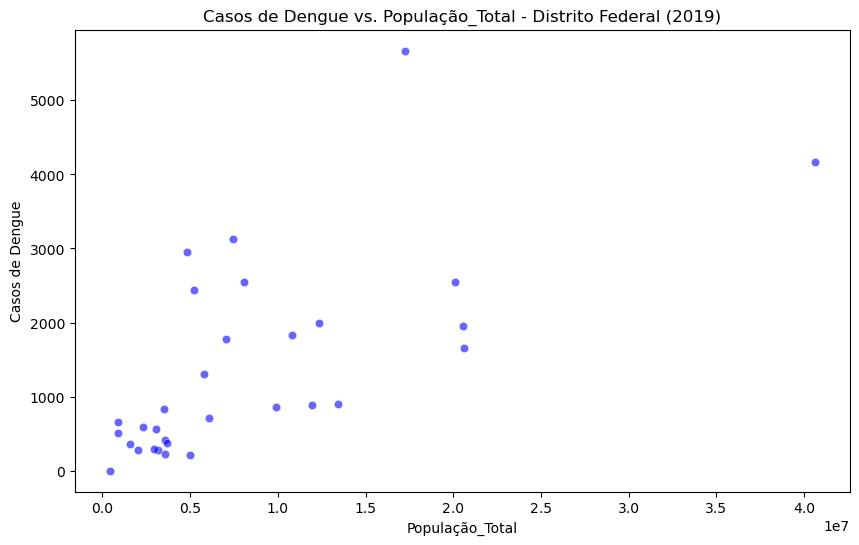

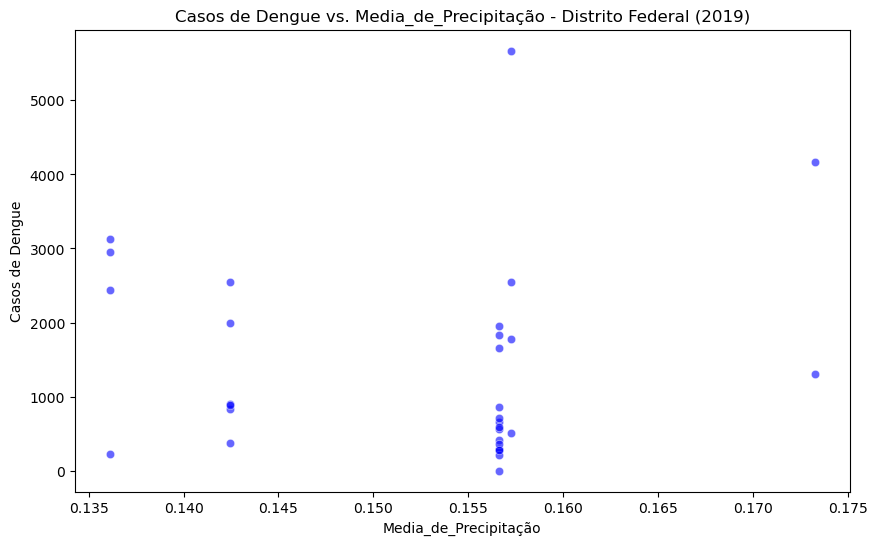

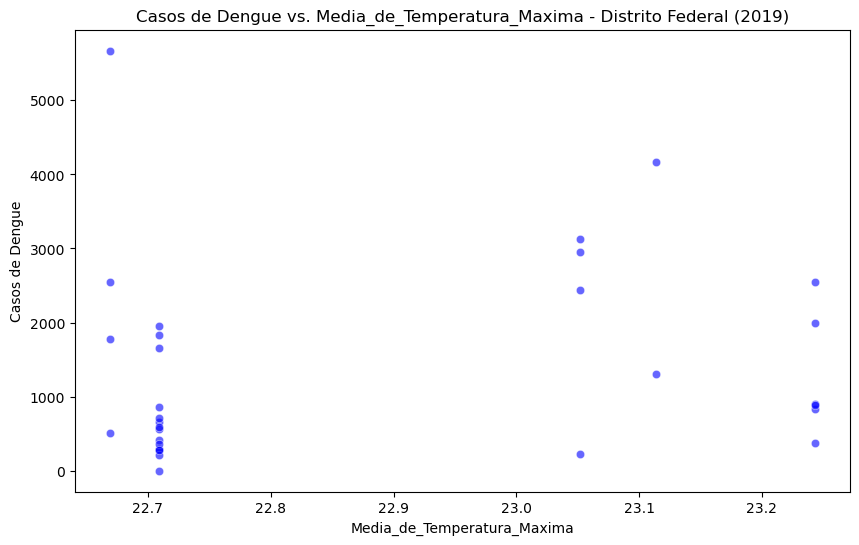

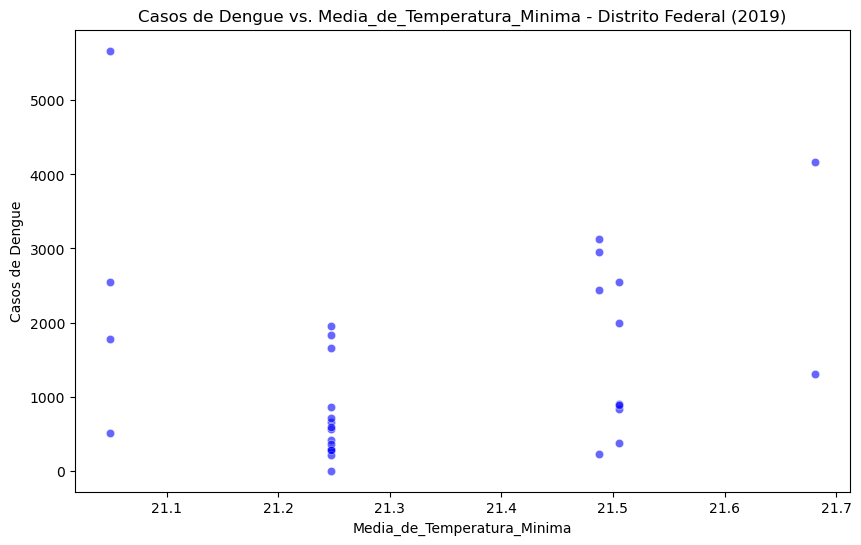

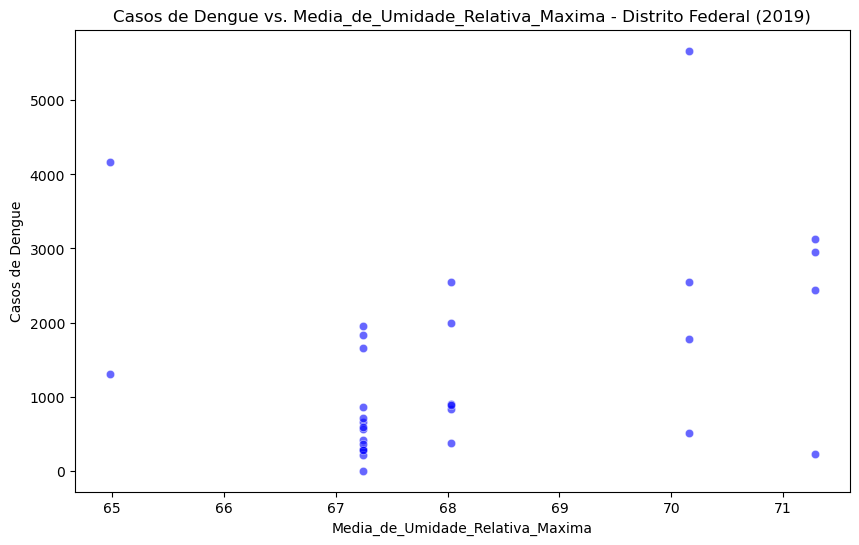

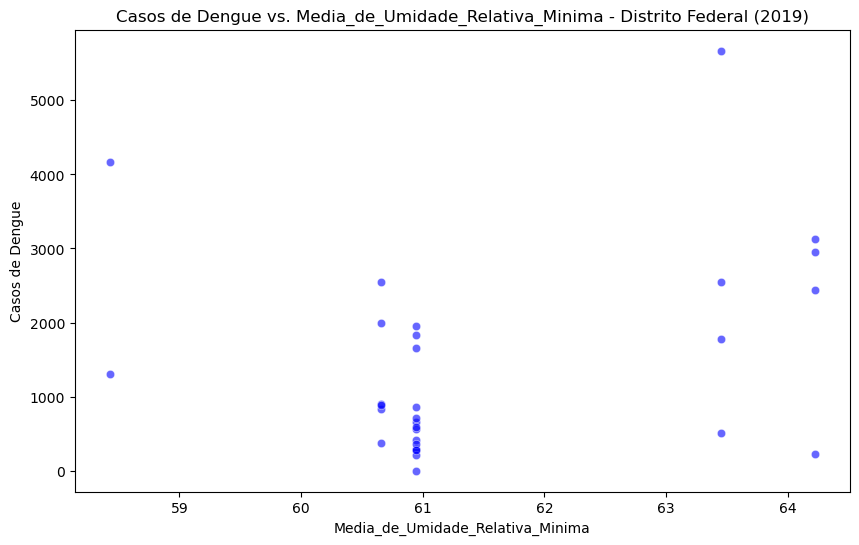

Análise descritiva para o ano 2020 - Distrito Federal:
             Casos  População_Total  Media_de_Precipitação  \
count    31.000000     3.100000e+01              31.000000   
mean   1515.290323     8.350006e+06               0.202141   
std    1500.405083     8.444581e+06               0.029323   
min      14.000000     4.356000e+05               0.179485   
25%     310.000000     3.110050e+06               0.179485   
50%     648.000000     5.208900e+06               0.183039   
75%    2656.000000     1.137690e+07               0.223736   
max    5249.000000     4.059320e+07               0.253346   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    31.000000                    31.000000   
mean                     22.269337                    20.809311   
std                       0.332090                     0.254696   
min                      22.030565                    20.471190   
25%                      22.054041                 

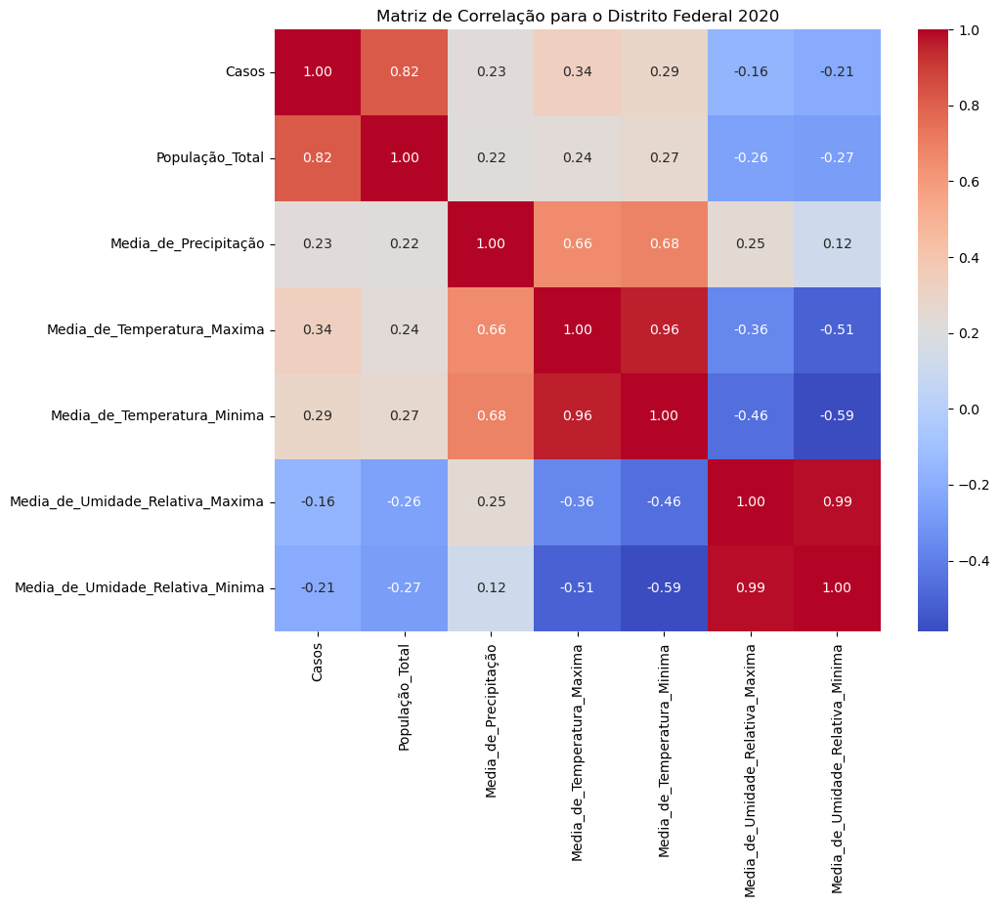

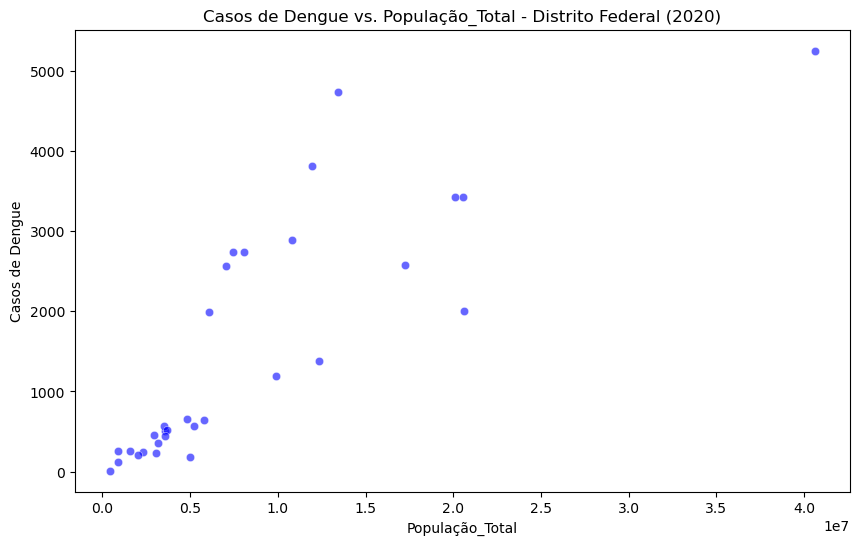

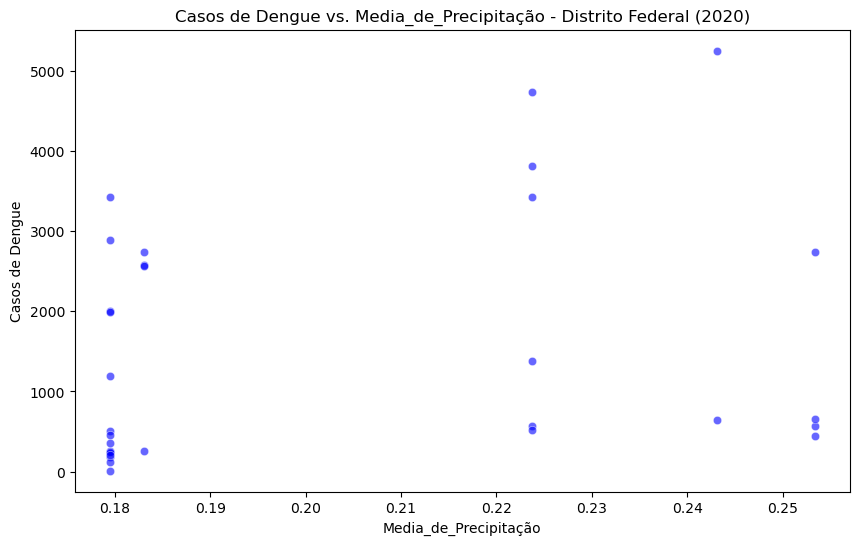

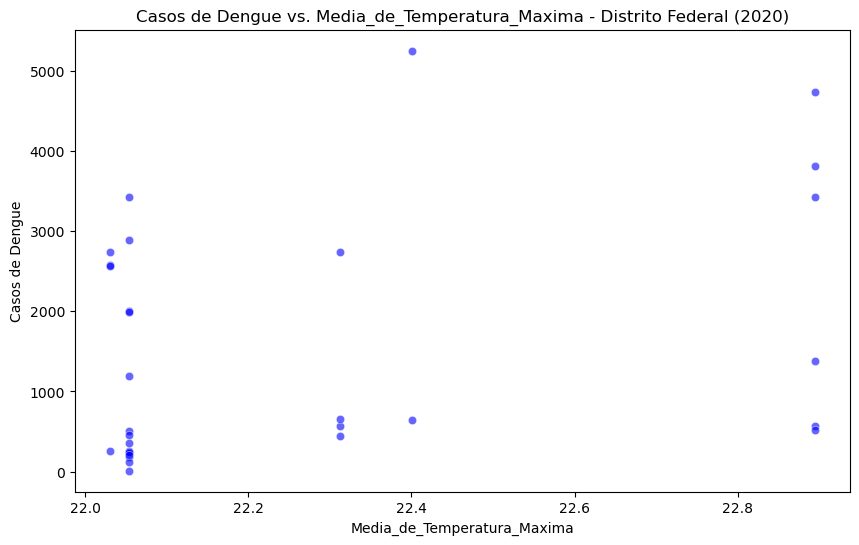

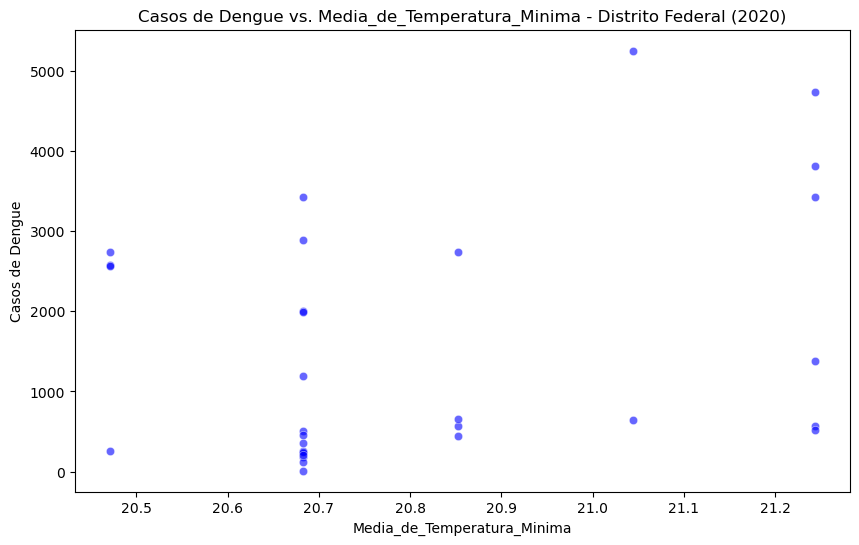

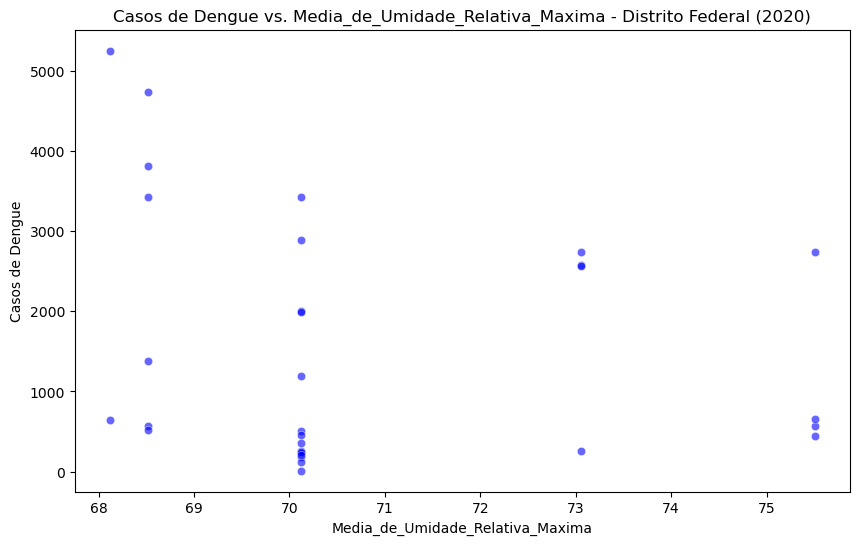

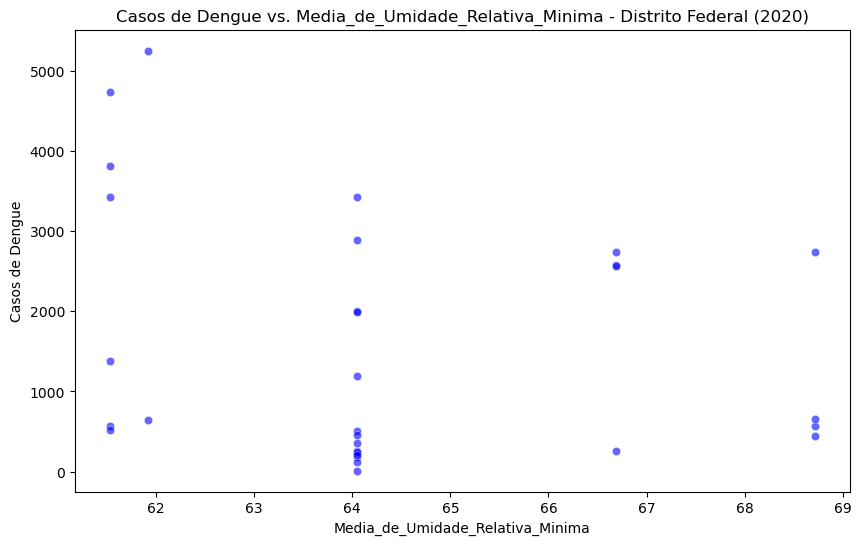

Análise descritiva para o ano 2021 - Distrito Federal:
             Casos  População_Total  Media_de_Precipitação  \
count    31.000000     3.100000e+01              31.000000   
mean    523.612903     8.350006e+06               0.205220   
std     695.891020     8.444581e+06               0.031035   
min      12.000000     4.356000e+05               0.164151   
25%     100.500000     3.110050e+06               0.164453   
50%     244.000000     5.208900e+06               0.230985   
75%     655.000000     1.137690e+07               0.230985   
max    3395.000000     4.059320e+07               0.235389   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    31.000000                    31.000000   
mean                     22.201133                    20.679649   
std                       0.339892                     0.281749   
min                      21.926774                    20.297989   
25%                      21.960477                 

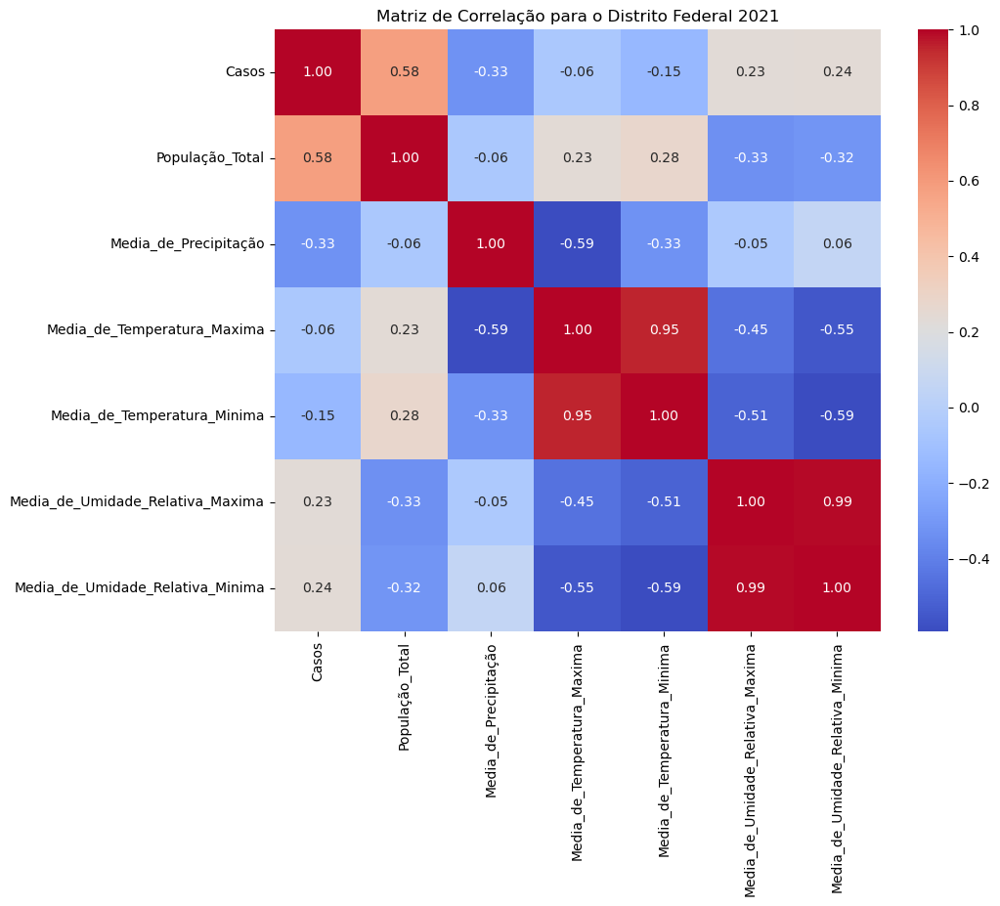

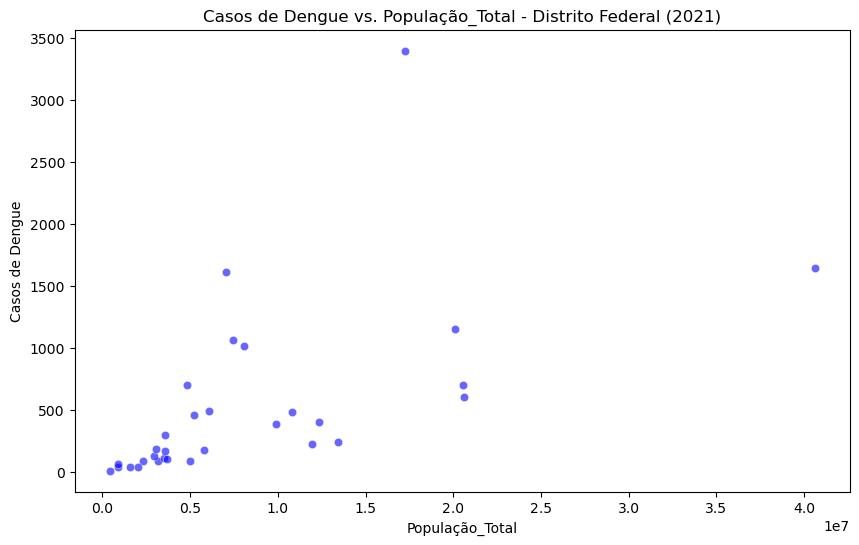

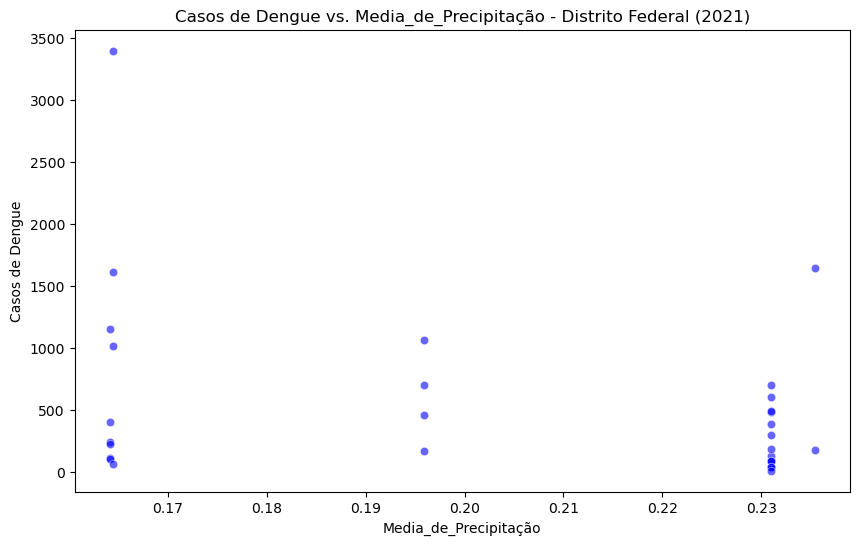

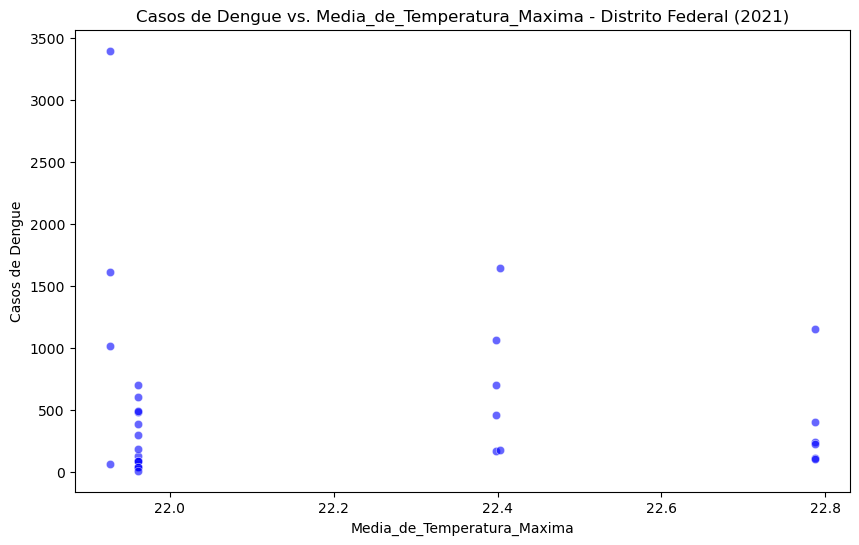

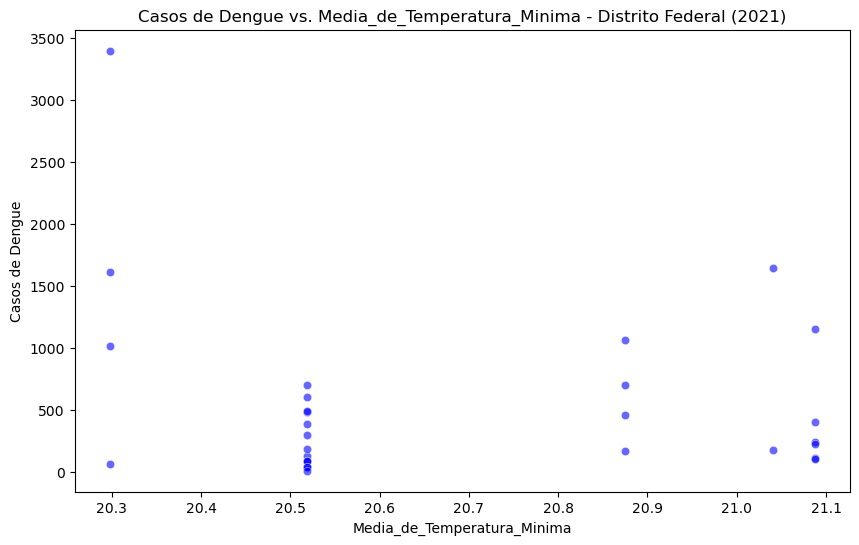

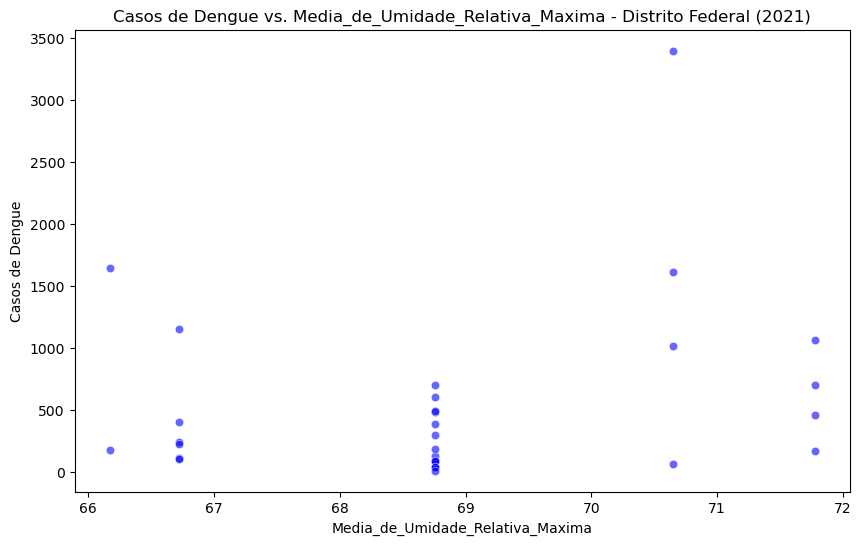

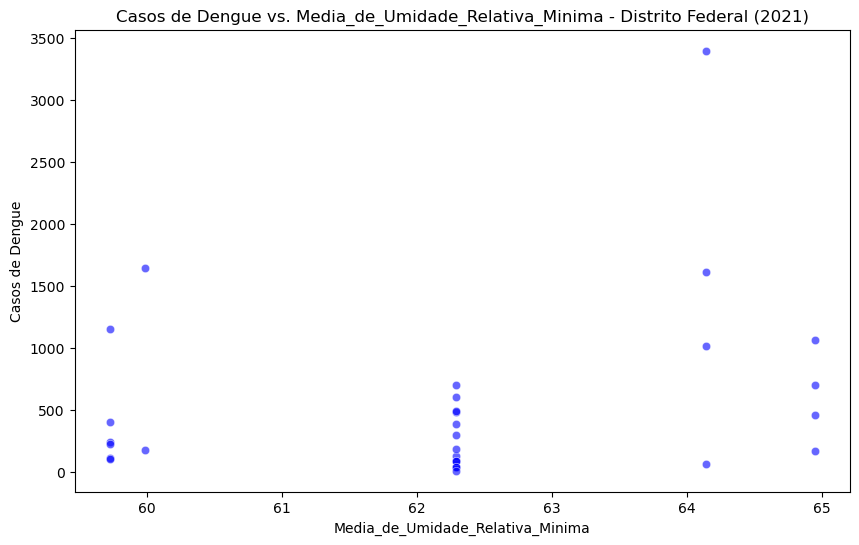

Análise descritiva para o ano 2022 - Distrito Federal:
              Casos  População_Total  Media_de_Precipitação  \
count     31.000000     3.100000e+01              31.000000   
mean    1872.967742     8.350006e+06               0.150990   
std     2355.210217     8.444581e+06               0.011556   
min       11.000000     4.356000e+05               0.122845   
25%      516.000000     3.110050e+06               0.151786   
50%      848.000000     5.208900e+06               0.154858   
75%     2316.500000     1.137690e+07               0.155954   
max    11499.000000     4.059320e+07               0.164640   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    31.000000                    31.000000   
mean                     22.218747                    20.671804   
std                       0.332754                     0.276574   
min                      21.968577                    20.304301   
25%                      21.999247        

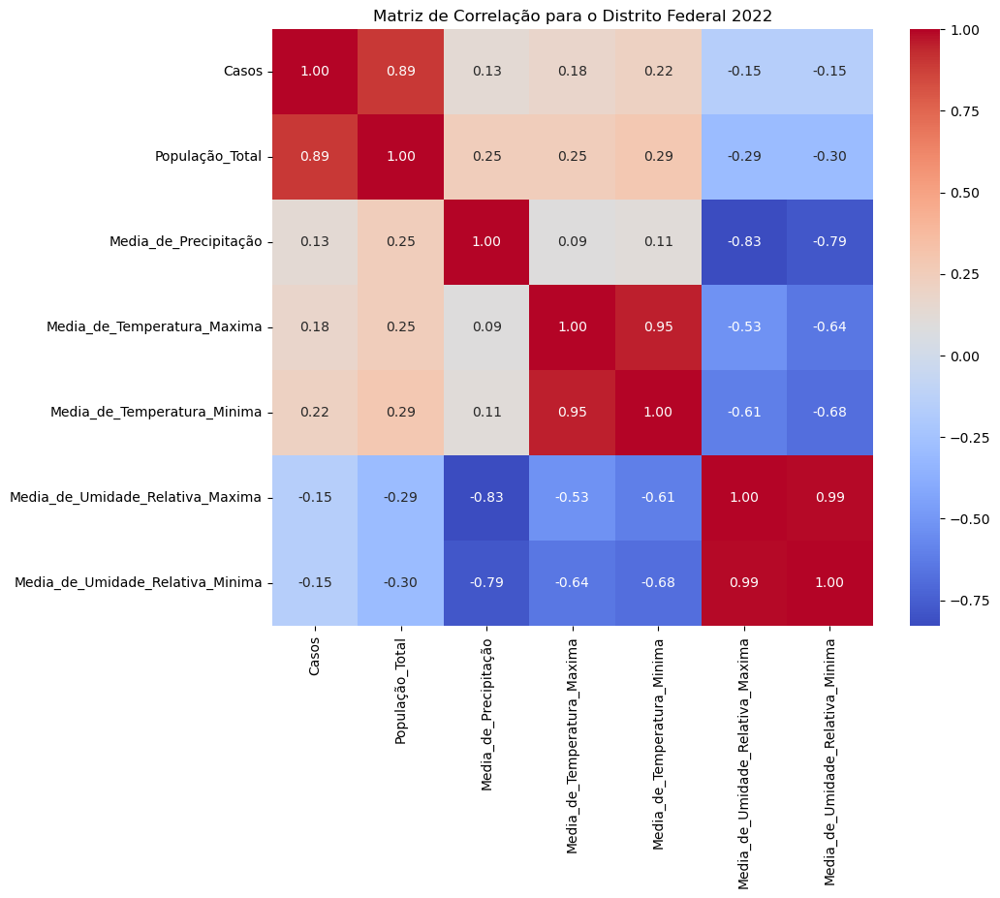

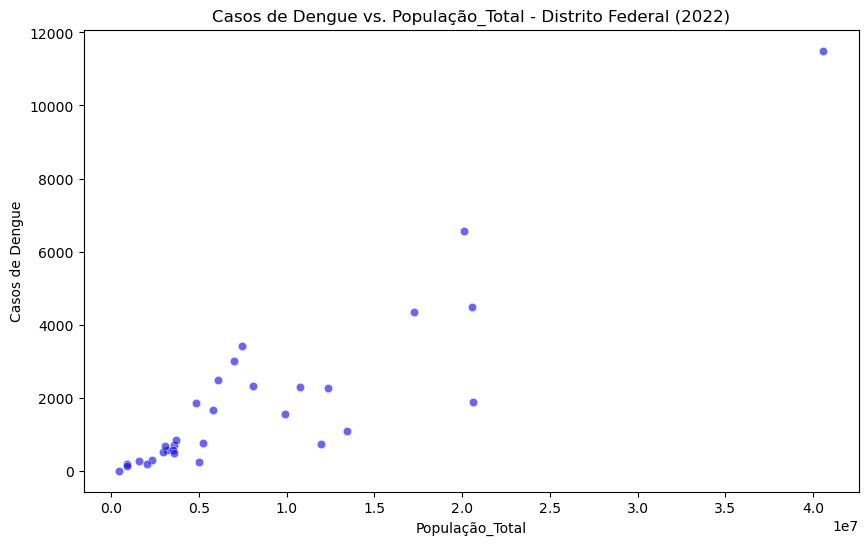

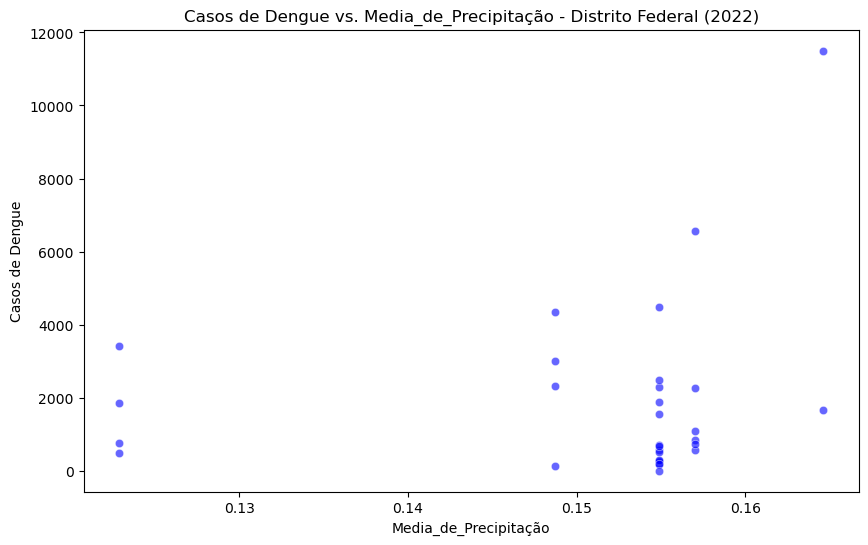

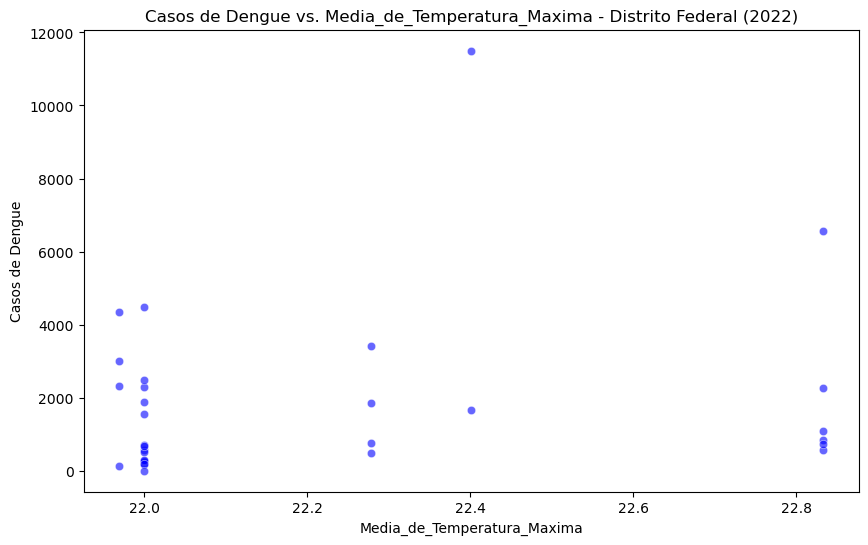

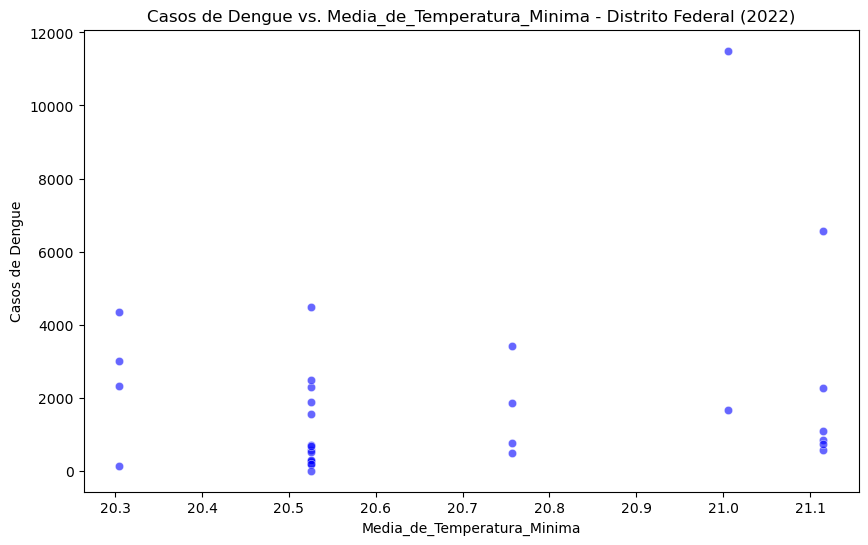

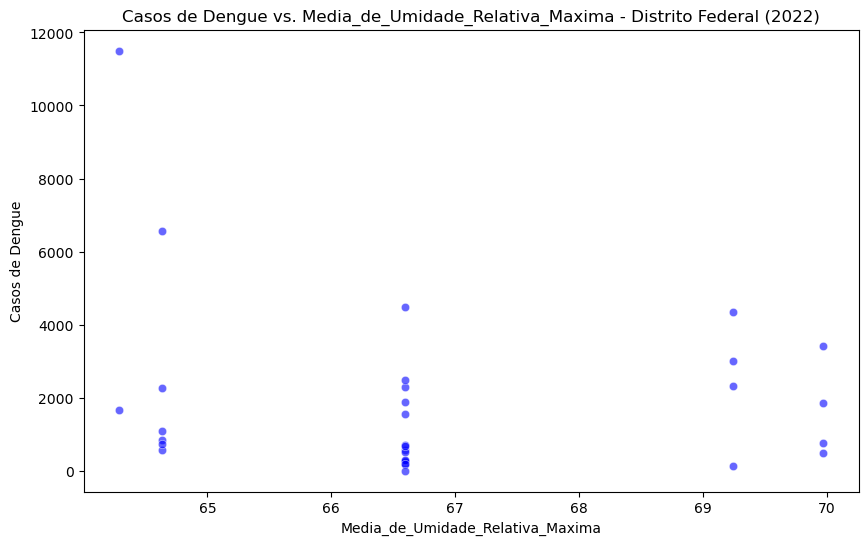

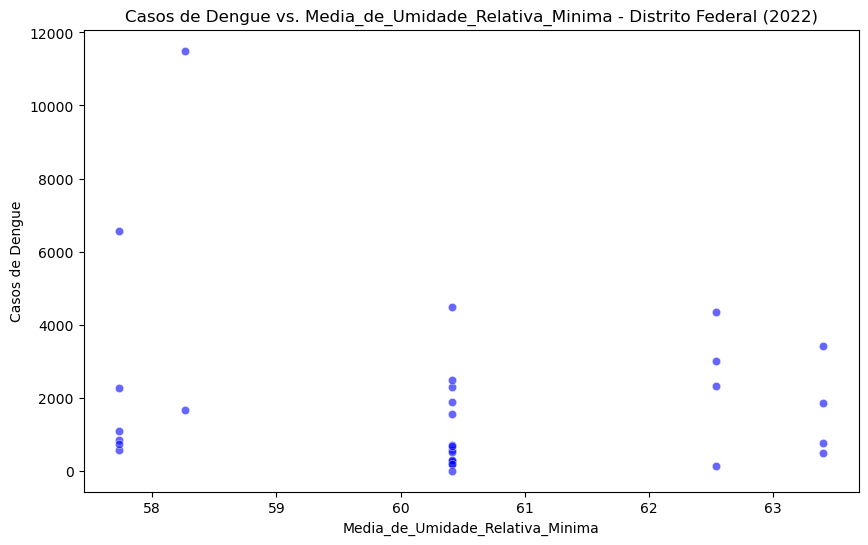

Análise descritiva para o ano 2023 - Distrito Federal:
             Casos  População_Total  Media_de_Precipitação  \
count    31.000000     3.100000e+01              31.000000   
mean   1059.677419     8.350006e+06               0.122183   
std    1201.754395     8.444581e+06               0.014554   
min       8.000000     4.356000e+05               0.106678   
25%     211.000000     3.110050e+06               0.113764   
50%     725.000000     5.208900e+06               0.113764   
75%    1396.500000     1.137690e+07               0.132877   
max    5280.000000     4.059320e+07               0.154056   

       Media_de_Temperatura_Maxima  Media_de_Temperatura_Minima  \
count                    31.000000                    31.000000   
mean                     22.984584                    21.385738   
std                       0.280697                     0.222444   
min                      22.735544                    21.207454   
25%                      22.735544                 

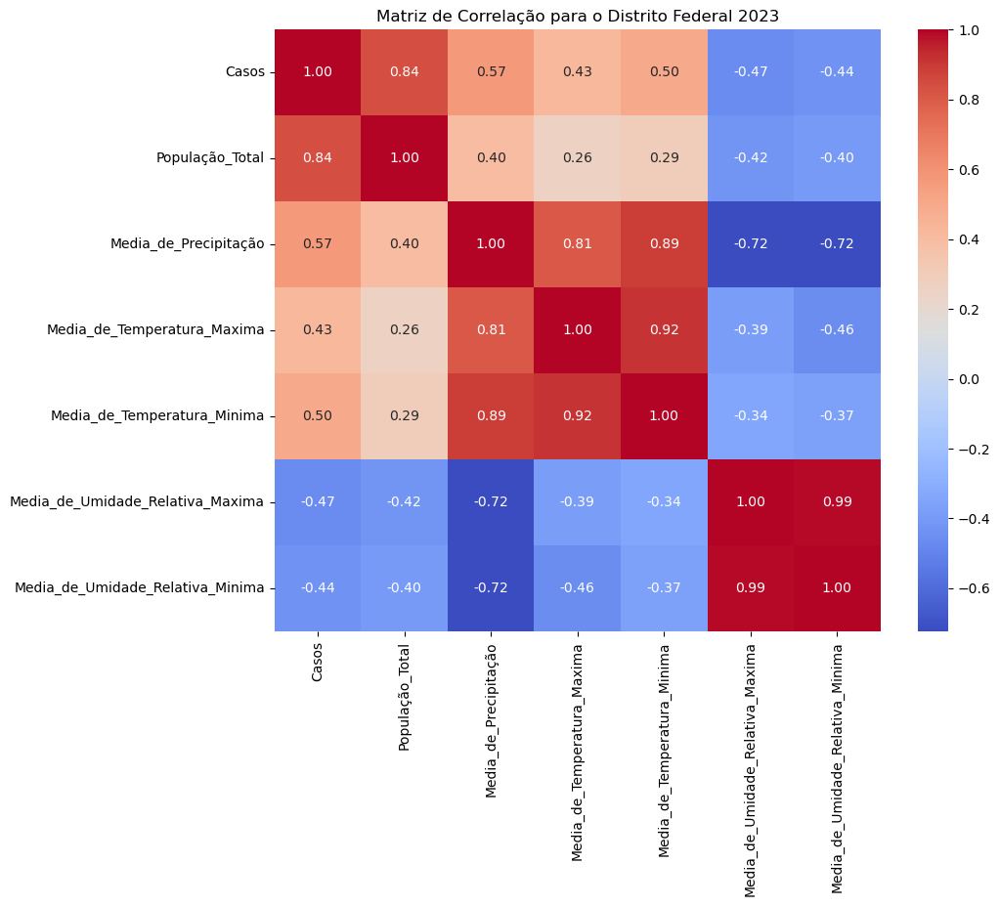

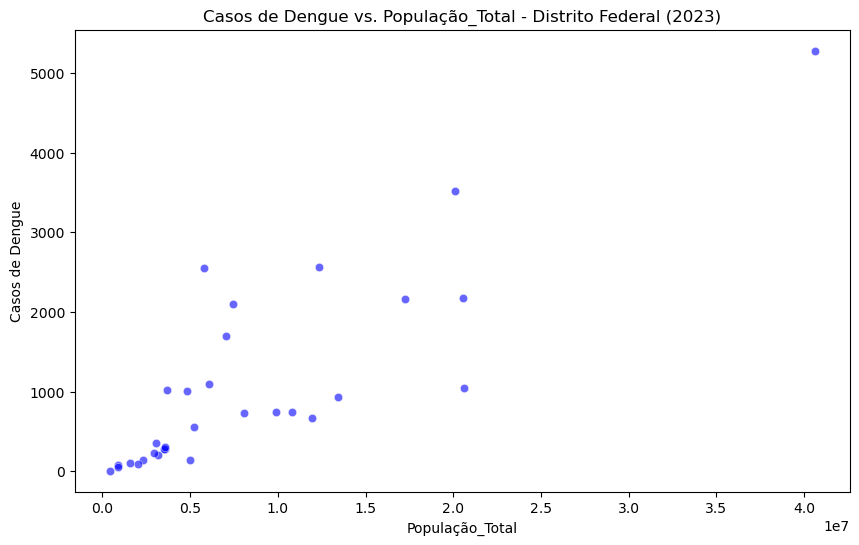

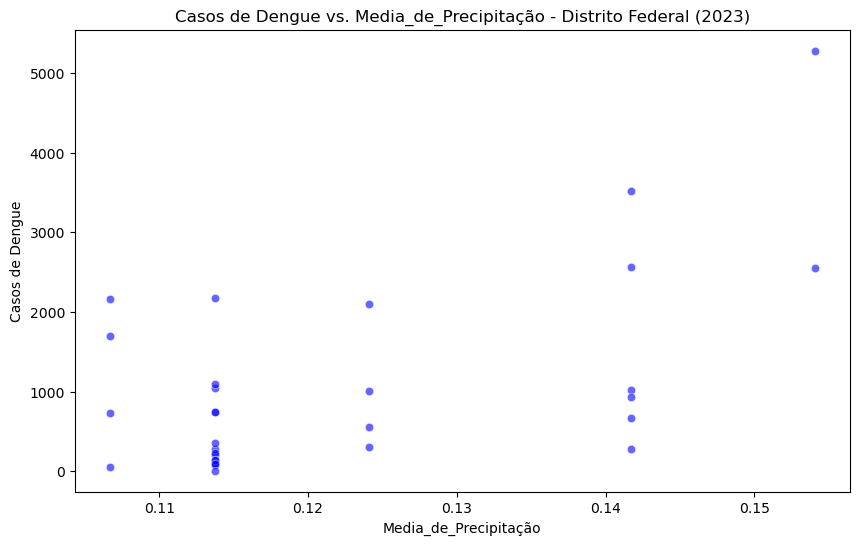

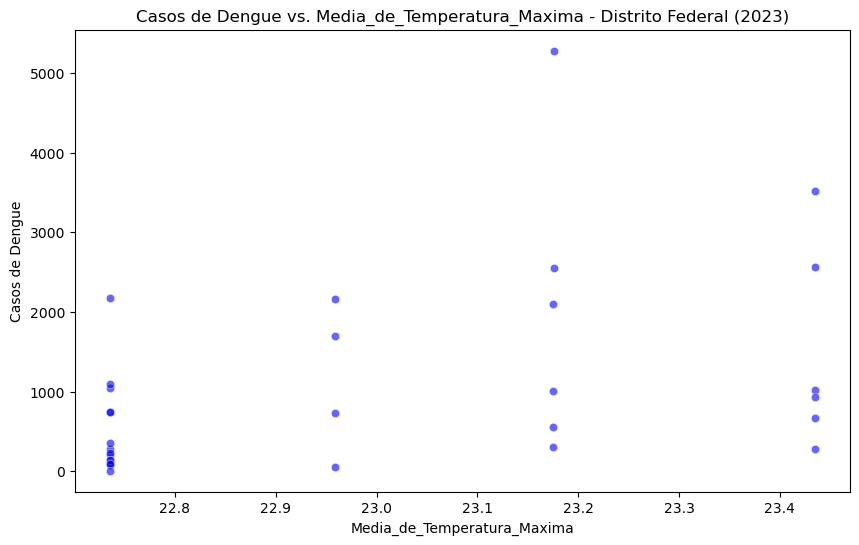

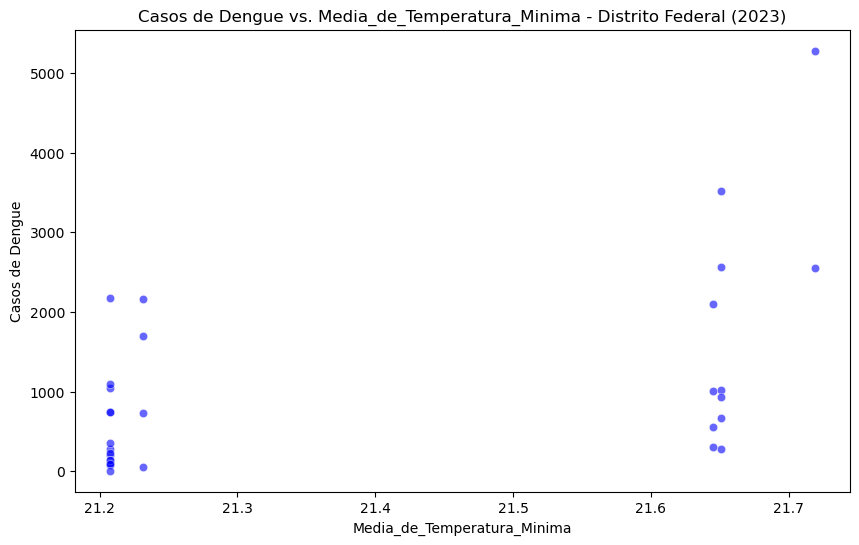

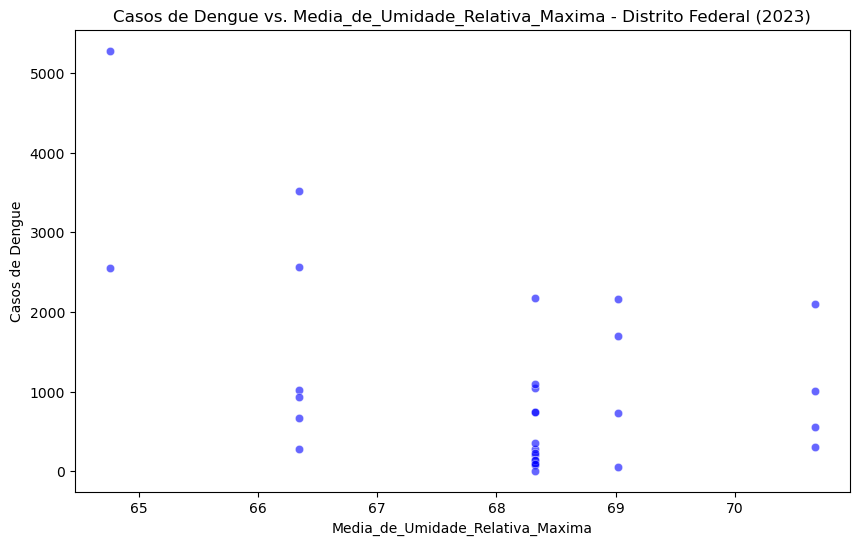

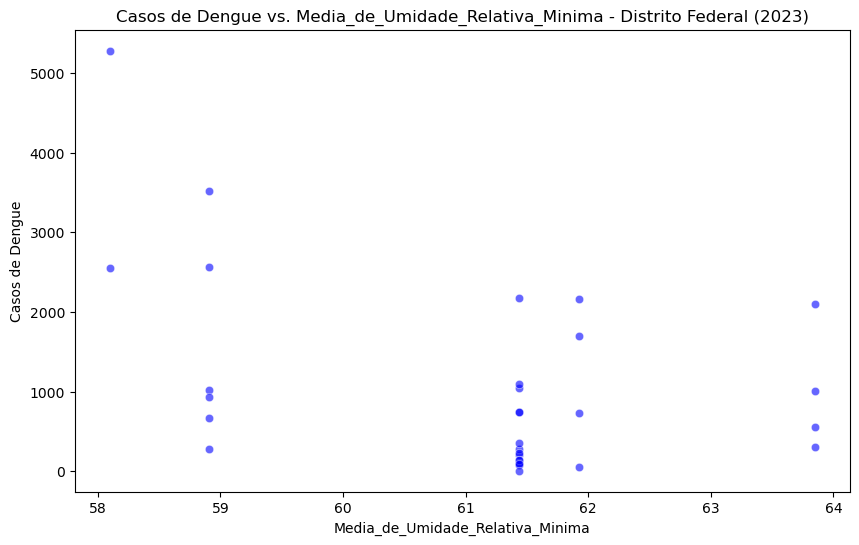

In [32]:
def processar_ano_rio_sem_normalizacao(ano):
    file_path_resultados = f'tabela_saude_sem_normalizacao_{ano}.csv'
    df = pd.read_csv(file_path_resultados)

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])
    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    print(f"Análise descritiva para o ano {ano} - Rio de Janeiro:")
    df_rio = df_relevante.iloc[-4:]  # Últimos 4 registros para Rio de Janeiro
    print(df_rio.describe())

    numerical_df_rio = df_rio.select_dtypes(include=[np.number])
    correlation_matrix_rio = numerical_df_rio.corr()
    print(f"\nMatriz de correlação para o Rio de Janeiro {ano}:")
    print(correlation_matrix_rio)

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix_rio, annot=True, fmt=".2f", cmap='coolwarm')
    plt.title(f'Matriz de Correlação para o Rio de Janeiro {ano}')
    plt.show()

    features = [
        'População_Total',
        'Media_de_Precipitação', 
        'Media_de_Temperatura_Maxima',
        'Media_de_Temperatura_Minima', 
        'Media_de_Umidade_Relativa_Maxima',
        'Media_de_Umidade_Relativa_Minima'
    ]

    for feature in features:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df_rio, x=feature, y='Casos', color='red', alpha=0.6)
        plt.title(f'Casos de Dengue vs. {feature} - Rio de Janeiro ({ano})')
        plt.xlabel(feature)
        plt.ylabel('Casos de Dengue')
        plt.show()

def processar_ano_df_sem_normalizacao(ano):
    file_path_resultados = f'tabela_saude_sem_normalizacao_{ano}.csv'
    df = pd.read_csv(file_path_resultados)

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])
    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    print(f"Análise descritiva para o ano {ano} - Distrito Federal:")
    df_df = df_relevante.iloc[:-4]  # Todos os registros menos os últimos 4
    print(df_df.describe())

    numerical_df_df = df_df.select_dtypes(include=[np.number])
    correlation_matrix_df = numerical_df_df.corr()
    print(f"\nMatriz de correlação para o Distrito Federal {ano}:")
    print(correlation_matrix_df)

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix_df, annot=True, fmt=".2f", cmap='coolwarm')
    plt.title(f'Matriz de Correlação para o Distrito Federal {ano}')
    plt.show()

    features = [
        'População_Total',
        'Media_de_Precipitação', 
        'Media_de_Temperatura_Maxima',
        'Media_de_Temperatura_Minima', 
        'Media_de_Umidade_Relativa_Maxima',
        'Media_de_Umidade_Relativa_Minima'
    ]

    for feature in features:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df_df, x=feature, y='Casos', color='blue', alpha=0.6)
        plt.title(f'Casos de Dengue vs. {feature} - Distrito Federal ({ano})')
        plt.xlabel(feature)
        plt.ylabel('Casos de Dengue')
        plt.show()

# Exemplo de chamada das funções
for ano in anos:
    processar_ano_rio_sem_normalizacao(ano)
for ano in anos:
    processar_ano_df_sem_normalizacao(ano)


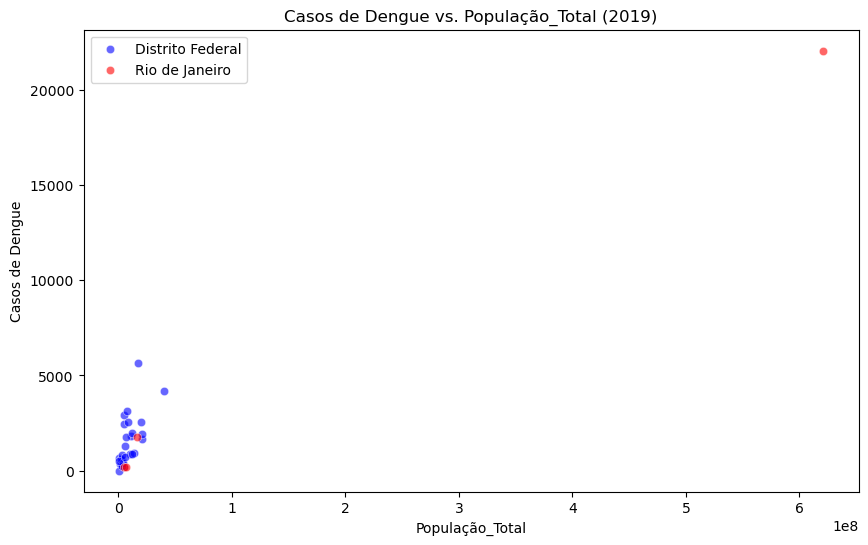

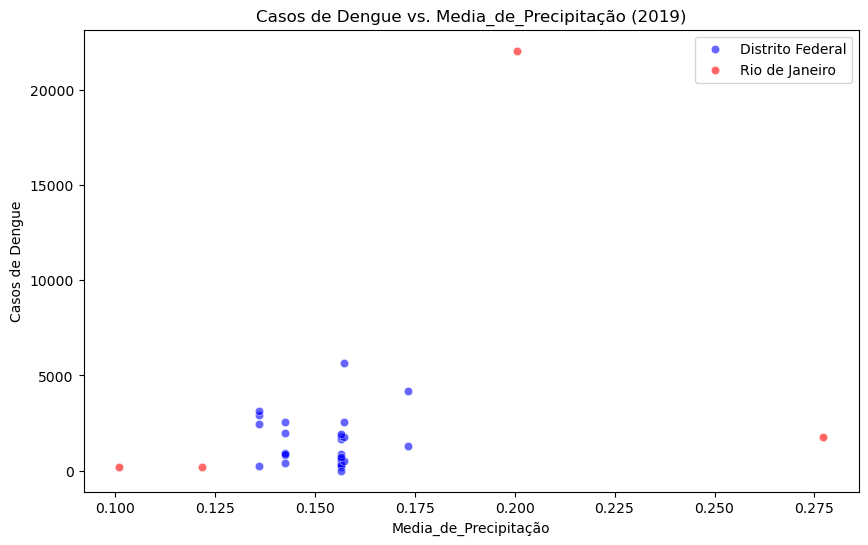

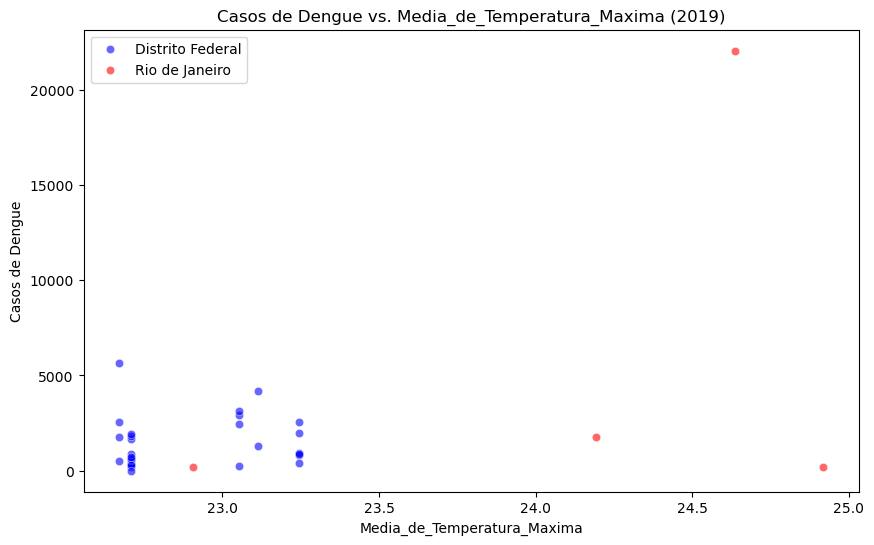

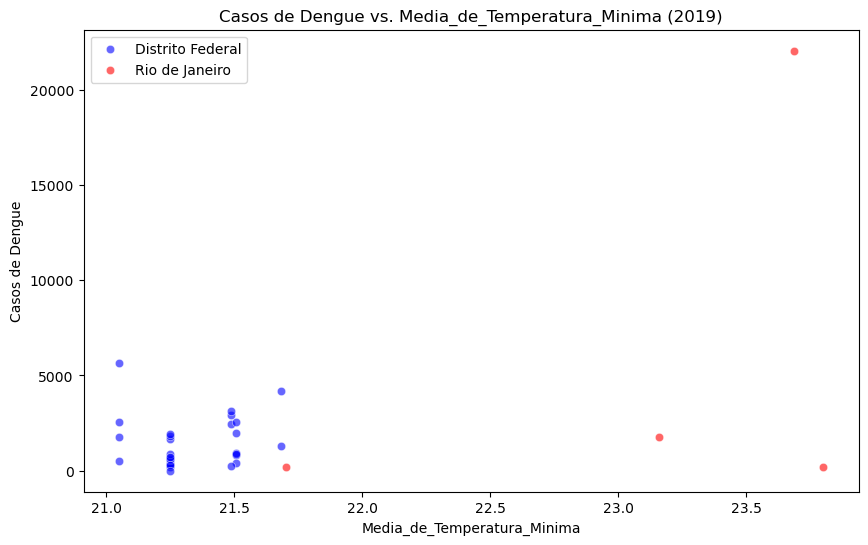

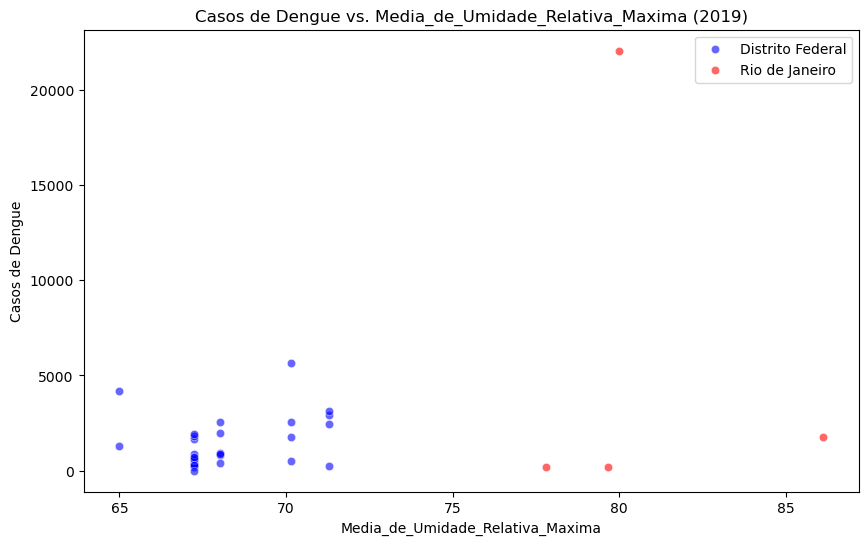

...

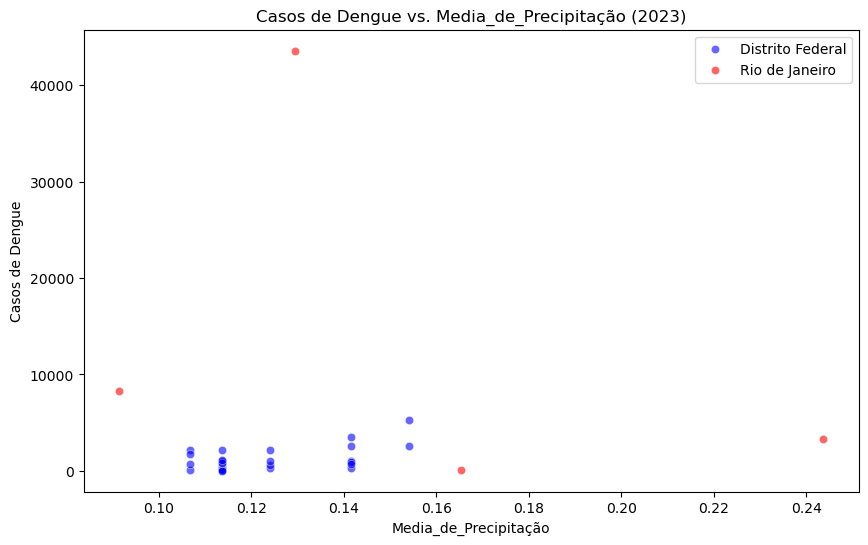

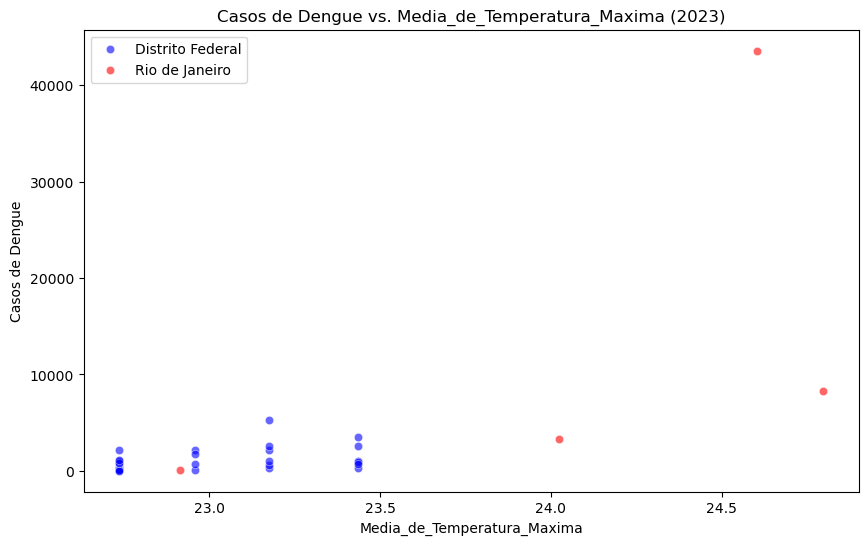

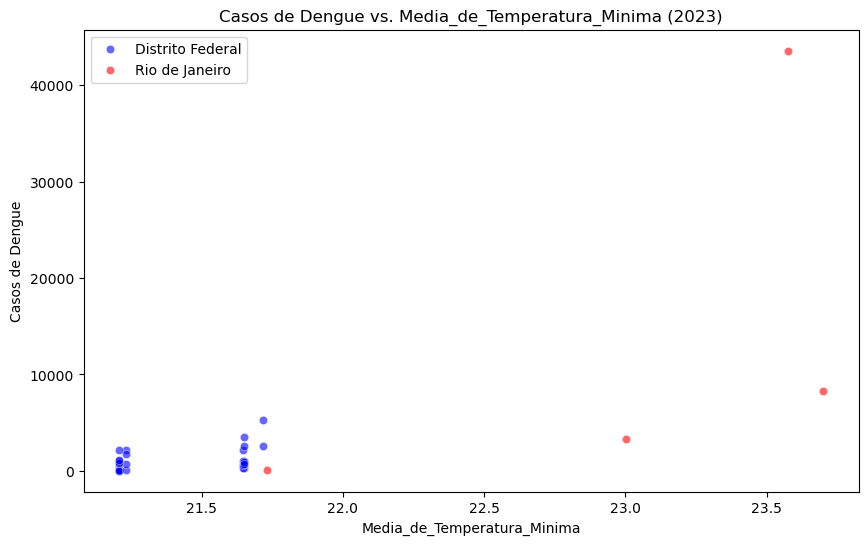

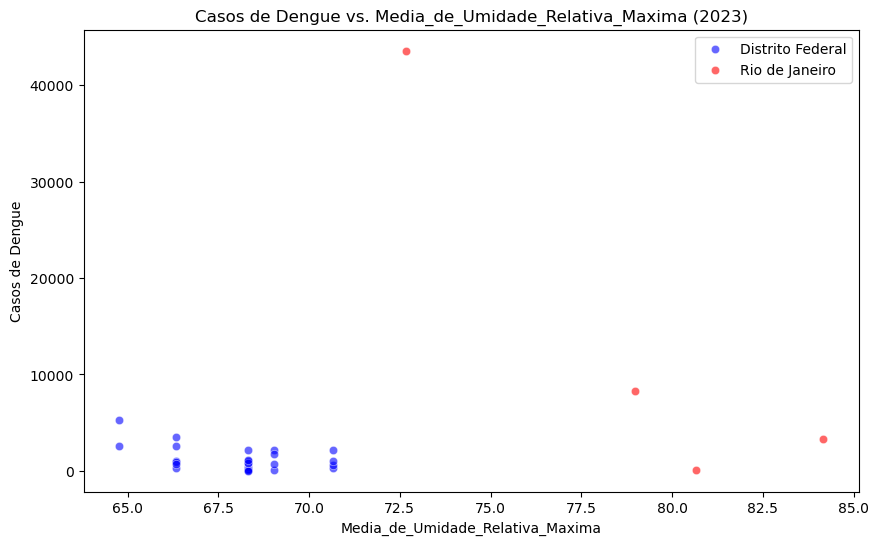

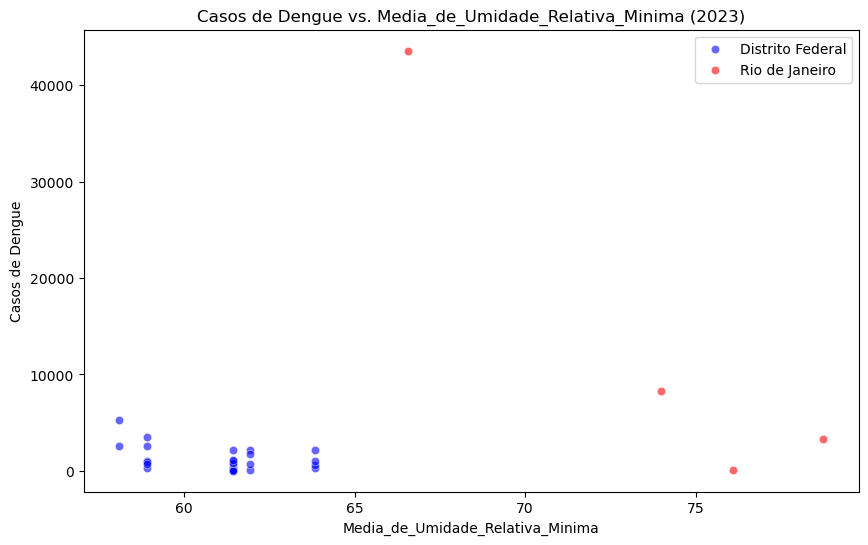

In [33]:
def processar_ano_comparativo(ano):
    file_path_resultados = f'tabela_saude_sem_normalizacao_{ano}.csv'
    df = pd.read_csv(file_path_resultados)

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])
    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    # Separa os dados do Rio de Janeiro e do restante do DF
    df_rio = df_relevante.iloc[-4:]  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4]    # Todos os registros menos os últimos 4

    features = [
        'População_Total',
        'Media_de_Precipitação', 
        'Media_de_Temperatura_Maxima',
        'Media_de_Temperatura_Minima', 
        'Media_de_Umidade_Relativa_Maxima',
        'Media_de_Umidade_Relativa_Minima'
    ]

    for feature in features:
        plt.figure(figsize=(10, 6))

        # Gráfico para o Distrito Federal
        sns.scatterplot(data=df_df, x=feature, y='Casos', label='Distrito Federal', color='blue', alpha=0.6)

        # Gráfico para o Rio de Janeiro
        sns.scatterplot(data=df_rio, x=feature, y='Casos', label='Rio de Janeiro', color='red', alpha=0.6)

        plt.title(f'Casos de Dengue vs. {feature} ({ano})')
        plt.xlabel(feature)
        plt.ylabel('Casos de Dengue')
        plt.legend()
        plt.show()

for ano in anos:
    processar_ano_comparativo(ano)